# Info
Name:  

    LeBlanc_2022_Airborne_KORUS_AOD_fine_coarse_autocorr_for_publication
    
Purpose:  

    For the KORUS-AQ paper publication, based on the preprint:   
    LeBlanc, S. E., Segal-Rozenhaimer, M., Redemann, J., Flynn, C. J., Johnson, R. R., Dunagan, S. E., Dahlgren, R., Kim, J., Choi, M., da Silva, A. M., Castellanos, P., Tan, Q., Ziemba, L., Thornhill, K. L., and Kacenelenbogen, M. S.: Airborne observation during KORUS-AQ show aerosol optical depth are more spatially self-consistent than aerosol intensive properties, Atmos. Chem. Phys. Discuss. [preprint], https://doi.org/10.5194/acp-2021-1012, in review, 2022.
    
    Analyse some of the AOD values from KORUS AQ by 4STAR, MERRA-2, GOCI YAER v2, and LARGE
    Split up between fine mode and coarse mode AOD
    Subset for level legs only
    Run autocorrelation values for the distance/time travelled 
      
Input:

    None at command line
  
Output:

    figures and save files...
  
Dependencies:

    - load_utils module in this same folder
    - 
    - matplotlib
    - numpy
    - scipy
    - pandas
  
Needed Files:

  - '/aod_ict/all_aod_KORUS_R2_ict.mat'
  - 
  
Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2019-05-18
    Modified: Samuel LeBlanc, Santa Cruz, CA, 2020-01-14
                Added plotting of maps statistics
    Modified: Samuel LeBlanc, Santa Cruz, CA, 2021-06-13
    Modified: Samuel LeBlanc, Santa Cruz, CA, 2021-11-05
                Added ocean/land mask for GOCI comparison
    Modified: Samuel LeBlanc, Santa Cruz, CA, 2022-04-12
                Added analysis for responding to reviewers. Simplification of the notebook to remove extranous pieces
    Modified: Samuel LeBlanc, Santa Cruz, CA, 2022-07-07
                Modified structure to fit publication sections, and removed extraneous sections and figures.

# Prepare python environment

In [1]:
import matplotlib 
import os
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from datetime import datetime, timedelta
from scipy import interpolate
from scipy.interpolate import UnivariateSpline

import matplotlib.dates as mdates
from matplotlib.ticker import ScalarFormatter,FormatStrFormatter
from mpl_toolkits.basemap import Basemap
import scipy.stats as st
import scipy.io as sio

import pandas as pd

from linfit import linfit
import hdf5storage as hs

import math
import sys

In [2]:
%matplotlib notebook

In [3]:
import Sp_parameters as Sp
from load_utils import mat2py_time, toutc, load_ict
import load_utils as lu
import plotting_utils as pu
from path_utils import getpath
import map_utils as mu
import write_utils as wu
import Sun_utils as su


In [4]:
#for multiprocessing
from multiprocessing import Pool, cpu_count
from tqdm.notebook import tqdm 
import signal

In [5]:
#for setting path and tracking analysis version
vv = 'v4'
fp = getpath('KORUS')

('Return path named: ', 'KORUS', u'/data/sam/KORUS-AQ/')


## Make some useful functions

### For multiprocessing

In [6]:
#for error handling in multiprocessing
class KeyboardInterruptError(Exception): pass

In [7]:
#for setup and error handling in multiprocessing in jupyter
def worker_init(verbose=True):
    # ignore the SIGINI in sub process, just print a log
    def sig_int(signal_num, frame):
        if verbose: 
            print 'signal: %s' % signal_num
        raise IOError
    signal.signal(signal.SIGINT, sig_int)

### For data splitting and analysis

In [74]:
def get_segments_by_time(index,doys,vals_dict,tsep=5.0/24.0/60.0/60.0,set_nan=True):
    'Function to seperate continuous segments (within a distance in doys of tsep) based on a prior index (default for 5 seconds in doy)'
    disc_flacaod_long = np.where(np.diff(doys[index],1)>tsep)[0]
    
    discontinuity_istart_long =  index[np.append(0,disc_flacaod_long[:-1]+1)]
    discontinuity_iend_long =  index[disc_flacaod_long]
    
    kv = vals_dict.keys()
    d = {k:[] for k in kv}
    for i,start in enumerate(discontinuity_istart_long): # loop through discontinuities 
        if discontinuity_iend_long[i]-start < 2: continue
        for k in kv: # loop through keys
            try:
                d[k].append(vals_dict[k][start:discontinuity_iend_long[i]])
            except:
                print start, discontinuity_iend_long[i]
                continue
                #d[k].append([np.nan])
    
    for k in kv:
        d[k] = np.array(d[k])
        
    return d

In [75]:
def running_std(x,n):
    'Function to do a running standard deviation on array (x) with window size (n)'
    q = x**2
    q = np.convolve(q, np.ones((n, )), mode="same")
    s = np.convolve(x, np.ones((n, )), mode="same")
    o = (q-s**2/n)/float(n-1)
    return o 

In [76]:
def make_binned(x,alt,fl,bn,flb):
    'Function to create binned data for a set range, usually for altitude'
    import numpy as np
    binned_ang,binned_alt,binned_num = [],[],[]
    for i,b in enumerate(bn[:-1]):
        flaa = (alt[flb]>=b) & (alt[flb]<bn[i+1])
        binned_ang.append(x[:,flb][flaa])
        binned_alt.append(np.mean([b,bn[i+1]]))
        binned_num.append(len(x[fl][:,flaa]))
    return binned_ang,binned_alt,binned_num,binned_ndays

In [77]:
def make_bined_alt(x,alt,days,fl,n=70,rg=None):
    'Function to create binned data for a set range, usually for altitude'
    binned_ang,binned_alt,binned_num,binned_ndays = [],[],[],[]
    if rg:
        dz = (rg[1]-rg[0])/n
    else:
        dz = np.nanmax(alt[fl])/n
        rg = [0.0,np.nanmax(alt[fl])]
    print np.nanmax(alt[fl]),dz
    for i in xrange(n):
        flaa = (alt[fl]>=(i*dz)+rg[0]) & (alt[fl]<((i+1.0)*dz)+rg[0])
        binned_ang.append(x[fl][flaa])
        binned_alt.append(np.mean([(i*dz)+rg[0],((i+1.0)*dz)+rg[0]]))
        binned_num.append(len(x[fl][flaa]))
        binned_ndays.append(len(np.unique(days[fl][flaa])))
    return binned_ang,binned_alt,binned_num,binned_ndays

In [78]:
def make_binned_byaod(x,aod,bn,flb,y=[]):
    """Function to create binned data for a set range, usually for aod
       - x is variable (prefiltered)
       - aod is variable to bin with
       - bn is bins
       - flb is filter on aod
       - y for an extra variable to average over those bins
    """
    import numpy as np
    binned_ang,binned_aod,binned_num = [],[],[]
    binned_extra = []
    if not any(y): y = aod[flb]    
    for i,b in enumerate(bn[:-1]):
        flaa = (aod[flb]>=b) & (aod[flb]<bn[i+1]) & (np.isfinite(x))
        binned_ang.append(x[flaa])
        binned_aod.append(np.mean([b,bn[i+1]]))
        binned_num.append(len(x[flaa]))
        binned_extra.append(np.nanmean(y[flaa]))
    return binned_ang,binned_aod,binned_num,binned_extra

In [79]:
def stats_2d(lat,lon,x,fl=[],bins=26,rg=[[-25,-8],[0,16]],days=[],verbose=True):
    "Combined Statistics function to get the mean, median, number, ndays, and std from a 2d dataset"
    import scipy.stats as st
    import numpy as np
    
    stat = {}
    if not len(fl)>0: fl = np.isfinite(x)
        
    stat['mean'],stat['xm'],stat['ym'],stat['bin'] = \
          st.binned_statistic_2d(lat[fl],lon[fl],x[fl],bins=bins,range=rg,statistic=np.nanmean)
    stat['mean'] = np.ma.masked_array(stat['mean'],np.isnan(stat['mean']))
    
    stat['median'],stat['xe'],stat['ye'],stat['bine'] = \
          st.binned_statistic_2d(lat[fl],lon[fl],x[fl],bins=bins,range=rg,statistic=np.nanmedian)
    stat['median'] = np.ma.masked_array(stat['median'],np.isnan(stat['median']))

    stat['std'],stat['xs'],stat['ys'],stat['bins'] = \
          st.binned_statistic_2d(lat[fl],lon[fl],x[fl],bins=bins,range=rg,statistic=np.nanstd)
    stat['std'] = np.ma.masked_array(stat['std'],np.isnan(stat['std']))
    
    stat['cnt'],stat['xn'],stat['yn'],stat['binn'] = \
          st.binned_statistic_2d(lat[fl],lon[fl],x[fl],bins=bins,range=rg,statistic='count')
    stat['cnt'] = np.ma.masked_array(stat['cnt'],np.isnan(stat['cnt']))

    if len(days)>0:
        uniq_cnt = lambda x: len(np.unique(x))
        stat['dcnt'],stat['xd'],stat['yd'],stat['bind'] = \
          st.binned_statistic_2d(lat[fl],lon[fl],days[fl],bins=bins,range=rg,statistic=uniq_cnt)
        stat['dcnt'] = np.ma.masked_array(stat['dcnt'],np.isnan(stat['dcnt']))
    else:
        stat['dcnt'] = stat['cnt']*0.0
    
    if verbose:
        print 'Mean values: mean={}, median={}, std={}, num={}, day={}'.format(\
                    np.nanmean(stat['mean']),np.nanmean(stat['median']),np.nanmean(stat['std']),
                    np.nanmean(stat['cnt']),np.nanmean(stat['dcnt']))
        print 'Median values: mean={}, median={}, std={}, num={}, day={}'.format(\
                    np.nanmedian(stat['mean']),np.nanmedian(stat['median']),np.nanmedian(stat['std']),
                    np.nanmedian(stat['cnt']),np.nanmedian(stat['dcnt']))
        print 'STD values: mean={}, median={}, std={}, num={}, day={}'.format(\
                    np.nanstd(stat['mean']),np.nanstd(stat['median']),np.nanstd(stat['std']),
                    np.nanstd(stat['cnt']),np.nanstd(stat['dcnt']))
    return stat

### For plotting

In [39]:
#set up a easy plotting function
def make_map(ax=plt.gca()):
    m = Basemap(projection='stere',lon_0=128,lat_0=36.0,
            llcrnrlon=123.0, llcrnrlat=32.0,
            urcrnrlon=132.0, urcrnrlat=39,resolution='h',ax=ax)
    m.drawcoastlines()
    #m.fillcontinents(color='#AAAAAA')
    m.drawstates()
    m.drawcountries()
    m.drawmeridians(np.linspace(123,133,11),labels=[0,0,0,1])
    m.drawparallels(np.linspace(31,39,17),labels=[1,0,0,0])
    return m


In [80]:
def annotate_point_pair(ax, text, xy_start, xy_end, xycoords='data', text_yoffset=6, text_xoffset=6, arrowprops = None):
    """
    Annotates two points by connecting them with an arrow. 
    The annotation text is placed near the center of the arrow.
    """

    if arrowprops is None:
        arrowprops = dict(arrowstyle= '<->')

    assert isinstance(text,str)

    xy_text = (((xy_start[0] + xy_end[0])/2. )-text_xoffset, (xy_start[1] + xy_end[1])/2.)
    arrow_vector = xy_end[0]-xy_start[0] + (xy_end[1] - xy_start[1]) * 1j
    arrow_angle = np.angle(arrow_vector)
    text_angle = arrow_angle - 0.5*np.pi

    ax.annotate(
            '', xy=xy_end, xycoords=xycoords,
            xytext=xy_start, textcoords=xycoords,
            arrowprops=arrowprops)

    label = ax.annotate(
        text, 
        xy=xy_text, 
        xycoords=xycoords,
        xytext=(text_yoffset * np.cos(text_angle), text_yoffset * np.sin(text_angle)), 
        textcoords='offset points')

    return label

In [148]:
def match_ygrid(ax1,ax2,ticks):
    'function to match the grid ticks to a dual y axis plot, matching limits of ax2 such that the ticks line up with ax1 grid'
    y0,y1 = ax1.get_ybound()
    ti = ax1.get_yticks()
    ax2.set_yticks(ticks)
    if ax1.get_yscale() =='log':
        a = (np.log10(ti[1])-np.log10(ti[0]))/(ticks[1]-ticks[0])
        dy = a*ticks[0]-np.log10(ti[0])
        ax2.set_ylim((np.log10(y0)+dy)/a,(np.log10(y1)+dy)/a)
    else:
        a = (ti[1]-ti[0])/(ticks[1]-ticks[0])
        dy = a*ticks[0]-ti[0]
        ax2.set_ylim((y0+dy)/a,(y1+dy)/a)

    

### For reorganizing data

In [81]:
def get_distances(seg_dict):
    'Function that calculates the cumulative distance and instantaneous change between each point for a set of segments'
    seg_dict['dist'],seg_dict['cumdist'] = [],[]
    for i,l in enumerate(seg_dict['lat']):
        try:
            ckm,km = [],[]
            pos1 = [seg_dict['lat'][i][0],seg_dict['lon'][i][0]] 
            for j,a in enumerate(seg_dict['lat'][i]):
                d = mu.spherical_dist(pos1,[seg_dict['lat'][i][j],seg_dict['lon'][i][j]])
                ckm.append(abs(d))
                km.append(abs(d))
        except:
            cckm,dkm = [np.nan],[np.nan]

        iu = np.where(np.isfinite(ckm))[0]
        try:
            fckm = interpolate.interp1d(seg_dict['utc'][i][iu],np.array(ckm)[iu])
            fkm = interpolate.interp1d(seg_dict['utc'][i][iu],np.array(km)[iu])
            cckm = fckm(seg_dict['utc'][i])
            dkm = fkm(seg_dict['utc'][i])
            seg_dict['cumdist'].append(np.array(cckm))
            seg_dict['dist'].append(np.array(np.diff(dkm)))
        except:
            seg_dict['cumdist'].append(np.array(np.nan))
            seg_dict['dist'].append(np.array(np.nan))

    return seg_dict

In [82]:
def sort_by_cumdist(dd):
    'function to sort all the values in the dvals dict to be strictly increasing by cumulative distance cumdist'
    ke = dd.keys()
    for i,c in enumerate(dd['cumdist']):
        ic = np.argsort(c)
        for k in ke:
            try:
                if len(dd[k][i])==len(ic):
                    dd[k][i] = dd[k][i][ic]
            except TypeError:
                continue
        #recalculate the dist
        dd['dist'][i] = np.diff(c[ic])
    return dd

# Load files

## Load 4STAR AOD ict files

In [6]:
# load file that is simply the combine ict archive files, saved as .mat
ar = hs.loadmat(fp+'/aod_ict/all_aod_KORUS_R2_ict.mat')

In [7]:
ka = ar.keys()
ka.sort()
print('Keys in save file:',ka)

('Keys in save file:', [u'AOD0380', u'AOD0452', u'AOD0501', u'AOD0520', u'AOD0532', u'AOD0550', u'AOD0606', u'AOD0620', u'AOD0675', u'AOD0781', u'AOD0865', u'AOD1020', u'AOD1040', u'AOD1064', u'AOD1236', u'AOD1559', u'AOD1627', u'GPS_Alt', u'Latitude', u'Longitude', u'Start_UTC', u'UNCAOD0380', u'UNCAOD0452', u'UNCAOD0501', u'UNCAOD0520', u'UNCAOD0532', u'UNCAOD0550', u'UNCAOD0606', u'UNCAOD0620', u'UNCAOD0675', u'UNCAOD0781', u'UNCAOD0865', u'UNCAOD1020', u'UNCAOD1040', u'UNCAOD1064', u'UNCAOD1236', u'UNCAOD1559', u'UNCAOD1627', u'amass_aer', u'days', u'fl', u'fl1', u'fl2', u'fl_QA', u'fl_alt', u'fl_alt1', u'qual_flag'])


In [8]:
# check if file is accurate and how many of the points are high quality
print('Quality points have a ratio of {} over total, with roughly {} hours, and {} num points'.format(
    ar['qual_flag'].sum()/float(len(ar['qual_flag'])),ar['fl_QA'].sum()*1.0/60.0/60.0,
    ar['qual_flag'].sum()))

Quality points have a ratio of 0.450268612082 over total, with roughly 89.0538888889 hours, and 262589.0 num points


In [9]:
# get some values of the flight dates and wavelengths
nwl = ka[0:17]
nm = [380.0,452.0,501.0,520.0,532.0,550.0,606.0,620.0,675.0,781.0,865.0,1020.0,1040.0,1064.0,1236.0,1559.0,1627.0]
days = ['20160501','20160503','20160504','20160506','20160510','20160511',
        '20160512','20160516','20160517','20160519','20160521','20160524',
        '20160526','20160529','20160601','20160602','20160604','20160608',
        '20160609','20160614']

In [10]:
#convert to DOY
doys = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in days]
fdoys = np.array(doys)
ar['doys'] = fdoys[ar['days'].astype(int)]+ar['Start_UTC']/24.0

### Get good data flags

In [11]:
fl1 = ar['days']==ar['days'][0]
fl = (ar['qual_flag']==0) & (np.isfinite(ar['AOD0501'])) 
print('{} points in day 1, {} points that are high quality (=0) and are finite'.format(fl1.sum(),fl.sum()))

30318 points in day 1, 312273 points that are high quality (=0) and are finite


### Calculate average uncertainty

In [12]:
for k in ka:
    if k.startswith('UNC'):
        print(k, np.nanmean(ar[k][fl]),np.nanmedian(ar[k][fl]))

(u'UNCAOD0380', nan, nan)
(u'UNCAOD0452', 0.032957564184852385, 0.027)
(u'UNCAOD0501', 0.03188156290115533, 0.027)
(u'UNCAOD0520', 0.03080962130937099, 0.026)
(u'UNCAOD0532', 0.030561110397946085, 0.026)
(u'UNCAOD0550', 0.030557926829268296, 0.026)
(u'UNCAOD0606', 0.030306922336328628, 0.026)
(u'UNCAOD0620', 0.029678998716302966, 0.026)
(u'UNCAOD0675', 0.029563465982028237, 0.026)
(u'UNCAOD0781', 0.02914703145057767, 0.026)
(u'UNCAOD0865', 0.02837636713735558, 0.026)
(u'UNCAOD1020', 0.02789243581514764, 0.026)
(u'UNCAOD1040', 0.028144640564826705, 0.026)
(u'UNCAOD1064', 0.027227846598202824, 0.026)
(u'UNCAOD1236', 0.027193815789473687, 0.026)
(u'UNCAOD1559', 0.027000346598202826, 0.026)
(u'UNCAOD1627', 0.02672110718870348, 0.026)


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: Mean of empty slice
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:3405: RuntimeWarning: All-NaN slice encountered
  r = func(a, **kwargs)


### Print flight path and time from 4STAR to text file for MERRA-2 interpolations 

In [ ]:
vals_4star = {'utc':ar['Start_UTC'][fl],'alt':ar['GPS_Alt'][fl],
        'lat':ar['Latitude'][fl],'lon':ar['Longitude'][fl],
        'doys':ar['doys'][fl]}

nbox = 20
std_alt = running_std(ar['GPS_Alt'][fl],nbox)
f_level = np.where(std_alt<5.0)[0]

In [ ]:
dvals_4star = get_segments_by_time(f_level,vals_4star['doys'],vals_4star,tsep=200.0/24.0/60.0/60.0)
ddv = get_distances(dvals_4star)
nul = sort_by_cumdist(dvals_4star)
len(dvals_4star['cumdist'])

In [48]:
with open(fp+'KORUS_level_legs_{}.dat'.format(vv),'w') as fo:
    for i,dv in enumerate(dvals_4star['doys']):
        if i>299:
            continue
        for j,do in enumerate(dv):
            time = datetime(2016,1,1)+timedelta(days=do)-timedelta(days=1)
            fo.write('{},{:3.10f},{:3.10f},{}\n'.format(time.isoformat(),dvals_4star['lat'][i][j],dvals_4star['lon'][i][j],i))

## Load GOCI AOD files

In [13]:
gl = os.listdir(fp+'data_other/GOCI')
gl.sort()
goci = []

In [14]:
#initial test to read what variables are present
lu.load_hdf(fp+'data_other/GOCI/{}'.format(gl[1]))

Outputting the Data subdatasets:
0: [473x463] Longitude (32-bit floating-point)
1: [473x463] Latitude (32-bit floating-point)
2: [473x463] AOD_550nm (32-bit floating-point)
3: [473x463] FMF_550nm (32-bit floating-point)
4: [473x463] SSA_440nm (32-bit floating-point)
5: [473x463] Type (32-bit floating-point)
6: [473x463] Angstrom_Exponent_440_870nm (32-bit floating-point)
7: [473x463] Observation_time_minute (32-bit floating-point)
8: [473x463] Applied_Algorithm_Flag (32-bit floating-point)
9: [473x463] Ocean_Land_Geometrical_Flag (32-bit floating-point)
10: [473x463] Cloud_fraction (32-bit floating-point)
Done going through file... Please supply pairs of name and index for reading file
 in format values = (('name1',index1),('name2',index2),('name3',index3),...)
 where namei is the nameof the returned variable, and indexi is the index of the variable (from above)


(None, None)

In [15]:
for l in gl:
    print 'loading file: {}'.format(l)
    g_tmp,g_dict = lu.load_hdf(fp+'data_other/GOCI/{}'.format(l),
                                   values=(('lat',1),('lon',0),('aod',2),('fmf',3),('ssa',4),('AE',6),('CF',10),('t',7)),
                                   verbose=False,i_subdata=0)
    goci.append(g_tmp)  

loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050100.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050101.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050102.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050103.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050104.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050105.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050106.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050107.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050200.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050201.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050202.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050203.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050204.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050205.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050206.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050207.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050300.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016050301.hdf
loading file: GOCI_YAER_V2_A

loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052001.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052002.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052003.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052004.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052005.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052006.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052007.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052100.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052101.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052102.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052103.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052104.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052105.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052106.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052107.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052200.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052201.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016052202.hdf
loading file: GOCI_YAER_V2_A

loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060802.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060803.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060804.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060805.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060806.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060807.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060900.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060901.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060902.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060903.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060904.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060905.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060906.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016060907.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016061000.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016061001.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016061002.hdf
loading file: GOCI_YAER_V2_AHICLD_AOPs_2016061003.hdf
loading file: GOCI_YAER_V2_A

In [16]:
len(goci)

344

In [17]:
np.nanmax(goci[0]['t']),np.nanmean(goci[0]['t']),np.nanmin(goci[0]['t'])

(40.21875, 27.61911, 16.78125)

In [18]:
goci_doy = []
for i,l in enumerate(gl):
    goci[i]['doy'] = datetime(int(l[-14:-10]),int(l[-10:-8]),int(l[-8:-6])).timetuple().tm_yday+(int(l[-6:-4])+0.5)/24.0
    #print goci[i]['doy']
    goci_doy.append(goci[i]['doy'])
    goci[i]['doys'] = goci[i]['doy']+(int(l[-6:-4])+goci[i]['t']/60.0)/24.0 
goci_doy = np.array(goci_doy)

In [19]:
for og in goci:
    og['aod_f'] = og['fmf']*og['aod']
    og['aod_c'] = (1.0-og['fmf'])*og['aod']

## Load MERRA2

### Version with aerosol diagnostic for regional averages

From: M2T1NXAER: MERRA-2 tavg1_2d_aer_Nx: 2d,1-Hourly,Time-averaged,Single-Level,Assimilation,Aerosol Diagnostics V5.12.4

Downloaded at: https://goldsmr4.gesdisc.eosdis.nasa.gov/data/MERRA2/M2T1NXAER.5.12.4/2016/05/

DOI:10.5067/KLICLTZ8EM9D



Global Modeling and Assimilation Office (GMAO) (2015), MERRA-2 tavg1_2d_aer_Nx: 2d,1-Hourly,Time-averaged,Single-Level,Assimilation,Aerosol Diagnostics V5.12.4, Greenbelt, MD, USA, Goddard Earth Sciences Data and Information Services Center (GES DISC), Accessed: 2020-09-17, 10.5067/KLICLTZ8EM9D

In [372]:
ml = os.listdir(fp+'data_other/MERRA2/aer')

In [373]:
ml = [ m for m in ml if m.endswith('nc4')] 
ml.sort()

In [374]:
mtmp, mdict = lu.load_hdf_h5py(fp+'data_other/MERRA2/aer/'+ml[0])

Reading file: /data/sam/KORUS-AQ/data_other/MERRA2/aer/MERRA2_400.tavg1_2d_aer_Nx.20160501.nc4
Outputting the Data subdatasets:
0: BCANGSTR
1: BCCMASS
2: BCEXTTAU
3: BCFLUXU
4: BCFLUXV
5: BCSCATAU
6: BCSMASS
7: DMSCMASS
8: DMSSMASS
9: DUANGSTR
10: DUCMASS
11: DUCMASS25
12: DUEXTT25
13: DUEXTTAU
14: DUFLUXU
15: DUFLUXV
16: DUSCAT25
17: DUSCATAU
18: DUSMASS
19: DUSMASS25
20: OCANGSTR
21: OCCMASS
22: OCEXTTAU
23: OCFLUXU
24: OCFLUXV
25: OCSCATAU
26: OCSMASS
27: SO2CMASS
28: SO2SMASS
29: SO4CMASS
30: SO4SMASS
31: SSANGSTR
32: SSCMASS
33: SSCMASS25
34: SSEXTT25
35: SSEXTTAU
36: SSFLUXU
37: SSFLUXV
38: SSSCAT25
39: SSSCATAU
40: SSSMASS
41: SSSMASS25
42: SUANGSTR
43: SUEXTTAU
44: SUFLUXU
45: SUFLUXV
46: SUSCATAU
47: TOTANGSTR
48: TOTEXTTAU
49: TOTSCATAU
50: lat
51: lon
52: time
Done going through file... Please supply pairs of name and index for reading file
 in format values = (('name1',index1),('name2',index2),('name3',index3),...)
 where namei is the nameof the returned variable, and index

In [375]:
merra = []
for m in ml:
    print 'Loading file: {}'.format(m)
    mtmp, mdict = lu.load_hdf_h5py(fp+'data_other/MERRA2/aer/'+m,
                                   values=(('lat',50),('lon',51),('time',52),('TOTEXTTAU',48),('TOTSCATAU',49),('TOTANGSTR',47),
                                           ('BCEXTTAU',2),('DUEXTTAU',13),('OCEXTTAU',22),('SSEXTTAU',35),('SUEXTTAU',43)),
                                   verbose=False)
    merra.append(mtmp)

Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160501.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160502.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160503.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160504.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160505.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160506.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160507.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160508.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160509.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160510.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160511.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160512.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160513.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160514.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160515.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160516.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160517.nc4
Loading file: MERRA2_400.tavg1_2d_aer_Nx.20160518.nc4
Loading file: MERRA2_400.tav

In [376]:
len(merra),len(ml)

(61, 61)

In [377]:
mdict.keys()

['SSEXTTAU',
 'BCEXTTAU',
 'TOTANGSTR',
 'OCEXTTAU',
 'Global',
 'lon',
 'TOTEXTTAU',
 'SUEXTTAU',
 'DUEXTTAU',
 'time',
 'lat',
 'TOTSCATAU']

In [607]:
mdict['TOTANGSTR']

{u'DIMENSION_LIST': array([array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object)], dtype=object),
 u'_FillValue': array([1.e+15], dtype=float32),
 u'add_offset': array([0.], dtype=float32),
 u'fmissing_value': array([1.e+15], dtype=float32),
 u'long_name': 'Total Aerosol Angstrom parameter [470-870 nm]',
 u'missing_value': array([1.e+15], dtype=float32),
 u'scale_factor': array([1.], dtype=float32),
 u'standard_name': 'Total Aerosol Angstrom parameter [470-870 nm]',
 u'units': '1',
 u'valid_range': array([-1.e+15,  1.e+15], dtype=float32),
 u'vmax': array([1.e+15], dtype=float32),
 u'vmin': array([-1.e+15], dtype=float32)}

In [608]:
mdict['TOTEXTTAU']

{u'DIMENSION_LIST': array([array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object),
        array([<HDF5 object reference>], dtype=object)], dtype=object),
 u'_FillValue': array([1.e+15], dtype=float32),
 u'add_offset': array([0.], dtype=float32),
 u'fmissing_value': array([1.e+15], dtype=float32),
 u'long_name': 'Total Aerosol Extinction AOT [550 nm]',
 u'missing_value': array([1.e+15], dtype=float32),
 u'scale_factor': array([1.], dtype=float32),
 u'standard_name': 'Total Aerosol Extinction AOT [550 nm]',
 u'units': '1',
 u'valid_range': array([-1.e+15,  1.e+15], dtype=float32),
 u'vmax': array([1.e+15], dtype=float32),
 u'vmin': array([-1.e+15], dtype=float32)}

In [609]:
mdict['SSEXTTAU'],mdict['BCEXTTAU'],mdict['OCEXTTAU'],mdict['SUEXTTAU'],mdict['DUEXTTAU']

({u'DIMENSION_LIST': array([array([<HDF5 object reference>], dtype=object),
         array([<HDF5 object reference>], dtype=object),
         array([<HDF5 object reference>], dtype=object)], dtype=object),
  u'_FillValue': array([1.e+15], dtype=float32),
  u'add_offset': array([0.], dtype=float32),
  u'fmissing_value': array([1.e+15], dtype=float32),
  u'long_name': 'Sea Salt Extinction AOT [550 nm]',
  u'missing_value': array([1.e+15], dtype=float32),
  u'scale_factor': array([1.], dtype=float32),
  u'standard_name': 'Sea Salt Extinction AOT [550 nm]',
  u'units': '1',
  u'valid_range': array([-1.e+15,  1.e+15], dtype=float32),
  u'vmax': array([1.e+15], dtype=float32),
  u'vmin': array([-1.e+15], dtype=float32)},
 {u'DIMENSION_LIST': array([array([<HDF5 object reference>], dtype=object),
         array([<HDF5 object reference>], dtype=object),
         array([<HDF5 object reference>], dtype=object)], dtype=object),
  u'_FillValue': array([1.e+15], dtype=float32),
  u'add_offset': arr

In [378]:
delta_time = (1.0-merra[0]['time'][-1]/60.0/24.0)/2.0

### Load MERRA2 4D interpolated data

Created by Patricia Castellanos on 2021-06-01 (??)

In [56]:
ml = os.listdir(fp+'data_other/MERRA2_interp_v2/')
ml = [ m for m in ml if m.endswith('nc4')] 
ml.sort()

In [57]:
ml

[u'KORUS_level_legs_v2.ext_470.bc.nc4',
 u'KORUS_level_legs_v2.ext_470.du.nc4',
 u'KORUS_level_legs_v2.ext_470.nc4',
 u'KORUS_level_legs_v2.ext_470.oc.nc4',
 u'KORUS_level_legs_v2.ext_470.ss.nc4',
 u'KORUS_level_legs_v2.ext_470.su.nc4',
 u'KORUS_level_legs_v2.ext_500.bc.nc4',
 u'KORUS_level_legs_v2.ext_500.du.nc4',
 u'KORUS_level_legs_v2.ext_500.nc4',
 u'KORUS_level_legs_v2.ext_500.oc.nc4',
 u'KORUS_level_legs_v2.ext_500.ss.nc4',
 u'KORUS_level_legs_v2.ext_500.su.nc4',
 u'KORUS_level_legs_v2.ext_870.bc.nc4',
 u'KORUS_level_legs_v2.ext_870.du.nc4',
 u'KORUS_level_legs_v2.ext_870.nc4',
 u'KORUS_level_legs_v2.ext_870.oc.nc4',
 u'KORUS_level_legs_v2.ext_870.ss.nc4',
 u'KORUS_level_legs_v2.ext_870.su.nc4']

In [58]:
mei, mei_dict = [],[]
mei_wvl, mei_species = [],[]
for m in ml:
    print('loading file:'+m)
    mei_tmp, mei_dict_tmp = lu.load_hdf_h5py(fp+'data_other/MERRA2_interp_v2/'+m,all_values=True,verbose=False)
    mei.append(mei_tmp)
    mei_dict.append(mei_dict_tmp)
    mei_wvl.append(float(m.split('.')[1][4:7]))
    if len(m.split('.'))>3:
        mei_species.append(m.split('.')[2])
    else:
        mei_species.append('tot')

loading file:KORUS_level_legs_v2.ext_470.bc.nc4


load_utils.py:835: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  hdf[i] = np.array(dat[i].value)


loading file:KORUS_level_legs_v2.ext_470.du.nc4
loading file:KORUS_level_legs_v2.ext_470.nc4
loading file:KORUS_level_legs_v2.ext_470.oc.nc4
loading file:KORUS_level_legs_v2.ext_470.ss.nc4
loading file:KORUS_level_legs_v2.ext_470.su.nc4
loading file:KORUS_level_legs_v2.ext_500.bc.nc4
loading file:KORUS_level_legs_v2.ext_500.du.nc4
loading file:KORUS_level_legs_v2.ext_500.nc4
loading file:KORUS_level_legs_v2.ext_500.oc.nc4


KeyboardInterrupt: 

In [ ]:
for i,m in enumerate(mei):
    if mei_wvl[i]==500.0:
        print(i,mei_species[i])

In [ ]:
for i in range(18):
    print(i,mei_species[i],np.nanmean(mei[i]['tau']))

In [ ]:
mei_dict[8]['lev']

In [ ]:
mei[8]['alt'] = np.array([np.flip(np.cumsum(np.flip(dz))) for dz in mei[8]['delz']])

In [ ]:
merraint = {'aod':mei[8]['tau'],'isotime':mei[8]['isotime'],'lat':mei[8]['latitude'],'lon':mei[8]['longitude'],
            'aod_dust':mei[7]['tau'],'aod_sea':mei[10]['tau'],'aod_bc':mei[6]['tau'],'aod_oc':mei[9]['tau'],
            'aod_sulf':mei[11]['tau'],'aod_spectra':np.array([mei[2]['tau'],mei[8]['tau'],mei[14]['tau']]),
            'lev':mei[8]['lev'],'alt':mei[8]['alt']}

#add the tau of each level to build a vertical cumulative tau
for k in ['aod','aod_dust','aod_bc','aod_sulf','aod_sea','aod_oc']:
    merraint[k] = np.array([np.cumsum(merraint[k][i,:]) for i in xrange(len(merraint[k][:,0]))])
for v in [0,1,2]:
    merraint['aod_spectra'][v,:,:] = \
      np.array([np.cumsum(merraint['aod_spectra'][v,i,:]) for i in xrange(len(merraint['aod_spectra'][v,:,0]))])

In [ ]:
merraint['aod'].shape, merraint['aod_spectra'].shape

In [ ]:
mei[1]['lev']

In [ ]:
merraint['time'] = np.array([datetime.strptime(t,'%Y-%m-%dT%H:%M:%S') for t in merraint['isotime']])
merraint['doy'] = np.array([t.timetuple().tm_yday+(t.hour+(t.minute+t.second/60.0)/60.0)/24.0 for t in merraint['time']])

## Load in situ extinction

In [59]:
lrgl = os.listdir(fp+'data_other/LARGE')

In [60]:
lrgl.sort()

In [61]:
lrgl

[u'KORUSAQ-LARGE-OPTICAL_DC8_20160418_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160421_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160426_R4_L1.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160426_R4_L2.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160501_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160503_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160504_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160506_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160510_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160511_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160512_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160516_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160517_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160519_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160521_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160524_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160526_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160529_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160530_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160601_R4.ict',
 u'KORUSAQ-LARGE-OPTICAL_DC8_20160602_R4.ict',
 u'KORU

In [62]:
large = []
for g in lrgl:
    print 'Loading file: {}'.format(g)
    gtmp, gdict = lu.load_ict(fp+'data_other/LARGE/'+g,return_header=True)
    large.append(gtmp)

Loading file: KORUSAQ-LARGE-OPTICAL_DC8_20160418_R4.ict
('UTC_mid', 'drySC450_stdPT', 'drySC550_stdPT', 'drySC700_stdPT', 'Abs470_stdPT', 'Abs532_stdPT', 'Abs660_stdPT', 'gamma450', 'gamma550', 'gamma700', 'fRH450_RH20to80', 'fRH550_RH20to80', 'fRH700_RH20to80', 'ambSC450_stdPT', 'ambSC550_stdPT', 'ambSC700_stdPT', 'dryAEscat_550to700', 'drySSA_450', 'drySSA_550', 'drySSA_700', 'ambSSA_450', 'ambSSA_550', 'ambSSA_700', 'dryEXT_532_stdPT', 'ambEXT_532_stdPT', 'stdPT')
Loading file: KORUSAQ-LARGE-OPTICAL_DC8_20160421_R4.ict
('UTC_mid', 'drySC450_stdPT', 'drySC550_stdPT', 'drySC700_stdPT', 'Abs470_stdPT', 'Abs532_stdPT', 'Abs660_stdPT', 'gamma450', 'gamma550', 'gamma700', 'fRH450_RH20to80', 'fRH550_RH20to80', 'fRH700_RH20to80', 'ambSC450_stdPT', 'ambSC550_stdPT', 'ambSC700_stdPT', 'dryAEscat_550to700', 'drySSA_450', 'drySSA_550', 'drySSA_700', 'ambSSA_450', 'ambSSA_550', 'ambSSA_700', 'dryEXT_532_stdPT', 'ambEXT_532_stdPT', 'stdPT')
Loading file: KORUSAQ-LARGE-OPTICAL_DC8_20160426_R4_L1.i

('UTC_mid', 'drySC450_stdPT', 'drySC550_stdPT', 'drySC700_stdPT', 'Abs470_stdPT', 'Abs532_stdPT', 'Abs660_stdPT', 'gamma450', 'gamma550', 'gamma700', 'fRH450_RH20to80', 'fRH550_RH20to80', 'fRH700_RH20to80', 'ambSC450_stdPT', 'ambSC550_stdPT', 'ambSC700_stdPT', 'dryAEscat_550to700', 'drySSA_450', 'drySSA_550', 'drySSA_700', 'ambSSA_450', 'ambSSA_550', 'ambSSA_700', 'dryEXT_532_stdPT', 'ambEXT_532_stdPT', 'stdPT')
Loading file: KORUSAQ-LARGE-OPTICAL_DC8_20160601_R4.ict
('UTC_mid', 'drySC450_stdPT', 'drySC550_stdPT', 'drySC700_stdPT', 'Abs470_stdPT', 'Abs532_stdPT', 'Abs660_stdPT', 'gamma450', 'gamma550', 'gamma700', 'fRH450_RH20to80', 'fRH550_RH20to80', 'fRH700_RH20to80', 'ambSC450_stdPT', 'ambSC550_stdPT', 'ambSC700_stdPT', 'dryAEscat_550to700', 'drySSA_450', 'drySSA_550', 'drySSA_700', 'ambSSA_450', 'ambSSA_550', 'ambSSA_700', 'dryEXT_532_stdPT', 'ambEXT_532_stdPT', 'stdPT')
Loading file: KORUSAQ-LARGE-OPTICAL_DC8_20160602_R4.ict
('UTC_mid', 'drySC450_stdPT', 'drySC550_stdPT', 'drySC70

In [63]:
np.diff(gtmp['UTC_mid'])*3600.0

array([1., 1., 1., ..., 1., 1., 1.])

In [64]:
gdict

['89,1001\n',
 'Anderson, Bruce E.\n',
 'NASA Langley\n',
 'In-situ optical aerosol measurements from the NASA DC-8\n',
 'KORUS-AQ\n',
 '1,1\n',
 '2016,06,18,2019,02,28\n',
 '1.0\n',
 'UTC_mid,Secs after midnight,Time of acquisition\n',
 '25\n',
 '1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1\n',
 '-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999,-9999\n',
 'drySC450_stdPT, Mm-1, Dry Scattering at 450nm (Total Aerosols)\n',
 'drySC550_stdPT, Mm-1, Dry Scattering at 550nm (Total Aerosols)\n',
 'drySC700_stdPT, Mm-1, Dry Scattering at 700nm (Total Aerosols)\n',
 'Abs470_stdPT, Mm-1,Dry absorption at 470nm (Total Aerosols)\n',
 'Abs532_stdPT, Mm-1,Dry absorption at 532nm (Total Aerosols)\n',
 'Abs660_stdPT, Mm-1,Dry absorption at 660nm (Total Aerosols)\n',
 'gamma450, unitless, derived hygroscopic growth factor for particles at 450nm\n',
 'gamma550, unitless, derived hygroscopic growth facto

# Calculate Angstrom Exponent / FMF / and co-locate

## For 4STAR

### Calculate the Angstrom Exponent

In [20]:
aodrr = np.array([ar[n] for n in nwl])
print(aodrr.shape)

(17, 583183)


In [21]:
angs = su.calc_angs(ar['Start_UTC'],np.array(nm[1:11]),aodrr[1:11,:])

Sun_utils.py:609: RuntimeWarning: divide by zero encountered in log10
  c,cm = linfit(np.log10(w),-np.log10(aod[:,i]))
linfit.py:224: RuntimeWarning: invalid value encountered in double_scalars
  yint = (sy - sx * slope)/s
Sun_utils.py:609: RuntimeWarning: invalid value encountered in log10
  c,cm = linfit(np.log10(w),-np.log10(aod[:,i]))


In [22]:
iangsf = np.isfinite(angs) & ar['fl'] & (ar['GPS_Alt']<500.0)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [23]:
print('Angstrom mean: {} and standard deviation: {} for low altitude'.format(np.nanmean(angs[iangsf]),np.nanstd(angs[iangsf])))

Angstrom mean: 1.14751798767 and standard deviation: 0.258401612424 for low altitude


### Calculate the variance in AOD for angstrom uncertainty

In [30]:
fl_aeunc = fl & (ar['GPS_Alt']>6000.0) & (ar['AOD0501']<0.07) & (ar['AOD0380']<0.5) & np.isfinite(aodrr[1:11,:]).all(axis=0)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [33]:
#subset to n number of legs by time - use variance only for level legs
aevv = {}
for i in xrange(10): 
    aevv[str(i+1)] = np.array(aodrr[i+1,:])
ae_vals = get_segments_by_time(np.where(fl_aeunc)[0],ar['doys'],aevv,tsep=200.0/24.0/60.0/60.0)

In [34]:
# normalize the distribution of each leg to have the same mean
mean_aod_foraeunc = np.nanmean(aodrr[1:11,fl_aeunc],axis=1)
ae_unc_norm = [[] for x in xrange(10)]

for i in xrange(10):
    tmp = []
    for aa in ae_vals[str(i+1)]:
        tmp.append((aa[np.isfinite(aa)]+mean_aod_foraeunc[i]-np.nanmean(aa)).tolist())
    ae_unc_norm[i] = np.hstack(tmp)
ae_unc_norm = np.array(ae_unc_norm)
ae_unc_norm = ae_unc_norm[:,((ae_unc_norm<0.1)&(ae_unc_norm>0.0)).all(axis=0)]
ae_unc_norm = ae_unc_norm[:,0::60] # have about N=1000
ae_unc_norm.shape

(10, 1024)

In [35]:
xn = 12
#subset to n number of legs by time

aevv2 = {}
for i in xrange(xn): 
    aevv2[str(i+1)] = np.array(aodrr[i+1,:])
ae_vals2 = get_segments_by_time(np.where(fl_aeunc)[0],ar['doys'],aevv2,tsep=200.0/24.0/60.0/60.0)
# normalize the distribution of each leg to have the same mean

mean_aod_foraeunc2 = np.nanmean(aodrr[1:13,fl_aeunc],axis=1)
ae_unc_norm2 = [[] for x in xrange(xn)]

for i in xrange(xn):
    tmp = []
    for aa in ae_vals2[str(i+1)]:
        tmp.append((aa[np.isfinite(aa)]+mean_aod_foraeunc2[i]-np.nanmean(aa)).tolist())
    ae_unc_norm2[i] = np.hstack(tmp)
ae_unc_norm2 = np.array(ae_unc_norm2)
ae_unc_norm2 = ae_unc_norm2[:,((ae_unc_norm2<0.1)&(ae_unc_norm2>0.0)).all(axis=0)]
ae_unc_norm2 = ae_unc_norm2[:,0::60] # have about N=1000
ae_unc_norm2.shape

(12, 1023)

<IPython.core.display.Javascript object>


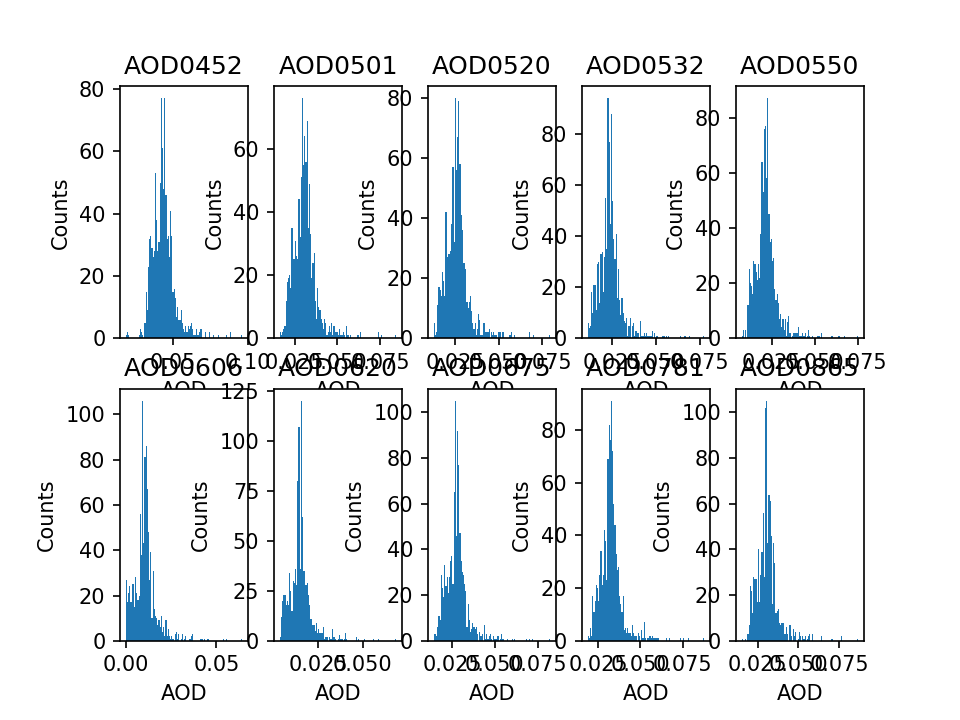

In [574]:
fig,ax = plt.subplots(2,5)
ax = ax.ravel()
for i in xrange(10):
    ax[i].hist(ae_unc_norm[i,:],bins=100)
    ax[i].set_title(nwl[i+1])
    ax[i].set_xlabel('AOD')
    ax[i].set_ylabel('Counts')

### Propagate the AOD measurement distribution to AE calculations

In [37]:
# functionalize this pdf such that you can enter the AOD spectra val and its uncertainty to change the spread and mean
def aod_sp_pdf(aod,unc,ae_unc_norm=ae_unc_norm):
    'modifiy a spectra (aod) and uncertainty (unc)'
    if len(aod) != len(ae_unc_norm): raise(ValueError,'aod spectra not the right length')
    if len(unc) != len(ae_unc_norm): raise(ValueError,'unc spectra not the right length')
    aod_n = np.array([aod[i] + (ae_unc_norm[i,:]-np.nanmean(ae_unc_norm[i,:]))*(unc[i]/np.nanstd(ae_unc_norm[i,:])) for i in xrange(len(aod))])
    return aod_n
    

In [39]:
# make for multiprocessing
def angs_calc_multi(ia,aodrr=aodrr,aodrr_unc=aodrr_unc,fl=fl):
    aa = aodrr[1:11,fl][:,ia]
    unc = aodrr_unc[1:11,fl][:,ia]
    aod_n = aod_sp_pdf(aa,unc)
    try:
        angs_n = su.calc_angs(aod_n[0,:],np.array(nm[1:11]),aod_n,bar_update=False)
        angs_mean = np.nanmean(angs_n)
        angs_std = np.nanstd(angs_n)
    except:
        angs_mean = np.nan
        angs_std = np.nan
    return angs_mean,angs_std

In [ ]:
p = Pool(20,worker_init)

In [44]:
NN = len(aodrr[0,fl])
angs_mean,angs_std = np.zeros((NN)),np.zeros((NN))
with tqdm(total=NN) as pbar:
    for i, outs in enumerate(p.imap_unordered(angs_calc_multi, range(NN))):
        pbar.update()
        angs_mean[i] = outs[0]
        angs_std[i] = outs[1]

In [43]:
#save if angstrom currently is the variables, if not then load from file
if 'angs_mean' in locals().keys():
    hs.savemat(fp+'KORUS_fine_coarse_angs_unc_{}.mat'.format(vv),{u'angs_mean':angs_mean,u'angs_std':angs_std})
else:
    dd = hs.loadmat(fp+'KORUS_fine_coarse_angs_unc_{}.mat'.format(vv))
    angs_mean = dd['angs_mean']
    angs_std = dd['angs_std']

### Calculate the fine mode fraction

In [24]:
fmf = su.sda(aodrr[1:13,:],np.array(nm[1:13])/1000.0)

Sun_utils.py:418: RuntimeWarning: divide by zero encountered in log
  cc = polyfit(np.log(wvl),np.log(aod),polynum)
Sun_utils.py:418: RuntimeWarning: invalid value encountered in log
  cc = polyfit(np.log(wvl),np.log(aod),polynum)


In [25]:
fmf.keys()

['tauc', 'alphap', 'tauf', 'tau', 'poly', 'eta', 'alpha']

In [26]:
fmf['tauc'].shape, ar['GPS_Alt'].shape

((583183,), (583183,))

### Propagate the fine mode fraction uncertainty from AOD distributions,  similarly to AE

In [48]:
# make for multiprocessing
def fmf_calc_multi(ia,aodrr=aodrr,aodrr_unc=aodrr_unc,fl=fl):
    aa = aodrr[1:13,fl][:,ia]
    unc = aodrr_unc[1:13,fl][:,ia]
    aod_n = aod_sp_pdf(aa,unc,ae_unc_norm=ae_unc_norm2[:,::10])
    outs = {}
    try:
        fmf_n = su.sda(aod_n,np.array(nm[1:13])/1000.0,bar_update=False)
        for k in ['tauc','tauf','eta']:
            outs[k+'_mean'] = np.nanmean(fmf_n[k])
            outs[k+'_std'] = np.nanstd(fmf_n[k])
    except:
        for k in ['tauc','tauf','eta']:
            outs[k+'_mean'] = np.nan
            outs[k+'_std'] = np.nan
    return outs

In [49]:
# test one pdf
ou = fmf_calc_multi(0)
print('multi tauc [mean,std,regular]',ou['tauc_mean'],ou['tauc_std'],fmf['tauc'][fl][0])
print('multi eta [mean,std,regular]',ou['eta_mean'],ou['eta_std'],fmf['eta'][fl][0])

('multi tauc [mean,std,regular]', 0.09118692106814817, 0.014018105874986515, 0.09266686126447439)
('multi eta [mean,std,regular]', 0.5014935751953824, 0.03623642245745697, 0.49541755543383226)


In [50]:
p = Pool(22,worker_init)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nan

In [51]:
NN = len(aodrr[0,fl])
tauc_mean,tauc_std = np.zeros((NN)),np.zeros((NN))
tauf_mean,tauf_std = np.zeros((NN)),np.zeros((NN))
eta_mean,eta_std = np.zeros((NN)),np.zeros((NN))
with tqdm(total=NN) as pbar:
    for i, outs in enumerate(p.imap_unordered(fmf_calc_multi, range(NN))):
        pbar.update()
        tauc_mean[i] = outs['tauc_mean']
        tauf_mean[i] = outs['tauf_mean']
        eta_mean[i] = outs['eta_mean']
        
        tauc_std[i] = outs['tauc_std']
        tauf_std[i] = outs['tauf_std']
        eta_std[i] = outs['eta_std']

In [52]:
# save FMF if available, if not then load from file
if 'eta_mean' in locals().keys():
    hs.savemat(fp+'KORUS_fine_coarse_fmf_unc_{}.mat'.format(vv),
               {u'tauc_mean':tauc_mean,u'tauf_mean':tauf_mean,u'eta_mean':eta_mean,
               u'tauc_std':tauc_std,u'tauf_std':tauf_std,u'eta_std':eta_std})
else:
    dd = hs.loadmat(fp+'KORUS_fine_coarse_fmf_unc_{}.mat'.format(vv))
    tauc_mean = dd['tauc_mean']
    tauf_mean = dd['tauf_mean']
    eta_mean = dd['eta_mean']
    tauc_std = dd['tauc_std']
    tauf_std = dd['tauf_std']
    eta_std = dd['eta_std']

/home/sam/.local/lib/python2.7/site-packages/hdf5storage/__init__.py:1306: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  f = h5py.File(filename)


## For GOCI

### Build collcation of goci data to 4STAR

In [27]:
ig4 = Sp.find_closest(goci_doy,ar['doys'])
bad_ig4 = abs(goci_doy[ig4]-ar['doys'])>(1.0/24.0)
print(sum(bad_ig4)/float(len(ig4)), len(np.where(bad_ig4)[0]), len(ig4))

(0.1551416965172167, 90476, 583183)


In [28]:
goci2ar = {'doys':[],'lat':[],'lon':[],'aod':[],'AE':[],'fmf':[],'CF':[],'aod_f':[],'aod_c':[]}
for ii in np.unique(ig4):
    print ii
    imeas = np.where(ig4==ii)[0]
    igoci = mu.map_ind(goci[ii]['lon'],goci[ii]['lat'],ar['Longitude'][imeas],ar['Latitude'][imeas])
    if len(igoci)<1:
        goci2ar['lat'] = np.append(goci2ar['lat'],ar['Latitude'][imeas])
        goci2ar['lon'] = np.append(goci2ar['lon'],ar['Longitude'][imeas])
        goci2ar['aod'] = np.append(goci2ar['aod'],ar['Latitude'][imeas]+np.nan)
        goci2ar['aod_c'] = np.append(goci2ar['aod_c'],ar['Latitude'][imeas]+np.nan)
        goci2ar['aod_f'] = np.append(goci2ar['aod_f'],ar['Latitude'][imeas]+np.nan)
        goci2ar['AE'] = np.append(goci2ar['AE'],ar['Latitude'][imeas]+np.nan)
        goci2ar['fmf'] = np.append(goci2ar['fmf'],ar['Latitude'][imeas]+np.nan)
        goci2ar['CF'] = np.append(goci2ar['CF'],ar['Latitude'][imeas]+np.nan)
        goci2ar['doys'] = np.append(goci2ar['doys'],ar['doys'][imeas])
    else:
        goci2ar['lat'] = np.append(goci2ar['lat'],goci[ii]['lat'][igoci[0],igoci[1]])
        goci2ar['lon'] = np.append(goci2ar['lon'],goci[ii]['lon'][igoci[0],igoci[1]])
        goci2ar['aod'] = np.append(goci2ar['aod'],goci[ii]['aod'][igoci[0],igoci[1]])
        goci2ar['aod_c'] = np.append(goci2ar['aod_c'],goci[ii]['aod_c'][igoci[0],igoci[1]])
        goci2ar['aod_f'] = np.append(goci2ar['aod_f'],goci[ii]['aod_f'][igoci[0],igoci[1]])
        goci2ar['AE'] = np.append(goci2ar['AE'],goci[ii]['AE'][igoci[0],igoci[1]])
        goci2ar['fmf'] = np.append(goci2ar['fmf'],goci[ii]['fmf'][igoci[0],igoci[1]])
        goci2ar['CF'] = np.append(goci2ar['CF'],goci[ii]['CF'][igoci[0],igoci[1]])
        goci2ar['doys'] = np.append(goci2ar['doys'],goci[ii]['doys'][igoci[0],igoci[1]])

for k in goci2ar.keys():
    goci2ar[k] = np.array(goci2ar[k])

8
Running through flight track: [########################################]100% -- Done! 
9
Running through flight track: [########################################]100% -- Done! 
10
Running through flight track: [########################################]100% -- Done! 
11
Running through flight track: [########################################]100% -- Done! 
12
Running through flight track: [########################################]100% -- Done! 
13
14
24
25
Running through flight track: [#---------------------------------------] 02% 

map_utils.py:83: RuntimeWarning: invalid value encountered in greater
  imodis = np.logical_and(np.logical_and(mod_lon>min(meas_lon[meas_good])-0.02 , mod_lon<max(meas_lon[meas_good])+0.02),
map_utils.py:83: RuntimeWarning: invalid value encountered in less
  imodis = np.logical_and(np.logical_and(mod_lon>min(meas_lon[meas_good])-0.02 , mod_lon<max(meas_lon[meas_good])+0.02),
map_utils.py:84: RuntimeWarning: invalid value encountered in greater
  np.logical_and(mod_lat>min(meas_lat[meas_good])-0.02 , mod_lat<max(meas_lat[meas_good])+0.02))
map_utils.py:84: RuntimeWarning: invalid value encountered in less
  np.logical_and(mod_lat>min(meas_lat[meas_good])-0.02 , mod_lat<max(meas_lat[meas_good])+0.02))
map_utils.py:88: RuntimeWarning: invalid value encountered in greater
  imodis = np.logical_and(np.logical_and(mod_lon>min(meas_lon[meas_good])-0.2 , mod_lon<max(meas_lon[meas_good])+0.2),
map_utils.py:88: RuntimeWarning: invalid value encountered in less
  imodis = np.logical_and(np.logic

Running through flight track: [########################################]100% -- Done! 
26
Running through flight track: [########################################]100% -- Done! 
27
Running through flight track: [########################################]100% -- Done! 
28
Running through flight track: [########################################]100% -- Done! 
29
30
Running through flight track: [########################################]100% -- Done! 
31
Running through flight track: [########################################]100% -- Done! 
32
Running through flight track: [########################################]100% -- Done! 
33
Running through flight track: [########################################]100% -- Done! 
34
35
Running through flight track: [########################################]100% -- Done! 
48
Running through flight track: [########################################]100% -- Done! 
49
Running through flight track: [########################################]100% -- Done! 
50
Runn

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [########################################]100% -- Done! 
91
Running through flight track: [##########################--------------] 65% 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [########################################]100% -- Done! 
92
Running through flight track: [########################################]100% -- Done! 
93
Running through flight track: [########################################]100% -- Done! 
94
Running through flight track: [########################################]100% -- Done! 
95
Running through flight track: [########################################]100% -- Done! 
96
97
Running through flight track: [########################################]100% -- Done! 
98
99
128
Running through flight track: [########################################]100% -- Done! 
129
Running through flight track: [########################################]100% -- Done! 
130
131
Running through flight track: [########################################]100% -- Done! 
132
133
Running through flight track: [########################################]100% -- Done! 
134
Running through flight track: [########################################]100% -

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [########################################]100% -- Done! 
153
Running through flight track: [########################################]100% -- Done! 
154
Running through flight track: [########################################]100% -- Done! 
155
Running through flight track: [########################################]100% -- Done! 
156
Running through flight track: [########################################]100% -- Done! 
157
158
Running through flight track: [########################################]100% -- Done! 
159
Running through flight track: [########################################]100% -- Done! 
168
Running through flight track: [########################################]100% -- Done! 
169
Running through flight track: [########################################]100% -- Done! 
170
Running through flight track: [########################################]100% -- Done! 
171
Running through flight track: [########################################]100% -- Done! 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [########################################]100% -- Done! 
205
206
Running through flight track: [########################################]100% -- Done! 
207
232
233
Running through flight track: [########################################]100% -- Done! 
234
Running through flight track: [########################################]100% -- Done! 
235
Running through flight track: [########################################]100% -- Done! 
236
Running through flight track: [########################################]100% -- Done! 
237
Running through flight track: [########################################]100% -- Done! 
238
Running through flight track: [########################################]100% -- Done! 
239
Running through flight track: [########################################]100% -- Done! 
256
Running through flight track: [########################################]100% -- Done! 
257
Running through flight track: [########################################]100% -

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [#########################---------------] 64%

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running through flight track: [########################################]100% -- Done! 
281
Running through flight track: [########################################]100% -- Done! 
282
Running through flight track: [########################################]100% -- Done! 
283
Running through flight track: [########################################]100% -- Done! 
284
Running through flight track: [########################################]100% -- Done! 
285
286
Running through flight track: [########################################]100% -- Done! 
287
Running through flight track: [########################################]100% -- Done! 
312
313
314
315
316
317
318
319
Running through flight track: [########################################]100% -- Done! 
320
321
322
Running through flight track: [########################################]100% -- Done! 
323
324
Running through flight track: [########################################]100% -- Done! 
325
Running through flight track: [###############

In [29]:
igoci, len(goci2ar['aod']), goci2ar['aod'][2000], len(np.unique(ig4))

([], 583183, nan, 141)

In [30]:
goci2ar['aod'][bad_ig4] = np.nan
goci2ar['aod_c'][bad_ig4] = np.nan
goci2ar['aod_f'][bad_ig4] = np.nan
goci2ar['AE'][bad_ig4] = np.nan
goci2ar['fmf'][bad_ig4] = np.nan
goci2ar['CF'][bad_ig4] = np.nan


In [31]:
len(goci2ar['aod_c']), len(goci2ar['aod'])

(583183, 583183)

## MERRA-2 regional values

### Collocate to 4STAR

In [ ]:
merra_doy = [datetime(int(l[-12:-8]),int(l[-8:-6]),int(l[-6:-4])).timetuple().tm_yday for l in ml]

In [ ]:
for m in merra:
    m['aod'] = m['TOTEXTTAU']
    m['ae'] = m['TOTANGSTR']
    m['aod_dust'] = m['DUEXTTAU']
    m['aod_sea'] = m['SSEXTTAU']
    m['aod_bc'] = m['BCEXTTAU']
    m['aod_oc'] = m['OCEXTTAU']
    m['aod_sulf'] = m['SUEXTTAU']

In [ ]:
im4 = Sp.find_closest(np.array(merra_doy),(ar['doys']+delta_time).astype(int))

In [ ]:
np.unique(im4)

In [ ]:
nmerra = len(merra)
nlat = len(merra[0]['lat'])
nlon = len(merra[0]['lon'])
ntime = len(merra[0]['time'])

In [ ]:
merra2ar = {'doys':[],'lat':[],'lon':[],'aod':[],'ae':[],'ind':[],
            'aod_sulf':[],'aod_dust':[],'aod_sea':[],'aod_bc':[],'aod_oc':[]}
for ii in np.unique(im4):
    print ii
    imeas = np.where(im4==ii)[0]
    itime = Sp.find_closest(merra[ii]['time']/60.0/24.0+merra_doy[ii],ar['doys'][imeas])
    ilat = Sp.find_closest(merra[0]['lat'],ar['Latitude'][imeas])
    ilon = Sp.find_closest(merra[0]['lon'],ar['Longitude'][imeas])
    
    if len(imeas)<1:
        merra2ar['lat'] = np.append(merra2ar['lat'],ar['Latitude'][imeas])
        merra2ar['lon'] = np.append(merra2ar['lon'],ar['Longitude'][imeas])
        merra2ar['aod'] = np.append(merra2ar['aod'],ar['Latitude'][imeas]+np.nan)
        merra2ar['aod_dust'] = np.append(merra2ar['aod_dust'],ar['Latitude'][imeas]+np.nan)
        merra2ar['aod_sea'] = np.append(merra2ar['aod_sea'],ar['Latitude'][imeas]+np.nan)
        merra2ar['aod_bc'] = np.append(merra2ar['aod_bc'],ar['Latitude'][imeas]+np.nan)
        merra2ar['aod_oc'] = np.append(merra2ar['aod_oc'],ar['Latitude'][imeas]+np.nan)
        merra2ar['aod_sulf'] = np.append(merra2ar['aod_sulf'],ar['Latitude'][imeas]+np.nan)
        merra2ar['ae'] = np.append(merra2ar['ae'],ar['Latitude'][imeas]+np.nan)
        merra2ar['doys'] = np.append(merra2ar['doys'],ar['doys'][imeas])
        merra2ar['ind'] = np.append(merra2ar['ind'],ar['doys'][imeas].astype(int)*0) #pixel index
    else:
        merra2ar['lat'] = np.append(merra2ar['lat'],merra[ii]['lat'][ilat])
        merra2ar['lon'] = np.append(merra2ar['lon'],merra[ii]['lon'][ilon])
        merra2ar['aod'] = np.append(merra2ar['aod'],merra[ii]['aod'][itime,ilat,ilon])
        merra2ar['aod_dust'] = np.append(merra2ar['aod_dust'],merra[ii]['aod_dust'][itime,ilat,ilon])
        merra2ar['aod_sea'] = np.append(merra2ar['aod_sea'],merra[ii]['aod_sea'][itime,ilat,ilon])
        merra2ar['aod_bc'] = np.append(merra2ar['aod_bc'],merra[ii]['aod_bc'][itime,ilat,ilon])
        merra2ar['aod_oc'] = np.append(merra2ar['aod_oc'],merra[ii]['aod_oc'][itime,ilat,ilon])
        merra2ar['aod_sulf'] = np.append(merra2ar['aod_sulf'],merra[ii]['aod_sulf'][itime,ilat,ilon])
        merra2ar['ae'] = np.append(merra2ar['ae'],merra[ii]['ae'][itime,ilat,ilon])
        merra2ar['doys'] = np.append(merra2ar['doys'],merra[ii]['time'][itime]/60.0/24.0+merra_doy[ii])
        merra2ar['ind'] = np.append(merra2ar['ind'],
                                    np.ravel_multi_index((imeas*0+ii,itime,ilat,ilon),(nmerra,ntime,nlat,nlon)).astype(int))

for k in merra2ar.keys():
    merra2ar[k] = np.array(merra2ar[k])

## MERRA-2 interpolated to flight path

### Calculate the AE

In [ ]:
m_w = np.array([470.0,500.0,870.0])

In [ ]:
merraint['ae'] = np.zeros_like(merraint['aod'])+np.nan
merraint['ae'].shape

In [ ]:
merraint['aod_spectra'].shape

In [ ]:
for i,z in enumerate(merraint['lev']):
    merraint['ae'][:,i] = su.calc_angs(merraint['doy'],m_w,merraint['aod_spectra'][:,:,i])

### Match altitude and locations of 4STAR data

In [ ]:
merraint['pres'] = np.array([0.01,0.02,0.0327,0.0476,0.066,0.0893,0.1197,0.1595,0.2113,0.2785,0.3650,0.4758,
                             0.6168,0.7951,1.0194,1.3005,1.6508,2.0850,2.6202,3.2764,4.0766,5.0468,6.2168,7.6198,
                             9.2929,11.2769,13.6434,16.4571,19.7916,23.7304,28.3678,33.8100,40.1754,56.3879,66.6034,
                             78.5123,92.3657,108.663,127.837,150.393,176.930,208.152,244.875,288.083,337.500,375.00,412.500,
                             450.0,487.5,525.0,562.5,600.0,637.5,675.0,700.0,725.0,750.0,775.0,800.0,
                             820.0,835.0,850.0,865.0,880.0,895.0,910.0,925.0,940.0,955.0,970.0,985.0])

In [ ]:
p2z = lambda p: np.log(p/1013.25)/(-0.00012)  

In [ ]:
merraint['alt'] = p2z(merraint['pres']) #in meters above sea level
merraint['alt']

In [ ]:
imatch = Sp.find_closest(merraint['doy'],ar['doys'])
ibad = abs(merraint['doy'][imatch]-ar['doys']) > 5.0/(24.0*3600.0) #within 5 seconds

In [ ]:
ar_alt = np.ma.masked_array(ar['GPS_Alt'],mask=~np.isfinite(ar['GPS_Alt']))
jalt = np.array([np.argmin(abs(merraint['alt']-a)) for a in ar_alt])

In [ ]:
merraint['aod'].shape

In [ ]:
merrasum = {}
for k in ['aod','aod_dust','aod_bc','aod_sulf','aod_sea','aod_oc','aod_spectra']:
    merrasum[k] = np.array([np.cumsum(merraint[k][i,:]) for i in xrange(len(merraint[k][:,0]))])

In [ ]:
ma = {}
for k in ['aod','ae','aod_dust','lat','aod_bc','aod_sulf','aod_sea','aod_oc','lon','aod_spectra']:
    print(k,merraint[k].shape,len(merraint[k].shape))
    if k.startswith('aod') and not k.endswith('spectra'):
        ma[k] = merrasum[k][imatch,jalt]
        ma[k][ibad] = np.nan
    elif len(merraint[k].shape)==2:
        ma[k] = merraint[k][imatch,jalt]
        ma[k][ibad] = np.nan
    elif len(merraint[k].shape)==1:
        ma[k] = merraint[k][imatch]
        ma[k][ibad] = np.nan
    elif len(merraint[k].shape)==3:
        ma[k] = merraint[k][:,imatch,jalt]
        ma[k][:,ibad] = np.nan

In [ ]:
ma['aod'].shape

In [66]:
if 'merraint' in locals():
    np.save(fp+'KORUS_MERRAint_{}.npy'.format(vv),merraint,allow_pickle=True)
else:
    merraint = np.load(fp+'KORUS_MERRAint_{}.npy'.format(vv),allow_pickle=True,fix_imports=True,encoding='latin1')
    merraint = merraint.item()

## LARGE in-situ

### Match to 4STAR

In [67]:
large[2]['UTC_mid'],large[3]['UTC_mid'] 

(array([12.565     , 12.56527778, 12.56555556, ..., 17.25972222,
        17.26      , 17.26027778]),
 array([19.76388889, 19.76416667, 19.76444444, ..., 29.2325    ,
        29.23277778, 29.23305556]))

In [68]:
ar['doys']

array([122.9375    , 122.93751157, 122.93752315, ..., 166.89449074,
       166.89450231, 166.89451389])

In [69]:
large_doys = [datetime(int(l[26:30]),int(l[30:32]),int(l[32:34])).timetuple().tm_yday+np.nanmean(large[i]['UTC_mid'])/24.0 for i,l in enumerate(lrgl)]

In [70]:
large_doys

[109.8750173611111,
 112.86574074074075,
 117.6213599537037,
 118.02076967592592,
 123.12548032407408,
 125.13216435185186,
 126.05543402777778,
 128.12563657407406,
 132.1251909722222,
 133.12711226851852,
 134.05118055555556,
 138.1259201388889,
 139.13480902777778,
 141.1309085648148,
 143.1509201388889,
 146.1263715277778,
 147.21221064814816,
 151.13269675925926,
 152.12232060185184,
 154.12874421296297,
 155.12936921296296,
 157.1351273148148,
 161.13840277777777,
 162.12955439814814,
 166.4181076388889,
 166.79872685185185,
 169.82152199074073,
 170.8244212962963]

In [71]:
il4 = Sp.find_closest(np.array(large_doys),ar['doys'])

In [72]:
lg2ar = {'ext_532':[],'SSA_550':[],'scat_450':[],'scat_550':[],'scat_700':[],'AE':[]}
for lll in np.unique(il4):
    imeas = np.where(il4==lll)[0]
    if len(imeas) < 1:
        lg2ar['ext_532'] = np.append(lg2ar['ext_532'],ar['aod'][imeas]+np.nan)
        lg2ar['SSA_550'] = np.append(lg2ar['SSA_550'],ar['aod'][imeas]+np.nan)
        lg2ar['scat_450'] = np.append(lg2ar['scat_450'],ar['aod'][imeas]+np.nan)
        lg2ar['scat_550'] = np.append(lg2ar['scat_550'],ar['aod'][imeas]+np.nan)
        lg2ar['scat_700'] = np.append(lg2ar['scat_700'],ar['aod'][imeas]+np.nan)
        lg2ar['AE'] = np.append(lg2ar['AE'],ar['aod'][imeas]+np.nan)
        
    else: 
        lg2ar['ext_532'] = np.append(lg2ar['ext_532'],
                                     wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['ambEXT_532_stdPT'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
        lg2ar['SSA_550'] = np.append(lg2ar['SSA_550'], 
                                     wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['ambSSA_550'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
        lg2ar['scat_450'] = np.append(lg2ar['scat_450'], 
                                      wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['ambSC450_stdPT'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
        lg2ar['scat_550'] = np.append(lg2ar['scat_550'], 
                                      wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['ambSC550_stdPT'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
        lg2ar['scat_700'] = np.append(lg2ar['scat_700'], 
                                      wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['ambSC700_stdPT'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
        lg2ar['AE'] = np.append(lg2ar['AE'], 
                                wu.nearest_neighbor(large[lll]['UTC_mid'],large[lll]['dryAEscat_550to700'],ar['Start_UTC'][imeas],dist=1.0/60.0/24.0))
  
    

# Plot maps of the data (Sec 2.1, Fig 1)

## Subset the level legs

In [83]:
nbox = 20
std_alt = running_std(ar['GPS_Alt'][fl],nbox)
f_level = np.where(std_alt<5.0)[0]

In [84]:
std_alt1 = running_std(ar['GPS_Alt'][fl1],nbox)
f_level1 = np.where(std_alt1<5.0)[0]

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  


## Map out the level legs and numbers 

<IPython.core.display.Javascript object>


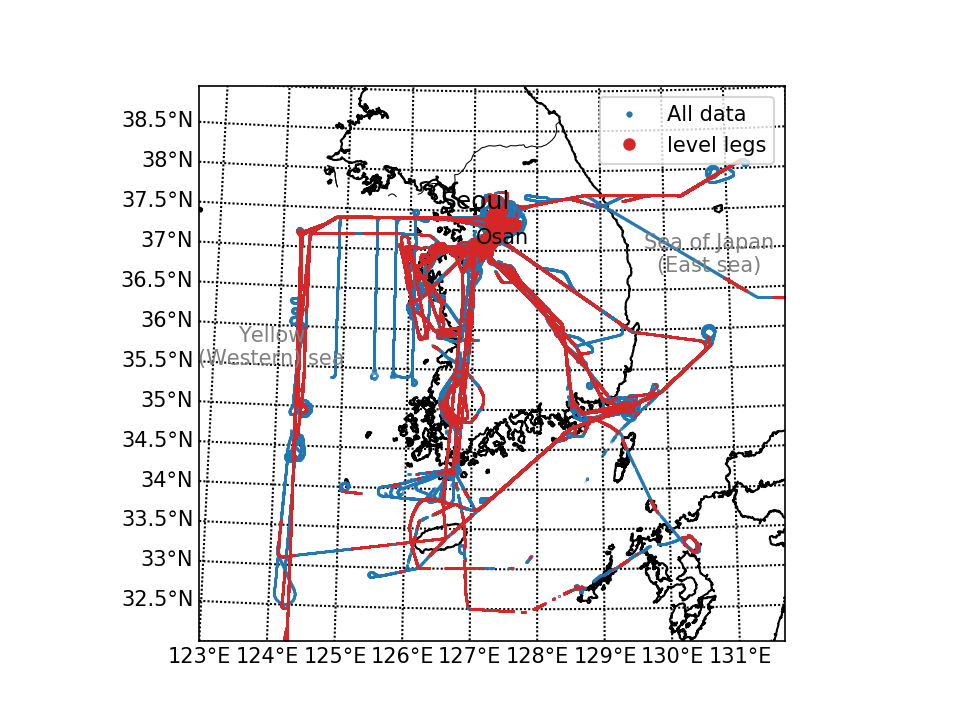

In [34]:
fig,ax = plt.subplots(1,1)
m = make_map(ax)
m.plot(ar['Longitude'],ar['Latitude'],'.',markersize=0.2,color='tab:blue',latlon=True,label='All data')
m.plot(ar['Longitude'][fl][f_level],ar['Latitude'][fl][f_level],'.',markersize=0.5,color='tab:red',latlon=True,label='level legs')
#m.plot(s['Lon'][it],s['Lat'][it],'r+',latlon=True)
xy_1 = m(123.9,35.5)
plt.annotate('Yellow\n(Western) sea',xy_1,color='grey', ha='center')
xy_2 = m(130.7,36.7)
plt.annotate('Sea of Japan\n(East sea)',xy_2,color='grey', ha='center')
xy_3 = m(127.01,37.5198)
plt.annotate('Seoul',xy_3,color='k',ha='center',fontsize=12)
plt.scatter(xy_3[0],xy_3[1],marker='+',color='k')
xy_4 = m(127.038,37.085)
plt.annotate('Osan',xy_4,color='k')
plt.scatter(xy_4[0],xy_4[1],marker='+',color='k')
plt.legend(markerscale=20)
plt.savefig(fp+'plot/KORUS_map_QA_{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_map_QA_{}.pdf'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_map_QA_{}.eps'.format('v2'),dpi=600,transparent=True)

# Setup the meteorological regimes

Define the different time periods from Met. From: 
    Peterson, D.A., Hyer, E.J., Han, S.-O., Crawford, J.H., Park, R.J., Holz, R., Kuehn, R.E., Eloranta, E., Knote, C., Jordan, C.E. and Lefer, B.L., 2019. Meteorology influencing springtime air quality, pollution transport, and visibility in Korea. Elem Sci Anth, 7(1), p.57. DOI: http://doi.org/10.1525/elementa.395

    - Dynamic meteorology and complex aerosol vertical profiles (01–16 May);
    - Stagnation under a persistent anticyclone (17–22 May);
    - Dynamic meteorology, low-level transport, and haze development (25–31 May); (Extreme pollution)
    - Blocking pattern (01–07 June).


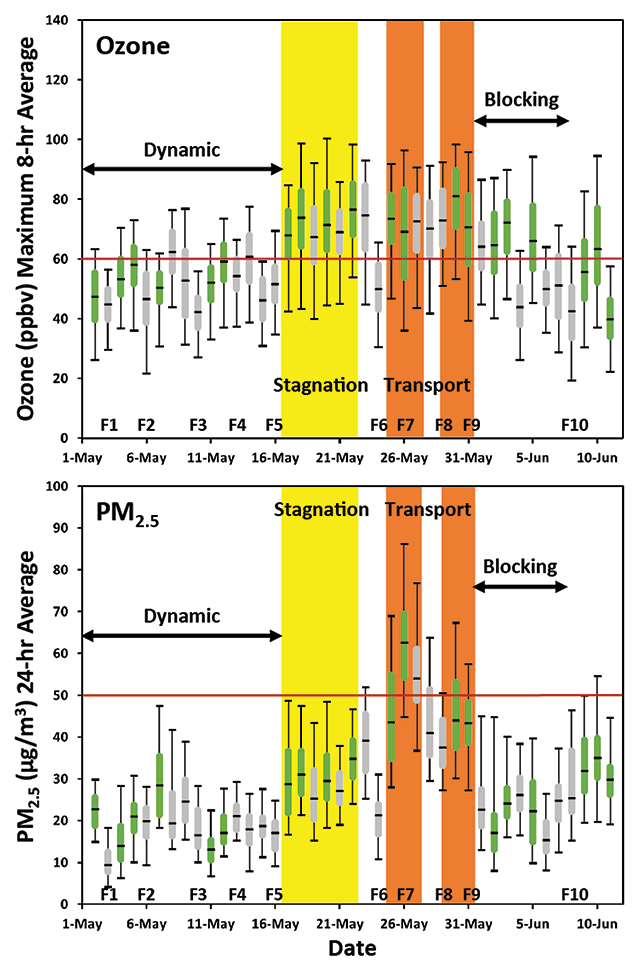

The distribution and source of pm 2.5 during different met periods

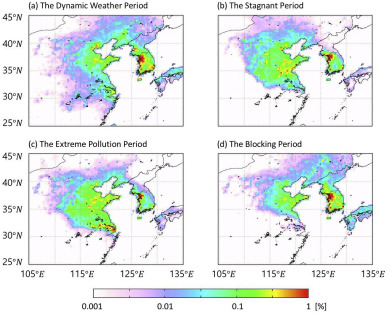

## Build the limits of the meteorological times

In [85]:
# for met times
dt1 = ['20160501','20160516']
dt2 = ['20160517','20160522']
dt3 = ['20160523','20160531']
dt4 = ['20160601','20160607']

In [86]:
t1 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt1]
t2 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt2]
t3 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt3]
t4 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt4]

In [87]:
# limits of DOY for each of the met times
t1,t2,t3,t4

([122, 137], [138, 143], [144, 152], [153, 159])

In [88]:
#altitude limits in m
z1 = [0.0, 1000.0] 
z2 = [1000.0, 3000.0]
z3 = [3000.0, 15000.0]

In [89]:
# for met times
dt1 = ['20160501','20160516']
dt2 = ['20160517','20160522']
dt3 = ['20160523','20160531']
dt4 = ['20160601','20160607']
t1 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt1]
t2 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt2]
t3 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt3]
t4 = [datetime(int(d[0:4]),int(d[4:6]),int(d[6:8])).timetuple().tm_yday for d in dt4]
met_period_labels = ['Dynamic','Stagnation','Extreme\npollution','Blocking']

# Spatial binned maps (section 4.1, Fig. 2)

In [90]:
rg = [[32.5,38.5],[123.5,131.5]]
nbins = 18

## Make a map of 4STAR AOD

In [217]:
flalt = ar['fl'] & (ar['GPS_Alt']<1000.0)
astat_aod = stats_2d(ar['Latitude'],ar['Longitude'],ar['AOD0501'],fl=flalt,days=ar['days'],
                     bins=nbins,rg=rg,verbose=True)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


Mean values: mean=0.36100243734, median=0.337541284404, std=0.119635737523, num=318.731481481, day=1.03086419753
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.262839990038, median=0.275255662046, std=0.120777398391, num=896.80732347, day=2.48805253683


/home/sam/.local/lib/python2.7/site-packages/numpy/core/fromnumeric.py:734: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


In [218]:
flalta = ar['fl'] & (ar['GPS_Alt']<1000.0) & np.isfinite(angs)
astat_ae = stats_2d(ar['Latitude'],ar['Longitude'],angs,fl=flalta,days=ar['days'],
                     bins=nbins,rg=rg,verbose=True)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


Mean values: mean=1.11034460404, median=1.1316818745, std=0.150821932181, num=317.179012346, day=1.02777777778
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.214784290664, median=0.228183901533, std=0.105064585029, num=895.815845854, day=2.48498577883


In [219]:
astat_aod.keys()

['bin',
 'std',
 'cnt',
 'binn',
 'ym',
 'bind',
 'xm',
 'bine',
 'ye',
 'yn',
 'median',
 'yd',
 'xd',
 'xe',
 'xn',
 'dcnt',
 'xs',
 'ys',
 'bins',
 'mean']

In [220]:
iao = np.where((astat_aod['cnt'].data>0.0) & (astat_aod['std'].data<1.0))

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [198]:
astat_aod['mean'][15,8] # for Seoul

0.29084193417310034

In [199]:
astat_aod['mean'][14,8] # for South of Seoul

0.33294035314384157

In [200]:
astat_aod['mean'][13,7] # for South of Incheon/Suwon

0.4445401353965183

<IPython.core.display.Javascript object>


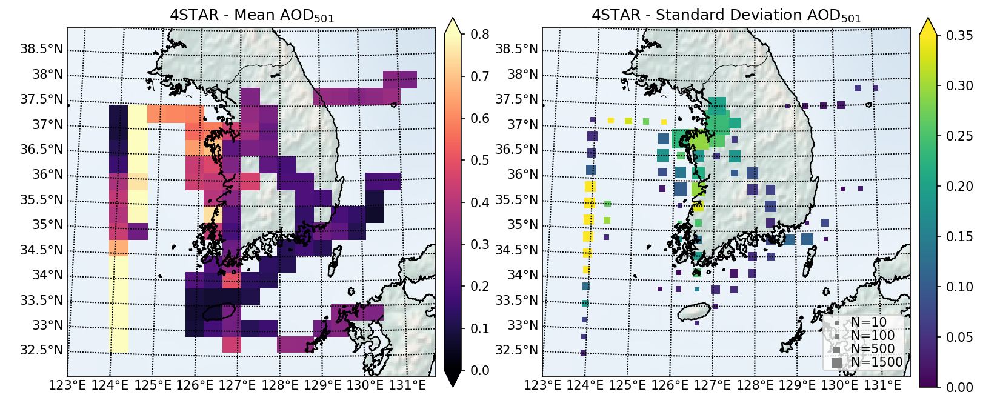

In [358]:
#fig = plt.figure(figsize=(11,4.5))
fig,ax = plt.subplots(1,2,figsize=(11,4.5))
ax1,ax2 = ax[0],ax[1]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(astat_aod['ym'],astat_aod['xm'])
p = ax1.pcolor(ym,xm,astat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('4STAR - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(astat_aod['ys'][iao[1]],astat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(astat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=astat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('4STAR - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
plt.tight_layout(pad=1.12,h_pad=1.8,w_pad=3.0,rect=(0.05,0,1,1))
plt.savefig(fp+'plot/KORUS_4STAR_AOD_map_{}.png'.format(vv),dpi=600,transparent=True)

## Map of MERRA-2 AOD

In [313]:
merraint.keys()

['aod',
 'ae',
 'aod_spectra',
 'aod_dust',
 'isotime',
 'lat',
 'lev',
 'aod_bc',
 'alt',
 'aod_sulf',
 'doy',
 'aod_sea',
 'lon',
 'aod_oc',
 'time',
 'pres']

In [314]:
merraint['aod_alt'] = []
merraint['alt_flt'] = []
merraint['ae_alt'] = []
nul = [[merraint['aod_alt'].append(aa) for aa in da] for da in dvals['MERRA_AOD']]
nul = [[merraint['alt_flt'].append(aa) for aa in da] for da in dvals['alt']]
nul = [[merraint['ae_alt'].append(aa) for aa in da] for da in dvals['MERRA_AE']]
merraint['aod_alt'] = np.array(merraint['aod_alt'][0:len(merraint['lat'])])
merraint['ae_alt'] = np.array(merraint['ae_alt'][0:len(merraint['lat'])])
merraint['alt_flt'] = np.array(merraint['alt_flt'][0:len(merraint['lat'])])

In [315]:
mer_flalt = merraint['alt_flt']<1000.0

In [316]:
merraint['aod_alt'].shape, merraint['lat'].shape

((177508,), (177508,))

In [317]:
merraint['alt'].shape

(71,)

In [318]:
mstat_aod = stats_2d(merraint['lat'],merraint['lon'],merraint['aod_alt'],days=merraint['doy'],
                     bins=nbins,rg=rg,verbose=True,fl=mer_flalt)

Mean values: mean=0.272771256588, median=0.271317911179, std=0.0455924001993, num=201.75, day=201.75
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.185597054761, median=0.198579569428, std=0.0641586377685, num=529.276861521, day=529.276861521


In [377]:
iao = np.where((mstat_aod['cnt'].data>0.0) & (mstat_aod['std'].data<1.0))

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


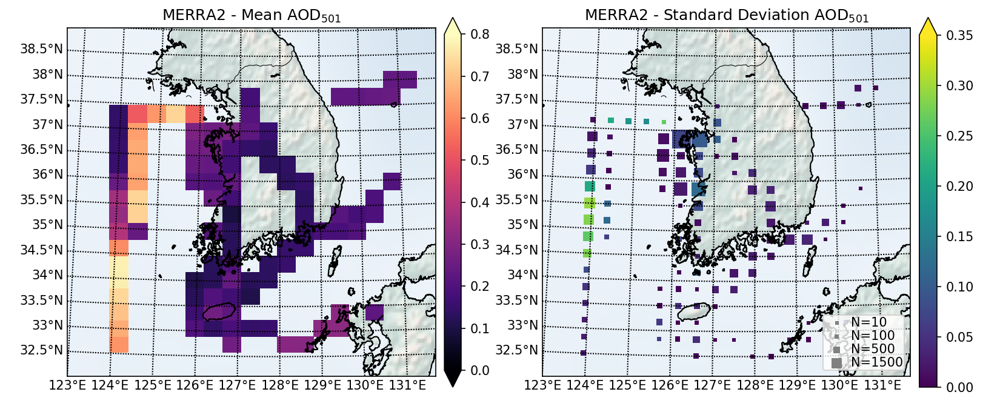

In [378]:
#fig = plt.figure(figsize=(11,4.5))
fig,ax = plt.subplots(1,2,figsize=(11,4.5))
ax1,ax2 = ax[0],ax[1]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(mstat_aod['ym'],mstat_aod['xm'])
p = ax1.pcolor(ym,xm,mstat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('MERRA2 - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(mstat_aod['ys'][iao[1]],mstat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(mstat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=mstat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('MERRA2 - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
plt.tight_layout(pad=1.12,h_pad=1.8,w_pad=3.0,rect=(0.05,0,1,1))
plt.savefig(fp+'plot/KORUS_MERRA2_AOD_map_{}.png'.format(vv),dpi=600,transparent=True)

## Map GOCI AOD

In [270]:
goci2ar.keys()

['fmf', 'aod', 'AE', 'doys', 'lat', 'aod_c', 'lon', 'CF', 'aod_f']

In [271]:
gstat_aod = stats_2d(goci2ar['lat'],goci2ar['lon'],goci2ar['aod'],fl=flalt,days=ar['days'],
                     bins=nbins,rg=rg,verbose=True)

/home/sam/.local/lib/python2.7/site-packages/scipy/stats/_binned_statistic.py:600: RuntimeWarning: Mean of empty slice
  result[vv, i] = statistic(values[vv, binnumbers == i])


Mean values: mean=0.306561332995, median=0.28995797157, std=0.0999944278502, num=318.728395062, day=1.03703703704
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.210815243417, median=0.222659694506, std=0.0994282534472, num=905.567931236, day=2.46052510929


In [272]:
iao = np.where((gstat_aod['cnt'].data>0.0) & (gstat_aod['std'].data<1.0))

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


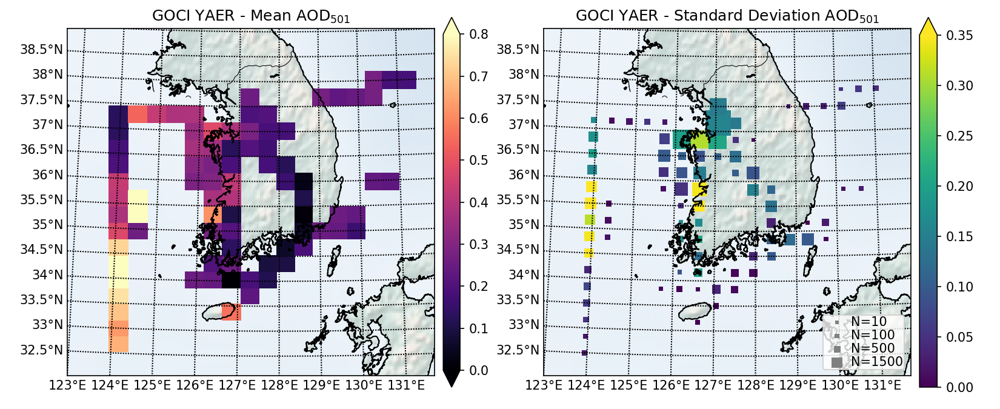

In [357]:
#fig = plt.figure(figsize=(11,4.5))
fig,ax = plt.subplots(1,2,figsize=(11,4.5))
ax1,ax2 = ax[0],ax[1]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(gstat_aod['ym'],gstat_aod['xm'])
p = ax1.pcolor(ym,xm,gstat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('GOCI YAER - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(gstat_aod['ys'][iao[1]],gstat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(gstat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=gstat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('GOCI YAER - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
plt.tight_layout(pad=1.12,h_pad=1.8,w_pad=3.0,rect=(0.05,0,1,1))
plt.savefig(fp+'plot/KORUS_GOCI_AOD_map_{}.png'.format(vv),dpi=600,transparent=True)

In [573]:
np.diff(gstat_aod['xs']),np.diff(gstat_aod['ys'])

(array([0.33333333, 0.33333333, 0.33333333, 0.33333333, 0.33333333,
        0.33333333, 0.33333333, 0.33333333, 0.33333333, 0.33333333,
        0.33333333, 0.33333333, 0.33333333, 0.33333333, 0.33333333,
        0.33333333, 0.33333333, 0.33333333]),
 array([0.44444444, 0.44444444, 0.44444444, 0.44444444, 0.44444444,
        0.44444444, 0.44444444, 0.44444444, 0.44444444, 0.44444444,
        0.44444444, 0.44444444, 0.44444444, 0.44444444, 0.44444444,
        0.44444444, 0.44444444, 0.44444444]))

## Combine AOD maps into one figure 

In [200]:
fig,ax = plt.subplots(3,2,figsize=(11,14.5))
ax = ax.flatten()
#### 4STAR
ax1,ax2 = ax[0],ax[1]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(astat_aod['ym'],astat_aod['xm'])
p = ax1.pcolor(ym,xm,astat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('4STAR - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('a)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(astat_aod['ys'][iao[1]],astat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(astat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=astat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('4STAR - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('b)',ax=ax2,out=True)

#### MERRA-2
ax1,ax2 = ax[2],ax[3]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(mstat_aod['ym'],mstat_aod['xm'])
p = ax1.pcolor(ym,xm,mstat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('MERRA2 - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('c)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(mstat_aod['ys'][iao[1]],mstat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(mstat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=mstat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('MERRA2 - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('d)',ax=ax2,out=True)


#### GOCI
ax1,ax2 = ax[4],ax[5]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(gstat_aod['ym'],gstat_aod['xm'])
p = ax1.pcolor(ym,xm,gstat_aod['mean'],vmin=0.0,vmax=0.8,cmap='magma')

ax1.set_title('GOCI YAER - Mean AOD$_{{501}}$')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('e)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(gstat_aod['ys'][iao[1]],gstat_aod['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,8.0+(gstat_aod['cnt'].data[iao[0],iao[1]].flatten()/25.0),
                c=gstat_aod['std'].data[iao[0],iao[1]].flatten(),
               marker='s',edgecolor='None',cmap='viridis',vmin=0,vmax=0.35)
ax2.set_title('GOCI YAER - Standard Deviation AOD$_{{501}}$')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [10,100,500,1500]
labels = ['N={0}'.format(z) for z in sizes]
points = [ax2.scatter([], [], s=8.0+(z/25.0), c='grey',marker='s',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('f)',ax=ax2,out=True)

plt.tight_layout(pad=1.12,h_pad=1.8,w_pad=3.0,rect=(0.05,0,1,1))

plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AOD_map_{}.png'.format(vv),dpi=600,transparent=True)
#plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AOD_map_{}.eps'.format(vv),dpi=600,transparent=True)
#plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AOD_map_{}.svg'.format(vv),dpi=600,transparent=True)
#plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AOD_map_{}.pdf'.format(vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>

NameError: name 'gstat_aod' is not defined

## Map the Angstrom Exponent

In [369]:
dvals['doys_n'][0]

122.97180555555556

In [349]:
mstat_ae = stats_2d(merraint['lat'],merraint['lon'],merraint['ae_alt'],days=np.around(merraint['doy']),
                     bins=nbins,rg=rg,verbose=True,fl=mer_flalt)

Mean values: mean=1.62048667545, median=1.63534566512, std=0.0640152219906, num=201.75, day=0.725308641975
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.203784917079, median=0.209782676815, std=0.0746631110939, num=529.276861521, day=1.52808327161


In [326]:
gstat_ae = stats_2d(goci2ar['lat'],goci2ar['lon'],goci2ar['AE'],fl=flalt,days=ar['days'],
                     bins=nbins,rg=rg,verbose=True)

Mean values: mean=0.765606504335, median=0.723553815902, std=0.214644846562, num=318.728395062, day=1.03703703704
Median values: mean=0.0, median=0.0, std=0.0, num=0.0, day=0.0
STD values: mean=0.344376603833, median=0.360927702239, std=0.179105291401, num=905.567931236, day=2.46052510929


In [327]:
iao = np.where((gstat_ae['cnt'].data>0.0) & (gstat_ae['std'].data<2.1))

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


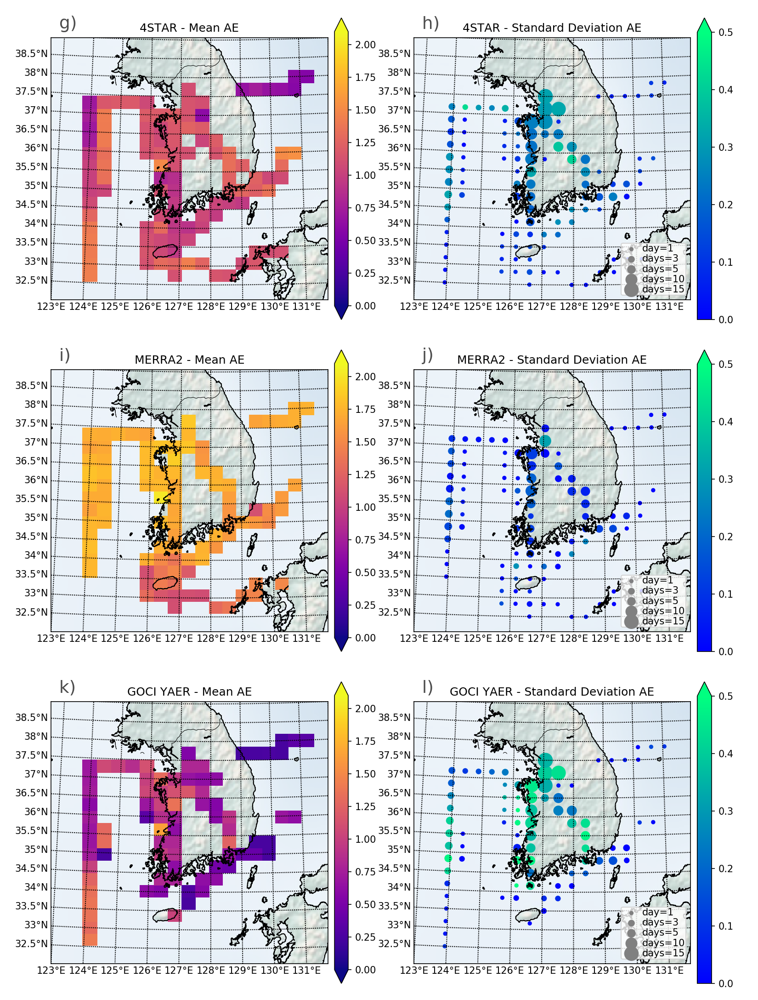

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in less
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in less


In [362]:
fig,ax = plt.subplots(3,2,figsize=(11,14.5))
ax = ax.flatten()
#### 4STAR
iao = np.where((astat_ae['cnt'].data>0.0) & (astat_ae['std'].data<2.1))
ax1,ax2 = ax[0],ax[1]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(astat_ae['ym'],astat_ae['xm'])
p = ax1.pcolor(ym,xm,astat_ae['mean'],vmin=0.0,vmax=2.1,cmap='plasma')

ax1.set_title('4STAR - Mean AE')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('g)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(astat_ae['ys'][iao[1]],astat_ae['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,5.0+(astat_ae['dcnt'].data[iao[0],iao[1]].flatten()*15.0),
                c=astat_ae['std'].data[iao[0],iao[1]].flatten(),
               marker='o',edgecolor='None',cmap='winter',vmin=0,vmax=0.5)
ax2.set_title('4STAR - Standard Deviation AE')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [1,3,5,10,15]
labels = ['day{s}={0}'.format(z,s='s' if z>1 else '') for z in sizes]
points = [ax2.scatter([], [], s=5.0+(z*15.0), c='grey',marker='o',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('h)',ax=ax2,out=True)

#### MERRA-2
iao = np.where((mstat_ae['cnt'].data>0.0) & (mstat_ae['std'].data<2.1))
ax1,ax2 = ax[2],ax[3]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(mstat_ae['ym'],mstat_ae['xm'])
p = ax1.pcolor(ym,xm,mstat_ae['mean'],vmin=0.0,vmax=2.1,cmap='plasma')

ax1.set_title('MERRA2 - Mean AE')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('i)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(mstat_ae['ys'][iao[1]],mstat_ae['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,5.0+(mstat_ae['dcnt'].data[iao[0],iao[1]].flatten()*15.0),
                c=mstat_ae['std'].data[iao[0],iao[1]].flatten(),
               marker='o',edgecolor='None',cmap='winter',vmin=0,vmax=0.5)
ax2.set_title('MERRA2 - Standard Deviation AE')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [1,3,5,10,15]
labels = ['day{s}={0}'.format(z,s='s' if z>1 else '') for z in sizes]
points = [ax2.scatter([], [], s=5.0+(z*15.0), c='grey',marker='o',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('j)',ax=ax2,out=True)


#### GOCI
iao = np.where((gstat_ae['cnt'].data>0.0) & (gstat_ae['std'].data<2.1))
ax1,ax2 = ax[4],ax[5]

m = make_map(ax=ax1)
m.shadedrelief(alpha=0.4)

ym,xm = m(gstat_ae['ym'],gstat_ae['xm'])
p = ax1.pcolor(ym,xm,gstat_ae['mean'],vmin=0.0,vmax=2.1,cmap='plasma')

ax1.set_title('GOCI YAER - Mean AE')
cb = plt.colorbar(p,extend='both',ax=ax1,pad=0.02)
pu.sub_note('k)',ax=ax1,out=True)

m2 = make_map(ax=ax2)
m2.shadedrelief(alpha=0.4)

y2,x2 = m2(gstat_ae['ys'][iao[1]],gstat_ae['xs'][iao[0]])
p2 = ax2.scatter(y2,x2,5.0+(gstat_ae['dcnt'].data[iao[0],iao[1]].flatten()*15.0),
                c=gstat_ae['std'].data[iao[0],iao[1]].flatten(),
               marker='o',edgecolor='None',cmap='winter',vmin=0,vmax=0.5)
ax2.set_title('GOCI YAER - Standard Deviation AE')
cb2 = plt.colorbar(p2,extend='max',ax=ax2,pad=0.02)

sizes = [1,3,5,10,15]
labels = ['day{s}={0}'.format(z,s='s' if z>1 else '') for z in sizes]
points = [ax2.scatter([], [], s=5.0+(z*15.0), c='grey',marker='o',edgecolor='None') for z in sizes]
ax2.legend(points, labels, scatterpoints=1,frameon=True,
           framealpha=0.8,handletextpad=0.1,labelspacing=0.1,borderpad=0.1,loc='lower right')
pu.sub_note('l)',ax=ax2,out=True)

plt.tight_layout(pad=1.12,h_pad=1.8,w_pad=3.0,rect=(0.05,0,1,1))

plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AE_map_{}.png'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AE_map_{}.eps'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AE_map_{}.svg'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_4STAR_MERRA_GOCI_AE_map_{}.pdf'.format(vv),dpi=600,transparent=True)

In [361]:
iao = np.where((astat_ae['cnt'].data>0.0) & (astat_ae['std'].data<2.1))

print('AE std and count',np.corrcoef(astat_ae['std'].data[iao[0],iao[1]].flatten(),
                                      astat_ae['cnt'].data[iao[0],iao[1]].flatten())[0,1]**2.0)
print('AE std and days',np.corrcoef(astat_ae['std'].data[iao[0],iao[1]].flatten(),
                                      astat_ae['dcnt'].data[iao[0],iao[1]].flatten())[0,1]**2.0)

('AE std and count', 0.18648791260789757)
('AE std and days', 0.3623053803004666)


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


# Plot 4STAR AOD by meteorological periods (Section 4.1, Fig. 3)

## Plot the AOD histogram by met

In [77]:
ar['fl_QA_met1'] = ar['fl'] & (ar['doys']> t1[0]) & (ar['doys']< t1[1])
ar['fl_QA_met2'] = ar['fl'] & (ar['doys']> t2[0]) & (ar['doys']< t2[1])
ar['fl_QA_met3'] = ar['fl'] & (ar['doys']> t3[0]) & (ar['doys']< t3[1])
ar['fl_QA_met4'] = ar['fl'] & (ar['doys']> t4[0]) & (ar['doys']< t4[1])


<IPython.core.display.Javascript object>


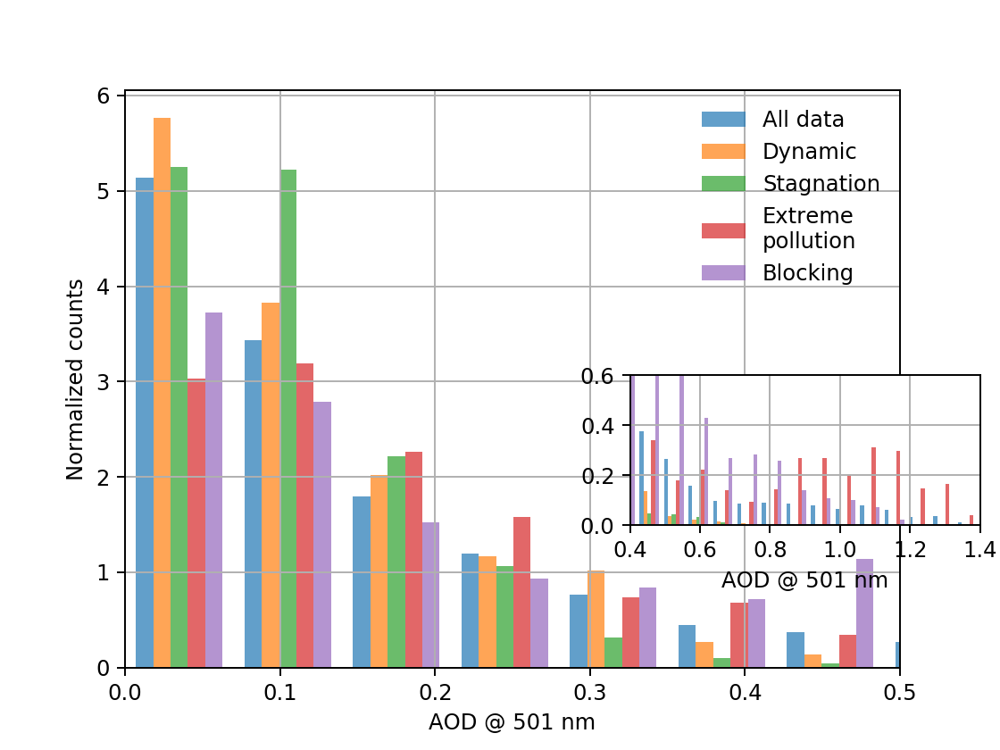

Text(0.5,0,'AOD @ 501 nm')

In [162]:
fig = plt.figure()
n=plt.hist([ar['AOD0501'][ar['fl']],
            ar['AOD0501'][ar['fl_QA_met1']],
          ar['AOD0501'][ar['fl_QA_met2']],
          ar['AOD0501'][ar['fl_QA_met3']],ar['AOD0501'][ar['fl_QA_met4']]],
           bins=20,range=(0,1.4),normed=True,edgecolor='None',alpha=0.7,
         label=['All data','Dynamic','Stagnation','Extreme\npollution','Blocking'])

plt.legend(frameon=False)
plt.grid()
plt.xlim(0,0.5)
plt.xlabel('AOD @ 501 nm')
plt.ylabel('Normalized counts')
#plt.title('Histogram of 4STAR AOD from KORUS-AQ subsetted by altitude')

left, bottom, width, height = [0.63, 0.3, 0.35, 0.2]
ax2 = fig.add_axes([left, bottom, width, height])
n = ax2.hist([ar['AOD0501'][ar['fl']],
            ar['AOD0501'][ar['fl_QA_met1']],
          ar['AOD0501'][ar['fl_QA_met2']],
          ar['AOD0501'][ar['fl_QA_met3']],ar['AOD0501'][ar['fl_QA_met4']]],
             bins=20,range=(0,1.4),normed=True,edgecolor='None',alpha=0.7)
ax2.set_xlim(0.4,1.4)
ax2.set_ylim(0,0.6)
ax2.grid()
ax2.set_xlabel('AOD @ 501 nm')

#plt.savefig(fp+'plot/AOD_hist_met_KORUS_{}.png'.format(vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


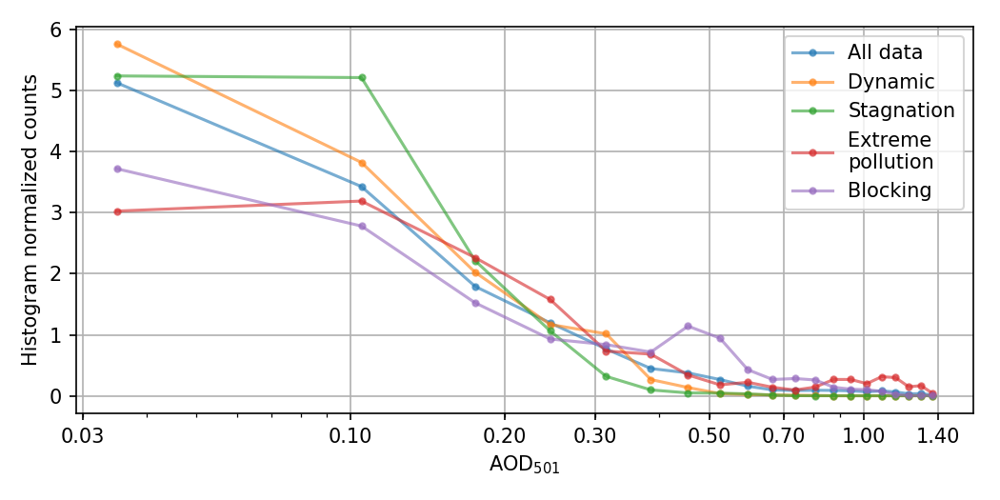

In [430]:
fig = plt.figure(figsize=(7,3.5))

x_vals = [(nn+n[1][ii+1])/2.0 for ii,nn in enumerate(n[1][0:-1])]
lines = plt.plot(x_vals,np.array(n[0]).T,'.-',alpha=0.6)

plt.legend(lines,['All data','Dynamic','Stagnation','Extreme\npollution','Blocking'],frameon=True)
plt.grid()
plt.xlabel('AOD$_{{501}}$')
plt.ylabel('Histogram normalized counts')
plt.xscale('log')

plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.xticks([0.03,0.1,0.2,0.3,0.5,0.7,1.0,1.4])
plt.tight_layout()

plt.savefig(fp+'plot/AOD_line_hist_met_KORUS_{}.png'.format(vv),dpi=600,transparent=True)

### Investigate the second mode of dynamic period

In [276]:
met1_aodh = ar['fl'] & (ar['doys']> t1[0]) & (ar['doys']< t1[1]) & (ar['AOD0501']>0.2) & np.isfinite(angs)
met1_aodl = ar['fl'] & (ar['doys']> t1[0]) & (ar['doys']< t1[1]) & (ar['AOD0501']<0.2) & np.isfinite(angs)
met1_aod = ar['fl'] & (ar['doys']> t1[0]) & (ar['doys']< t1[1]) & np.isfinite(angs)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  


In [245]:
ars.shape

(17, 583183)

In [278]:
ae = [linfit(np.log10(wvl[1:-4]),-np.log10(arsi[1:-4]))[0][0] for arsi in ars.T]

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in log10
  """Entry point for launching an IPython kernel.


In [279]:
ae = np.array(ae)

In [280]:
np.nanmean(ae[met1_aodl]),np.nanmean(ae[met1_aodh]),np.nanmean(ae[met1_aod]),\
np.nanmedian(ae[met1_aodl]),np.nanmedian(ae[met1_aodh]),np.nanmedian(ae[met1_aod]) 

(0.6302526008766858,
 0.5709597116653474,
 0.6171163674573118,
 0.6065713440090078,
 0.506085308989738,
 0.587507964327961)

## Plot the AOD spectra by met

In [63]:
aod_names = sorted([a for a in ar.keys() if ('AOD' in a) and not ('UNC' in a)])
wvl = np.array([380,452,501,520,532,550,606,620,675,781,865,1020,1040,1064,1236,1559,1627])
wvl_bins = np.append(wvl[0]-10,wvl+10)

In [84]:
ars = []
wvs = []
fls = {'fl':[],'fl_QA_met1':[],'fl_QA_met2':[],'fl_QA_met3':[],'fl_QA_met4':[]}
for i,a in enumerate(aod_names):
    ars.append(ar[a])
    wvs.append(ar[a]*0.0+wvl[i])
    for ff in fls.keys():
        fls[ff].append(ar[ff])
ars = np.array(ars)
wvs = np.array(wvs)
for ff in fls.keys():
    fls[ff] = np.array(fls[ff])
    fls[ff] = fls[ff].reshape(fls[ff].size)
arsn = ars.reshape(ars.size)
wvsn = wvs.reshape(wvs.size)

In [44]:
ar['AOD0501'].shape

(583183,)

In [45]:
np.nanmean(ars[2,:])

0.2663424839917687

In [46]:
iao = ar['fl'] & (ar['GPS_Alt'] < 1000.0)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [47]:
np.nanmean(ar['AOD0501'][iao]),np.nanstd(ar['AOD0501'][iao]) 

(0.3545910955111541, 0.2885437105229203)

<IPython.core.display.Javascript object>


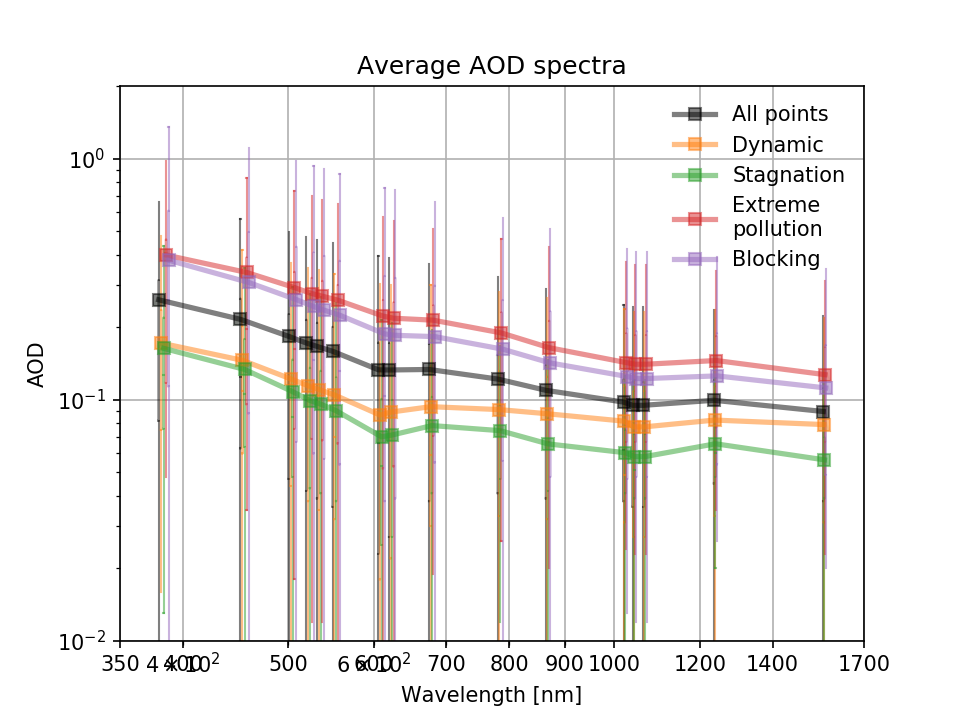

plotting_utils.py:591: RuntimeWarning: invalid value encountered in greater_equal
  val_fl = (val_lim>=c)&(val_lim<lims[i+1])
plotting_utils.py:591: RuntimeWarning: invalid value encountered in less
  val_fl = (val_lim>=c)&(val_lim<lims[i+1])


In [437]:
plt.figure()
plt.plot(wvsn[fls['fl']],arsn[fls['fl']],'.',alpha=0)
plt.yscale('log')
plt.xscale('log')
plt.xticks([350,400,500,600,700,800,900,1000,1200,1400,1700])
plt.xlim(350,1700)
plt.ylim([0.01,2.0])

me_all = pu.make_boxplot(arsn[fls['fl']],wvsn[fls['fl']],wvl_bins,wvl,y=1,alpha=0.5,label='All points',
                fliers_off=True,color='k')
me_met1 = pu.make_boxplot(arsn[fls['fl_QA_met1']],wvsn[fls['fl_QA_met1']],wvl_bins,wvl+2,y=1,alpha=0.5,label='Dynamic',
                fliers_off=True,color='tab:orange')
me_met2 = pu.make_boxplot(arsn[fls['fl_QA_met2']],wvsn[fls['fl_QA_met2']],wvl_bins,wvl+4,y=1,alpha=0.5,label='Stagnation',
                fliers_off=True,color='tab:green')
me_met3 = pu.make_boxplot(arsn[fls['fl_QA_met3']],wvsn[fls['fl_QA_met3']],wvl_bins,wvl+6,y=1,alpha=0.5,label='Extreme\npollution',
                fliers_off=True,color='tab:red')
me_met4 = pu.make_boxplot(arsn[fls['fl_QA_met4']],wvsn[fls['fl_QA_met4']],wvl_bins,wvl+8,y=1,alpha=0.5,label='Blocking',
                fliers_off=True,color='tab:purple')

plt.legend(frameon=False)

plt.xlabel('Wavelength [nm]')
plt.ylabel('AOD')
plt.grid()
plt.title('Average AOD spectra')

#plt.savefig(fp+'plot/KORUS_AOD_wvl_loglog_bymet_{}.png'.format(vv),dpi=600,transparent=True)

## Combine AOD histogram and spectra by met

In [55]:
[me_ae,nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(me_all[1:-5]))
[me_ae1,nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(me_met1[1:-5]))
[me_ae2,nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(me_met2[1:-5]))
[me_ae3,nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(me_met3[1:-5]))
[me_ae4,nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(me_met4[1:-5]))

<IPython.core.display.Javascript object>


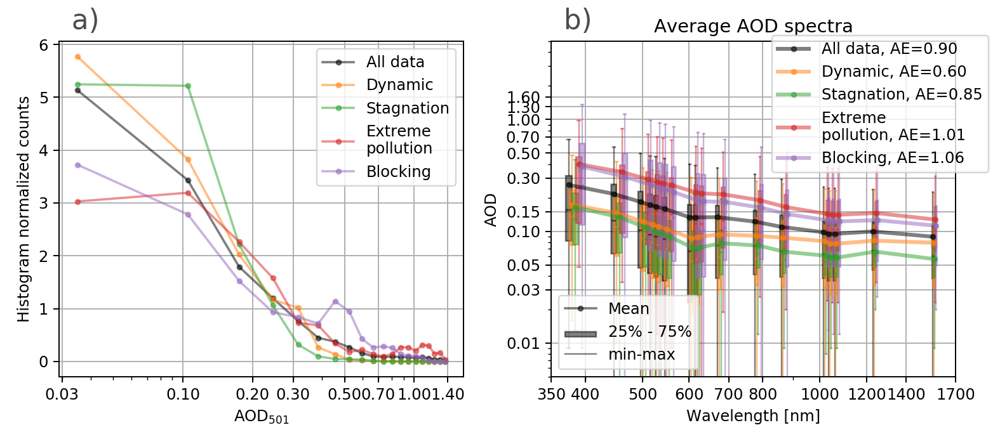

In [167]:
fig,ax = plt.subplots(1,2,figsize=(9,4))
ax1,ax2 = ax[0],ax[1]

x_vals = [(nn+n[1][ii+1])/2.0 for ii,nn in enumerate(n[1][0:-1])]
lines = ax1.plot(x_vals,np.array(n[0]).T,'.-',alpha=0.5)
lines[0].set_color('k')

ax1.legend(lines,['All data','Dynamic','Stagnation','Extreme\npollution','Blocking'],frameon=True)
ax1.grid()
ax1.set_xlabel('AOD$_{{501}}$')
ax1.set_ylabel('Histogram normalized counts')
ax1.set_xscale('log')

ax1.xaxis.set_major_formatter(ScalarFormatter())
ax1.set_xticks([0.03,0.1,0.2,0.3,0.5,0.7,1.0,1.4])
pu.sub_note('a)',ax=ax1,out=True)

### spectra
pl = ax2.plot([350.0,1700.0],[0.1,0.1],'.',alpha=0)
pl[0].axes.xaxis.set_minor_formatter(FormatStrFormatter(''))

ax2.grid()
ax2.set_yscale('log')
ax2.set_xscale('log')

ax2.xaxis.set_major_formatter(ScalarFormatter())
ax2.yaxis.set_major_formatter(ScalarFormatter())
ax2.set_xticks([350,400,500,600,700,800,1000,1200,1400,1700])
#ax2.set_xticklabels([350,400,500,600,700,800,900,1000,1200,1400,1700])

ax2.set_xlim(350,1700)
ax2.set_ylim([0.005,5.0])
ax2.set_yticks([0.01,0.03,0.05,0.1,0.15,0.3,0.5,0.7,1.0,1.3,1.6])
we = 9

me_all,bo_me_all = pu.make_boxplot(arsn[fls['fl']],wvsn[fls['fl']],wvl_bins,wvl-5,y=1,alpha=0.5,
                         label='All data, AE={:1.2f}'.format(me_ae),fliers_off=True,color='k',ax=ax2,tick_labels=False,
                         widths=we,patch_artist=True,return_bp=True,mean_marker='.')
me_met1 = pu.make_boxplot(arsn[fls['fl_QA_met1']],wvsn[fls['fl_QA_met1']],wvl_bins,wvl,y=1,alpha=0.5,
                          label='Dynamic, AE={:1.2f}'.format(me_ae1),fliers_off=True,color='tab:orange',
                          ax=ax2,tick_labels=False,widths=we,patch_artist=True,mean_marker='.')
me_met2 = pu.make_boxplot(arsn[fls['fl_QA_met2']],wvsn[fls['fl_QA_met2']],wvl_bins,wvl+5,y=1,alpha=0.5,
                          label='Stagnation, AE={:1.2f}'.format(me_ae2),fliers_off=True,color='tab:green',
                          ax=ax2,tick_labels=False,widths=we,patch_artist=True,mean_marker='.')
me_met3 = pu.make_boxplot(arsn[fls['fl_QA_met3']],wvsn[fls['fl_QA_met3']],wvl_bins,wvl+10,y=1,alpha=0.5,
                          label='Extreme\npollution, AE={:1.2f}'.format(me_ae3),fliers_off=True,color='tab:red',
                          ax=ax2,tick_labels=False,widths=we,patch_artist=True,mean_marker='.')
me_met4 = pu.make_boxplot(arsn[fls['fl_QA_met4']],wvsn[fls['fl_QA_met4']],wvl_bins,wvl+15,y=1,alpha=0.5,
                          label='Blocking, AE={:1.2f}'.format(me_ae4),fliers_off=True,color='tab:purple',
                          ax=ax2,tick_labels=False,widths=we,patch_artist=True,mean_marker='.')

ax2.set_xticks([350,400,500,600,700,800,1000,1200,1400,1700])
ax2.xaxis.set_major_formatter(ScalarFormatter())
ax2.yaxis.set_major_formatter(ScalarFormatter())
ax2.xaxis.set_minor_formatter(FormatStrFormatter(''))
lg_og = ax2.legend(frameon=True,loc=1,bbox_to_anchor=[1.1,1.04])

ax2c = ax2.get_children()
ccc = [i for i,c in enumerate(ax2c) if 'All data' in str(c.get_label())]
lg_bp = ax2.legend([ax2c[ccc[0]],bo_me_all['boxes'][0],bo_me_all['whiskers'][0]],
           ['Mean','25% - 75%','min-max'],
           frameon=True,loc=3,numpoints=1)
lg_bph = lg_bp.legendHandles
lg_bph[0].set_linewidth(1.5)
lg_bph[1].set_height(3)

ax2.add_artist(lg_og)

ax2.set_xlabel('Wavelength [nm]')
ax2.set_ylabel('AOD')

ax2.set_title('Average AOD spectra')
pu.sub_note('b)',ax=ax2,out=True)

plt.tight_layout()
plt.savefig(fp+'plot/KORUS_AOD_spectra_hist_bymet_{}_rev.png'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_spectra_hist_bymet_{}_rev.eps'.format(vv))
plt.savefig(fp+'plot/KORUS_AOD_spectra_hist_bymet_{}_rev.pdf'.format(vv))
plt.savefig(fp+'plot/KORUS_AOD_spectra_hist_bymet_{}_rev.svg'.format(vv))

# Quantify uncertainty (Section 4.1, Fig. 4)

## Plot out errors of FMF and AE based on AOD

In [15]:
aod_bins = np.arange(0,1.67,0.05)
aod_bins

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  , 1.05,
       1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35, 1.4 , 1.45, 1.5 , 1.55, 1.6 ,
       1.65])

In [198]:
aod_unc_bins,baod,baodn,avg_angs_b = make_binned_byaod(aodrr_unc[2,fl],aodrr[2,:],aod_bins,fl,y=angs_mean)
angs_bins,baod,baodn,avg_angs_b = make_binned_byaod(angs_std,aodrr[2,:],aod_bins,fl,y=angs_mean)
tauc_bins,baod,baodn,avg_tauc_b = make_binned_byaod(tauc_std,aodrr[2,:],aod_bins,fl,y=tauc_mean)
tauf_bins,baod,baodn,avg_tauf_b = make_binned_byaod(tauf_std,aodrr[2,:],aod_bins,fl,y=tauf_mean)
eta_bins,baod,baodn,avg_eta_b = make_binned_byaod(eta_std,aodrr[2,:],aod_bins,fl,y=eta_mean)

In [171]:
angs_mean.shape

(312273,)

In [182]:
fl_a1 = fl & (ar['GPS_Alt']<1000.0)
fl_a11 = ar['GPS_Alt'][fl]<1000.0
aod_unc_binsa,baod,baodn,avg_angs_ba = make_binned_byaod(aodrr_unc[2,fl_a1],aodrr[2,:],aod_bins,fl_a1,y=angs_mean[fl_a11])
angs_binsa,baod,baodn,avg_angs_ba = make_binned_byaod(angs_std[fl_a11],aodrr[2,:],aod_bins,fl_a1,y=angs_mean[fl_a11])
tauc_binsa,baod,baodn,avg_tauc_ba = make_binned_byaod(tauc_std[fl_a11],aodrr[2,:],aod_bins,fl_a1,y=tauc_mean[fl_a11])
tauf_binsa,baod,baodn,avg_tauf_ba = make_binned_byaod(tauf_std[fl_a11],aodrr[2,:],aod_bins,fl_a1,y=tauf_mean[fl_a11])
eta_binsa,baod,baodn,avg_eta_ba = make_binned_byaod(eta_std[fl_a11],aodrr[2,:],aod_bins,fl_a1,y=eta_mean[fl_a11])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


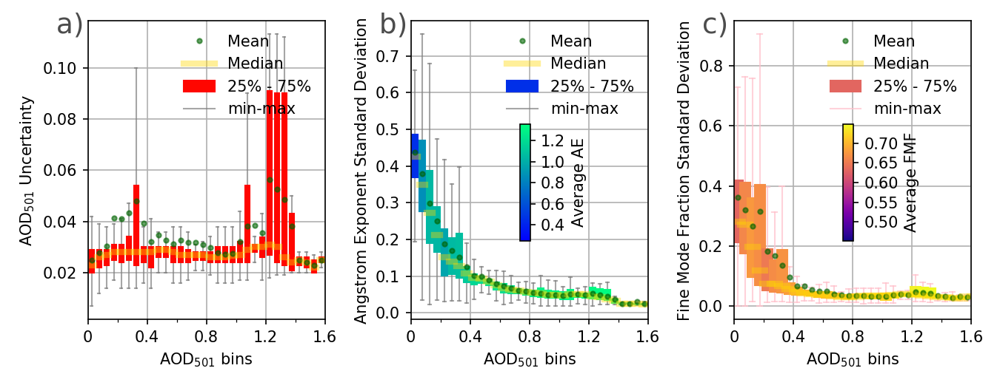

In [446]:
fig,ax = plt.subplots(1,3,figsize=(9,3.5))
dummy_n = np.array(baodn)*0.0+200.0
dummy_n[-1] = 205.0
bp = ax[0].boxplot(aod_unc_bins,positions=np.array(baod),vert=True,
                   showfliers=False,widths=0.03,showmeans=True,patch_artist=True)
gr = plt.cm.autumn_r
pu.set_box_whisker_color(gr,bp,dummy_n,whisker_color='grey')

ax[0].set_ylabel('AOD$_{{501}}$ Uncertainty')
ax[0].set_xlabel('AOD$_{{501}}$ bins')
ax[0].set_xlim(0,1.6)
ax[0].set_xticks([0,0.4,0.8,1.2,1.6])
ax[0].set_xticks([0.2,0.6,1.0,1.4],minor=True)
ax[0].set_xticklabels([0,0.4,0.8,1.2,1.6])
ax[0].grid()
ax[0].legend([bp['means'][0],bp['medians'][0],bp['boxes'][0],bp['whiskers'][0]],
               ['Mean','Median','25% - 75%','min-max'],
               frameon=False,loc=1,numpoints=1)

gr = plt.cm.winter
bp = ax[1].boxplot(angs_bins,positions=np.array(baod),vert=True,
                   showfliers=False,widths=0.04,showmeans=True,patch_artist=True)
ax[1].set_ylabel('Angstrom Exponent Standard Deviation')
ax[1].set_xlabel('AOD$_{{501}}$ bins')
pu.set_box_whisker_color(gr,bp,avg_angs_b,whisker_color='grey')

ax[1].set_xlim(0,1.6)
ax[1].set_xticks([0,0.4,0.8,1.2,1.6])
ax[1].set_xticks([0.2,0.6,1.0,1.4],minor=True)
ax[1].set_xticklabels([0,0.4,0.8,1.2,1.6])
ax[1].grid()

ax[1].legend([bp['means'][0],bp['medians'][0],bp['boxes'][0],bp['whiskers'][0]],
               ['Mean','Median','25% - 75%','min-max'],
               frameon=False,loc=1,numpoints=1)
scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
scalarmapgr.set_array(avg_angs_b)
cbaxesgr = fig.add_axes([0.52, 0.38, 0.01, 0.3])
cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr,label='Average AE')


bp = ax[2].boxplot(eta_bins,positions=np.array(baod),vert=True,
                   showfliers=False,widths=0.07,showmeans=True,patch_artist=True)
ax[2].set_ylabel('Fine Mode Fraction Standard Deviation')
ax[2].set_xlabel('AOD$_{{501}}$ bins')
gr = plt.cm.plasma
pu.set_box_whisker_color(gr,bp,avg_eta_b)

ax[2].set_xlim(0,1.6)
ax[2].set_xticks([0,0.4,0.8,1.2,1.6])
ax[2].set_xticks([0.2,0.6,1.0,1.4],minor=True)
ax[2].set_xticklabels([0,0.4,0.8,1.2,1.6])
ax[2].grid()

ax[2].legend([bp['means'][0],bp['medians'][0],bp['boxes'][0],bp['whiskers'][0]],
               ['Mean','Median','25% - 75%','min-max'],
               frameon=False,loc=1,numpoints=1)
scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
scalarmapgr.set_array(avg_eta_b)
cbaxesgr = fig.add_axes([0.843, 0.38, 0.01, 0.3])
cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr,label='Average FMF')

pu.sub_note('a)',ax=ax[0],out=True,dx=-0.18,dy=-0.08)
pu.sub_note('b)',ax=ax[1],out=True,dx=-0.18,dy=-0.08)
pu.sub_note('c)',ax=ax[2],out=True,dx=-0.18,dy=-0.08)

plt.tight_layout()
plt.savefig(fp+'plot/KORUS_4STAR_AOD_AE_FMF_UNC_vsAOD.png',transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_AOD_AE_FMF_UNC_vsAOD.pdf',transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_AOD_AE_FMF_UNC_vsAOD.eps',transparent=True,dpi=500)

In [453]:
np.percentile(aodrr[2,fl_a1],[5,10,15,25,37,50,66,75,85,90,95])

array([0.068, 0.086, 0.108, 0.143, 0.196, 0.267, 0.374, 0.46 , 0.612,
       0.807, 1.027])

# Get spatial representativeness of measurements

## GOCI

### Flag for over ocean

In [32]:
from global_land_mask import globe
# from Karin, Todd. Global Land Mask. October 5, 2020. https://doi.org/10.5281/zenodo.4066722
# using GLOBE data from Hastings, David A., and Paula K. Dunbar, 1999. Global Land One-kilometer Base Elevation
#(GLOBE) Digital Elevation Model, Documentation, Volume 1.0. Key to Geophysical Records
#Documentation (KGRD) 34. National Oceanic and Atmospheric Administration, National
#Geophysical Data Center, 325 Broadway, Boulder, Colorado 80303, U.S.A, https://repository.library.noaa.gov/view/noaa/13424

In [33]:
is_in_ocean_good = globe.is_ocean(goci2ar['lat'][fl], goci2ar['lon'][fl])

In [34]:
is_in_ocean = np.full(goci2ar['lat'].shape,False)
is_in_ocean[fl] = is_in_ocean_good

In [35]:
print( goci2ar['lat'][fl].shape, goci2ar['lat'].shape, is_in_ocean.shape)

((312273,), (583183,), (583183,))


### Make daily regional averages to compare to flight subsets

In [50]:
goci[0]['lat'].min(), goci[0]['lat'].max()

(21.614147, 48.201965)

In [51]:
goci[0]['lon'].min(), goci[0]['lon'].max()

(111.370544, 148.55789)

In [52]:
np.nanmin(ar['Latitude']),np.nanmax(ar['Latitude'])

(22.9100406, 61.1789)

In [53]:
np.nanmin(ar['Longitude']),np.nanmax(ar['Longitude'])

(-162.3871431, 156.2459364)

In [54]:
itransit = ar['days']!=19.0

In [55]:
for da in np.unique(ar['days']):
    itr = ar['days']==da
    print 'days: {}, lat range: {}, {}, lon range: {}, {}'.format(da,
            np.nanmin(ar['Latitude'][itr]),np.nanmax(ar['Latitude'][itr]),
            np.nanmin(ar['Longitude'][itr]),np.nanmax(ar['Longitude'][itr]))

days: 0.0, lat range: 33.8475, 37.7107, lon range: 125.0062309, 127.6928
days: 1.0, lat range: 33.8724711, 37.6641, lon range: 124.1611, 127.7814
days: 2.0, lat range: 33.8554, 37.6658, lon range: 125.6975227, 127.7036
days: 3.0, lat range: 35.1238, 37.652, lon range: 126.9273, 130.6727
days: 4.0, lat range: 32.8799, 37.7059, lon range: 125.4767, 129.8547
days: 5.0, lat range: 36.026, 38.1154, lon range: 124.1642, 131.3576
days: 6.0, lat range: 32.5102, 37.661892, lon range: 124.0772, 128.4968523
days: 7.0, lat range: 33.8552, 37.6599, lon range: 125.5832, 129.5213
days: 8.0, lat range: 34.3123, 37.6729, lon range: 124.2171, 129.4653
days: 9.0, lat range: 34.914, 37.6918, lon range: 126.9504, 130.7532
days: 10.0, lat range: 22.9100406, 37.6649719, lon range: 124.821025, 127.7271
days: 11.0, lat range: 30.1070029, 37.6909, lon range: 124.1786, 127.6744
days: 12.0, lat range: 34.1654, 37.5765, lon range: 126.6076, 127.6900185
days: 13.0, lat range: 33.8413, 37.7039024, lon range: 124.268

In [56]:
itr = (ar['days']!=19.0) &  np.isfinite(ar['Latitude']) &  np.isfinite(ar['Longitude'])
print 'days: {}, lat range: {}, {}, lon range: {}, {}'.format(da,
        np.nanmin(ar['Latitude'][itr]),np.nanmax(ar['Latitude'][itr]),
        np.nanmin(ar['Longitude'][itr]),np.nanmax(ar['Longitude'][itr]))
np.percentile(ar['Latitude'][itr],[5,10,25,75,90,95]),np.percentile(ar['Longitude'][itr],[5,10,25,75,90,95])

days: 19.0, lat range: 30.1070029, 38.1154, lon range: 124.0772, 131.3576


(array([33.77794857, 34.41141532, 35.4361149 , 37.30258665, 37.41351397,
        37.58333589]),
 array([124.28895352, 124.39805832, 126.54632695, 127.59973952,
        128.55298631, 129.34480629]))

In [57]:
j = 104
'GOCI: lat range: {}, {}, lon range: {}, {}'.format(
    goci[j]['lat'].min(), goci[j]['lat'].max(),goci[j]['lon'].min(), goci[j]['lon'].max())

'GOCI: lat range: 21.6141471863, 48.201965332, lon range: 111.370544434, 148.557891846'

In [58]:
lat_rg = [33.8,37.6] # from percentiles of 4STAR data
lon_rg = [124.3,129.4]

In [59]:
goci[0]['lat'].shape

(473, 463)

In [60]:
igoci_rg = (goci[0]['lat']>lat_rg[0]) & (goci[0]['lat']<lat_rg[1]) & (goci[0]['lon']>lon_rg[0]) & (goci[0]['lon']<lon_rg[1])

In [61]:
igoci_rg.any()

True

In [62]:
goci[0]['lat'][igoci_rg].shape

(5402,)

In [63]:
goci_time = {}
goci_time['aod_mean'] = np.array([np.nanmean(g['aod'][igoci_rg]) for g in goci])
goci_time['aod_median'] = np.array([np.nanmedian(g['aod'][igoci_rg]) for g in goci])
goci_time['aod_std'] = np.array([np.nanstd(g['aod'][igoci_rg]) for g in goci])
goci_time['ae_mean'] = np.array([np.nanmean(g['AE'][igoci_rg]) for g in goci])
goci_time['ae_median'] = np.array([np.nanmedian(g['AE'][igoci_rg]) for g in goci])
goci_time['ae_std'] = np.array([np.nanstd(g['AE'][igoci_rg]) for g in goci])
goci_time['fmf_mean'] = np.array([np.nanmean(g['fmf'][igoci_rg]) for g in goci])
goci_time['fmf_median'] = np.array([np.nanmedian(g['fmf'][igoci_rg]) for g in goci])
goci_time['fmf_std'] = np.array([np.nanstd(g['fmf'][igoci_rg]) for g in goci])
goci_time['doys'] = np.array([np.nanmean(g['doys'][igoci_rg]) for g in goci])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: Mean of empty slice
  
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: Mean of empty slice
  """
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  


### Make sampling analysis and combined for easier plotting

In [67]:
gociar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
ar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
for da in np.unique(goci2ar['doys'].astype(int)):
    ida = goci2ar['doys'].astype(int)==da
    gociar_time['aod_mean'].append(np.nanmean(goci2ar['aod'][ida]))
    gociar_time['aod_median'].append(np.nanmedian(goci2ar['aod'][ida]))
    gociar_time['aod_std'].append(np.nanstd(goci2ar['aod'][ida]))
    gociar_time['doys'].append(np.nanmean(goci2ar['doys'][ida]))
    
    iaa = (ar['doys'].astype(int)==da) & np.isfinite(ar['AOD0501']) & ar['fl_QA'] & (ar['GPS_Alt']<1000.0)
    ar_time['aod_mean'].append(np.nanmean(ar['AOD0501'][iaa]))
    ar_time['aod_median'].append(np.nanmedian(ar['AOD0501'][iaa]))
    ar_time['aod_std'].append(np.nanstd(ar['AOD0501'][iaa]))
    ar_time['doys'].append(np.nanmean(ar['doys'][iaa]))

for k in gociar_time.keys():
    gociar_time[k] = np.array(gociar_time[k])
    ar_time[k] = np.array(ar_time[k])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in less
  if sys.path[0] == '':
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1076: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: Mean of empty slice
  app.launch_new_instance()


In [64]:
gociar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
ar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
for da in np.unique(goci2ar['doys'].astype(int)):
    ida = goci2ar['doys'].astype(int)==da
    gociar_time['aod_mean'].append(np.nanmean(goci2ar['aod'][ida]))
    gociar_time['aod_median'].append(np.nanmedian(goci2ar['aod'][ida]))
    gociar_time['aod_std'].append(np.nanstd(goci2ar['aod'][ida]))
    gociar_time['ae_mean'].append(np.nanmean(goci2ar['AE'][ida]))
    gociar_time['ae_median'].append(np.nanmedian(goci2ar['AE'][ida]))
    gociar_time['ae_std'].append(np.nanstd(goci2ar['AE'][ida]))
    gociar_time['fmf_mean'].append(np.nanmean(goci2ar['fmf'][ida]))
    gociar_time['fmf_median'].append(np.nanmedian(goci2ar['fmf'][ida]))
    gociar_time['fmf_std'].append(np.nanstd(goci2ar['fmf'][ida]))
    gociar_time['doys'].append(np.nanmean(goci2ar['doys'][ida]))
    
    iaa = (ar['doys'].astype(int)==da) & np.isfinite(ar['AOD0501']) & ar['fl_QA'] & (ar['GPS_Alt']<1000.0)
    ar_time['aod_mean'].append(np.nanmean(ar['AOD0501'][iaa]))
    ar_time['aod_median'].append(np.nanmedian(ar['AOD0501'][iaa]))
    ar_time['aod_std'].append(np.nanstd(ar['AOD0501'][iaa]))
    ar_time['ae_mean'].append(np.nanmean(angs[iaa]))
    ar_time['ae_median'].append(np.nanmedian(angs[iaa]))
    ar_time['ae_std'].append(np.nanstd(angs[iaa]))
    ar_time['fmf_mean'].append(np.nanmean(fmf['eta'][iaa]))
    ar_time['fmf_median'].append(np.nanmedian(fmf['eta'][iaa]))
    ar_time['fmf_std'].append(np.nanstd(fmf['eta'][iaa]))
    ar_time['doys'].append(np.nanmean(ar['doys'][iaa]))

for k in gociar_time.keys():
    gociar_time[k] = np.array(gociar_time[k])
    ar_time[k] = np.array(ar_time[k])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in less


NameError: name 'angs' is not defined

In [570]:
goci2ar.keys()

['fmf', 'aod', 'AE', 'doys', 'lat', 'aod_c', 'lon', 'CF', 'aod_f']

In [571]:
goci2ar['doys'].astype(int)

array([123, 123, 123, ..., 166, 166, 166])

<IPython.core.display.Javascript object>


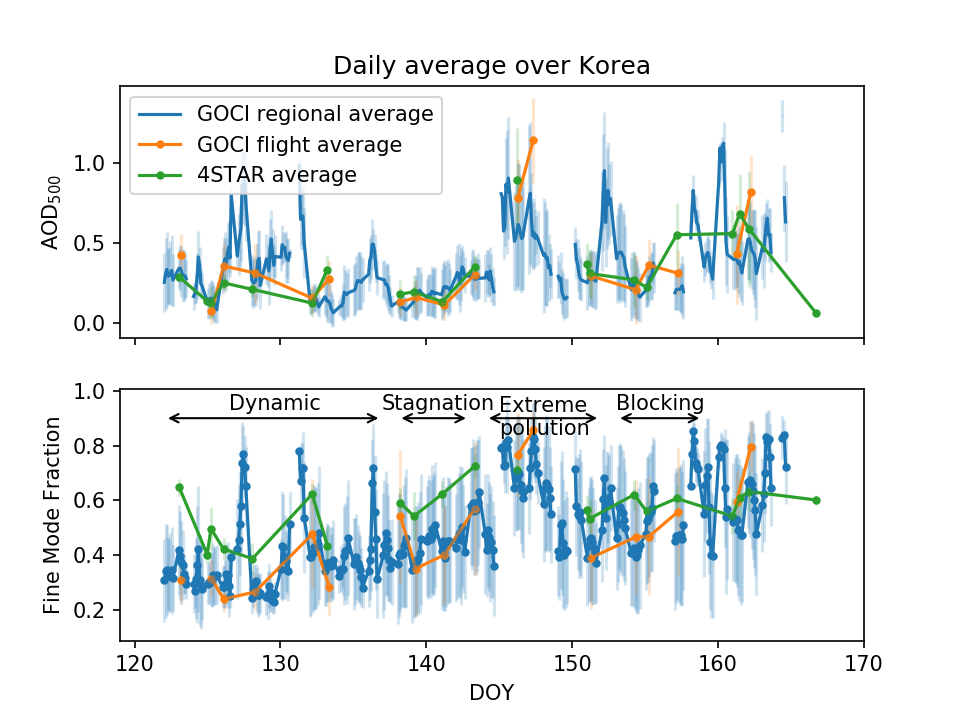

In [627]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(goci_time['doys'],goci_time['aod_mean'],'.-',markersize=0.1,label='GOCI regional average')
ax[0].errorbar(goci_time['doys'],goci_time['aod_mean'],yerr=goci_time['aod_std'],markersize=0.1,marker='.',c='tab:blue',alpha=0.2)
ax[0].plot(gociar_time['doys'],gociar_time['aod_mean'],'.-',label='GOCI flight average')
ax[0].errorbar(gociar_time['doys'],gociar_time['aod_mean'],yerr=gociar_time['aod_std'],marker='.',c='tab:orange',alpha=0.2)
ax[0].plot(ar_time['doys'],ar_time['aod_mean'],'.-',label='4STAR average')
ax[0].errorbar(ar_time['doys'],ar_time['aod_mean'],yerr=ar_time['aod_std'],marker='.',c='tab:green',alpha=0.2)
ax[1].set_xlabel('DOY')
ax[0].set_ylabel('AOD$_{{500}}$')
ax[0].set_title('Daily average over Korea')
ax[0].legend()

ax[1].plot(goci_time['doys'],goci_time['fmf_mean'],'.-',label='GOCI regional average')
ax[1].errorbar(goci_time['doys'],goci_time['fmf_mean'],yerr=goci_time['fmf_std'],marker='.',c='tab:blue',alpha=0.2)
ax[1].plot(gociar_time['doys'],gociar_time['fmf_mean'],'.-',label='GOCI flight average')
ax[1].errorbar(gociar_time['doys'],gociar_time['fmf_mean'],yerr=gociar_time['fmf_std'],marker='.',c='tab:orange',alpha=0.2)
ax[1].plot(ar_time['doys'],ar_time['fmf_mean'],'.-',label='4STAR average')
ax[1].errorbar(ar_time['doys'],ar_time['fmf_mean'],yerr=ar_time['fmf_std'],marker='.',c='tab:green',alpha=0.2)
ax[1].set_ylabel('Fine Mode Fraction')

ax[1].set_xlim([119,170])

# add the met regimes
annotate_point_pair(ax[1],met_period_labels[0],(t1[0],0.9),(t1[1],0.9),text_yoffset=-4,text_xoffset=3)
annotate_point_pair(ax[1],met_period_labels[1],(t2[0],0.9),(t2[1],0.9),text_yoffset=-4,text_xoffset=3.6)
annotate_point_pair(ax[1],met_period_labels[2],(t3[0],0.9),(t3[1],0.9),text_yoffset=8,text_xoffset=3)
annotate_point_pair(ax[1],met_period_labels[3],(t4[0],0.9),(t4[1],0.9),text_yoffset=-4,text_xoffset=3)

plt.savefig(fp+'plot/KORUS_GOCI_AOD_daily_avgs_{}.png'.format(vv),dpi=600,transparent=True)

In [573]:
np.nanmean(goci_time['aod_mean']), np.nanmean(gociar_time['aod_mean']), np.nanmean(ar_time['aod_mean'])

(0.3690783, 0.37052565596690373, 0.32713123867735033)

In [556]:
np.nanmean(goci_time['fmf_mean']), np.nanmean(gociar_time['fmf_mean']), np.nanmean(ar_time['fmf_mean'])

(0.49067438, 0.4807234482683772, 0.5657525637831378)

<IPython.core.display.Javascript object>


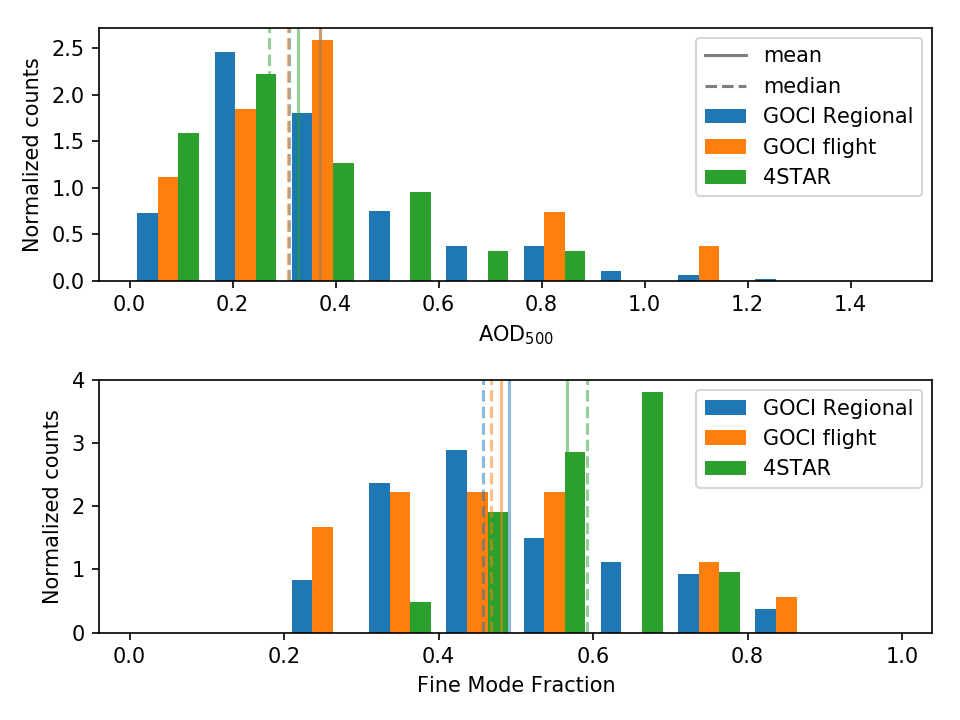

In [574]:
fig, ax = plt.subplots(2,1)
ax[0].hist([goci_time['aod_mean'],gociar_time['aod_mean'],ar_time['aod_mean']],
           label=['GOCI Regional','GOCI flight','4STAR'],range=[0,1.5],normed=True)


ax[0].axvline(np.nanmean(goci_time['aod_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[0].axvline(np.nanmedian(goci_time['aod_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[0].axvline(np.nanmean(gociar_time['aod_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[0].axvline(np.nanmedian(gociar_time['aod_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[0].axvline(np.nanmean(ar_time['aod_mean']),ls='-',alpha=0.5,c='tab:green')
ax[0].axvline(np.nanmedian(ar_time['aod_mean']),ls='--',alpha=0.5,c='tab:green')
ax[0].axvline([np.nan],ls='-',alpha=0.5,c='k',label='mean')
ax[0].axvline([np.nan],ls='--',alpha=0.5,c='k',label='median')
ax[0].legend()
ax[0].set_xlabel('AOD$_{{500}}$')
ax[0].set_ylabel('Normalized counts')

ax[1].hist([goci_time['fmf_mean'],gociar_time['fmf_mean'],ar_time['fmf_mean']],
           label=['GOCI Regional','GOCI flight','4STAR'],range=[0,1.0],normed=True)
ax[1].legend()

ax[1].axvline(np.nanmean(goci_time['fmf_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[1].axvline(np.nanmedian(goci_time['fmf_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[1].axvline(np.nanmean(gociar_time['fmf_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[1].axvline(np.nanmedian(gociar_time['fmf_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[1].axvline(np.nanmean(ar_time['fmf_mean']),ls='-',alpha=0.5,c='tab:green')
ax[1].axvline(np.nanmedian(ar_time['fmf_mean']),ls='--',alpha=0.5,c='tab:green')
ax[1].set_xlabel('Fine Mode Fraction')
ax[1].set_ylabel('Normalized counts')
plt.tight_layout()

plt.savefig(fp+'plot/KORUS_GOCI_hist_daily_avgs_{}.png'.format(vv),dpi=600,transparent=True)

## MERRA-2 regional

In [619]:
j = 2
'MERRA: lat range: {}, {}, lon range: {}, {}'.format(
    merra[j]['lat'].min(), merra[j]['lat'].max(),merra[j]['lon'].min(), merra[j]['lon'].max())

'MERRA: lat range: -90.0, 90.0, lon range: -180.0, 179.375'

In [620]:
lat_rg = [33.8,37.6] # from percentiles of 4STAR data
lon_rg = [124.3,129.4]

In [621]:
imerra_rg_lat = (merra[0]['lat']>lat_rg[0]) & (merra[0]['lat']<lat_rg[1])
imerra_rg_lon = (merra[0]['lon']>lon_rg[0]) & (merra[0]['lon']<lon_rg[1])

In [622]:
imerra_rg_lat.shape, imerra_rg_lon.shape

((361,), (576,))

In [623]:
merra_time = {}
merra_time['aod_mean'] = np.array([np.nanmean(g['aod'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['aod_median'] = np.array([np.nanmedian(g['aod'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['aod_std'] = np.array([np.nanstd(g['aod'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['ae_mean'] = np.array([np.nanmean(g['ae'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['ae_median'] = np.array([np.nanmedian(g['ae'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['ae_std'] = np.array([np.nanstd(g['ae'][:,imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
#merra_time['fmf_mean'] = np.array([np.nanmean(g['fmf'][imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
#merra_time['fmf_median'] = np.array([np.nanmedian(g['fmf'][imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
#merra_time['fmf_std'] = np.array([np.nanstd(g['fmf'][imerra_rg_lat,:][:,:,imerra_rg_lon]) for g in merra])
merra_time['doys'] = np.array(merra_doy)+0.5

In [636]:
merraar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
for da in np.unique(merra2ar['doys'].astype(int)):
    ida = merra2ar['doys'].astype(int)==da
    merraar_time['aod_mean'].append(np.nanmean(merra2ar['aod'][ida]))
    merraar_time['aod_median'].append(np.nanmedian(merra2ar['aod'][ida]))
    merraar_time['aod_std'].append(np.nanstd(merra2ar['aod'][ida]))
    merraar_time['ae_mean'].append(np.nanmean(merra2ar['ae'][ida]))
    merraar_time['ae_median'].append(np.nanmedian(merra2ar['ae'][ida]))
    merraar_time['ae_std'].append(np.nanstd(merra2ar['ae'][ida]))
    #merraar_time['fmf_mean'].append(np.nanmean(merra2ar['fmf'][ida]))
    #merraar_time['fmf_median'].append(np.nanmedian(merra2ar['fmf'][ida]))
    #merraar_time['fmf_std'].append(np.nanstd(merra2ar['fmf'][ida]))
    merraar_time['doys'].append(np.nanmean(merra2ar['doys'][ida]))

for k in merraar_time.keys():
    merraar_time[k] = np.array(merraar_time[k])

In [634]:
# Use the calculated merraint aod_alt, ae_alt, see section 7.2

merraar_time = {'aod_mean':[],'aod_median':[],'aod_std':[],
               'ae_mean':[],'ae_median':[],'ae_std':[],'fmf_mean':[],'fmf_median':[],'fmf_std':[],'doys':[]}
for da in np.unique(merra2ar['doys'].astype(int)):
    ida = merraint['doy'].astype(int)==da
    merraar_time['aod_mean'].append(np.nanmean(merraint['aod_alt'][ida]))
    merraar_time['aod_median'].append(np.nanmedian(merraint['aod_alt'][ida]))
    merraar_time['aod_std'].append(np.nanstd(merraint['aod_alt'][ida]))
    merraar_time['ae_mean'].append(np.nanmean(merraint['ae_alt'][ida]))
    merraar_time['ae_median'].append(np.nanmedian(merraint['ae_alt'][ida]))
    merraar_time['ae_std'].append(np.nanstd(merraint['ae_alt'][ida]))
    #merraar_time['fmf_mean'].append(np.nanmean(merra2ar['fmf'][ida]))
    #merraar_time['fmf_median'].append(np.nanmedian(merra2ar['fmf'][ida]))
    #merraar_time['fmf_std'].append(np.nanstd(merra2ar['fmf'][ida]))
    merraar_time['doys'].append(np.nanmean(merraint['doy'][ida]))

for k in merraar_time.keys():
    merraar_time[k] = np.array(merraar_time[k])

<IPython.core.display.Javascript object>


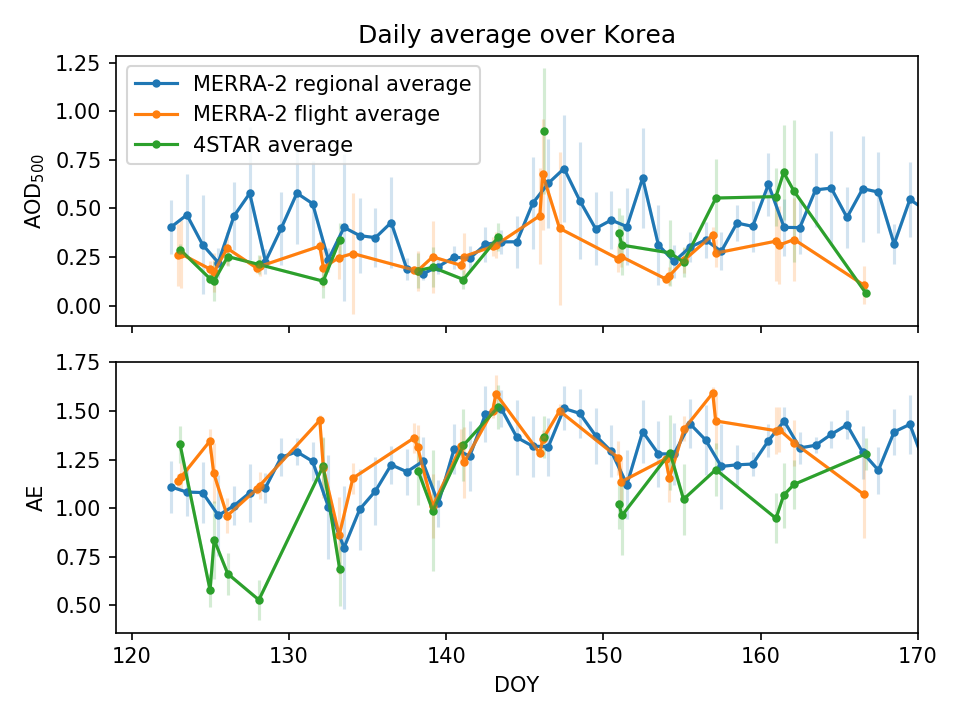

In [637]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(merra_time['doys'],merra_time['aod_mean'],'.-',label='MERRA-2 regional average')
ax[0].errorbar(merra_time['doys'],merra_time['aod_mean'],yerr=merra_time['aod_std'],marker='.',c='tab:blue',alpha=0.2)
ax[0].plot(merraar_time['doys'],merraar_time['aod_mean'],'.-',label='MERRA-2 flight average')
ax[0].errorbar(merraar_time['doys'],merraar_time['aod_mean'],yerr=merraar_time['aod_std'],marker='.',c='tab:orange',alpha=0.2)
ax[0].plot(ar_time['doys'],ar_time['aod_mean'],'.-',label='4STAR average')
ax[0].errorbar(ar_time['doys'],ar_time['aod_mean'],yerr=ar_time['aod_std'],marker='.',c='tab:green',alpha=0.2)
ax[1].set_xlabel('DOY')
ax[0].set_ylabel('AOD$_{{500}}$')
ax[0].set_title('Daily average over Korea')
ax[0].legend()

ax[1].plot(merra_time['doys'],merra_time['ae_mean'],'.-',label='merra regional average')
ax[1].errorbar(merra_time['doys'],merra_time['ae_mean'],yerr=merra_time['ae_std'],marker='.',c='tab:blue',alpha=0.2)
ax[1].plot(merraar_time['doys'],merraar_time['ae_mean'],'.-',label='merra flight average')
ax[1].errorbar(merraar_time['doys'],merraar_time['ae_mean'],yerr=merraar_time['ae_std'],marker='.',c='tab:orange',alpha=0.2)
ax[1].plot(ar_time['doys'],ar_time['ae_mean'],'.-',label='4STAR average')
ax[1].errorbar(ar_time['doys'],ar_time['ae_mean'],yerr=ar_time['ae_std'],marker='.',c='tab:green',alpha=0.2)
ax[1].set_ylabel('AE')

ax[1].set_xlim([119,170])

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_MERRA_AOD_daily_avgs_{}.png'.format(vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


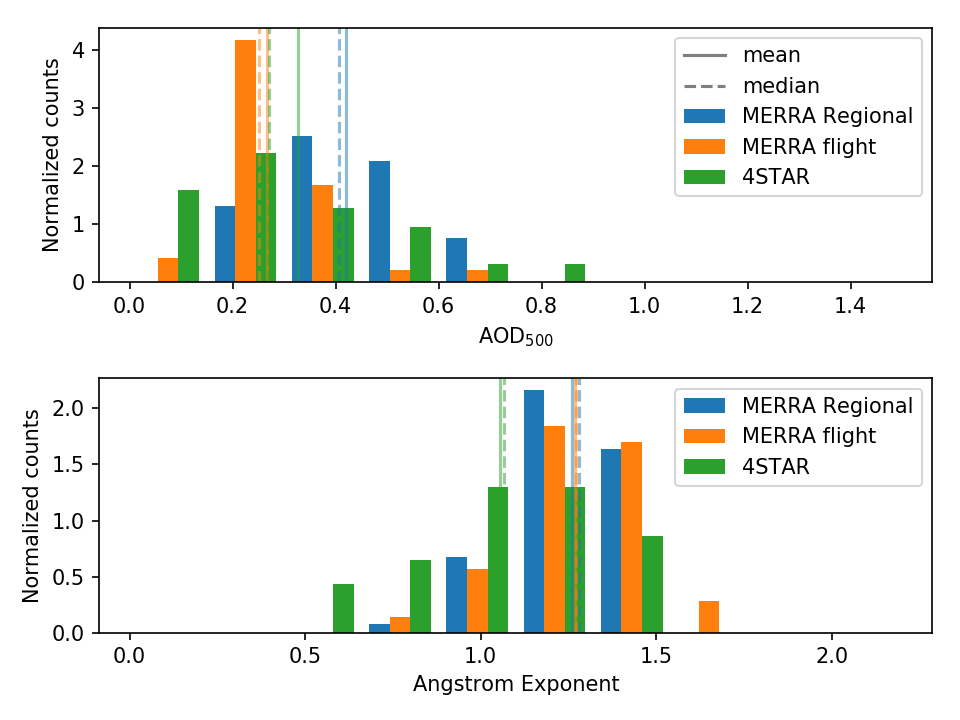

In [629]:
fig, ax = plt.subplots(2,1)
ax[0].hist([merra_time['aod_mean'],merraar_time['aod_mean'],ar_time['aod_mean']],
           label=['MERRA Regional','MERRA flight','4STAR'],range=[0,1.5],normed=True)


ax[0].axvline(np.nanmean(merra_time['aod_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[0].axvline(np.nanmedian(merra_time['aod_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[0].axvline(np.nanmean(merraar_time['aod_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[0].axvline(np.nanmedian(merraar_time['aod_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[0].axvline(np.nanmean(ar_time['aod_mean']),ls='-',alpha=0.5,c='tab:green')
ax[0].axvline(np.nanmedian(ar_time['aod_mean']),ls='--',alpha=0.5,c='tab:green')
ax[0].axvline([np.nan],ls='-',alpha=0.5,c='k',label='mean')
ax[0].axvline([np.nan],ls='--',alpha=0.5,c='k',label='median')
ax[0].legend()
ax[0].set_xlabel('AOD$_{{500}}$')
ax[0].set_ylabel('Normalized counts')

ax[1].hist([merra_time['ae_mean'],merraar_time['ae_mean'],ar_time['ae_mean']],
           label=['MERRA Regional','MERRA flight','4STAR'],range=[0,2.2],normed=True)
ax[1].legend()

ax[1].axvline(np.nanmean(merra_time['ae_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[1].axvline(np.nanmedian(merra_time['ae_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[1].axvline(np.nanmean(merraar_time['ae_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[1].axvline(np.nanmedian(merraar_time['ae_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[1].axvline(np.nanmean(ar_time['ae_mean']),ls='-',alpha=0.5,c='tab:green')
ax[1].axvline(np.nanmedian(ar_time['ae_mean']),ls='--',alpha=0.5,c='tab:green')
ax[1].set_xlabel('Angstrom Exponent')
ax[1].set_ylabel('Normalized counts')
plt.tight_layout()

plt.savefig(fp+'plot/KORUS_MERRA_hist_daily_avgs_{}.png'.format(vv),dpi=600,transparent=True)

## Combine regional/flight average GOCI, MERRA-2, and 4STAR plots (Section 4.2, Fig. 5)

In [672]:
def height_increase(ax,h):
    pos = ax.get_position()
    pos.y0 = pos.y0+h
    pos.y1 = pos.y1+h
    ax.set_position(pos)

<IPython.core.display.Javascript object>


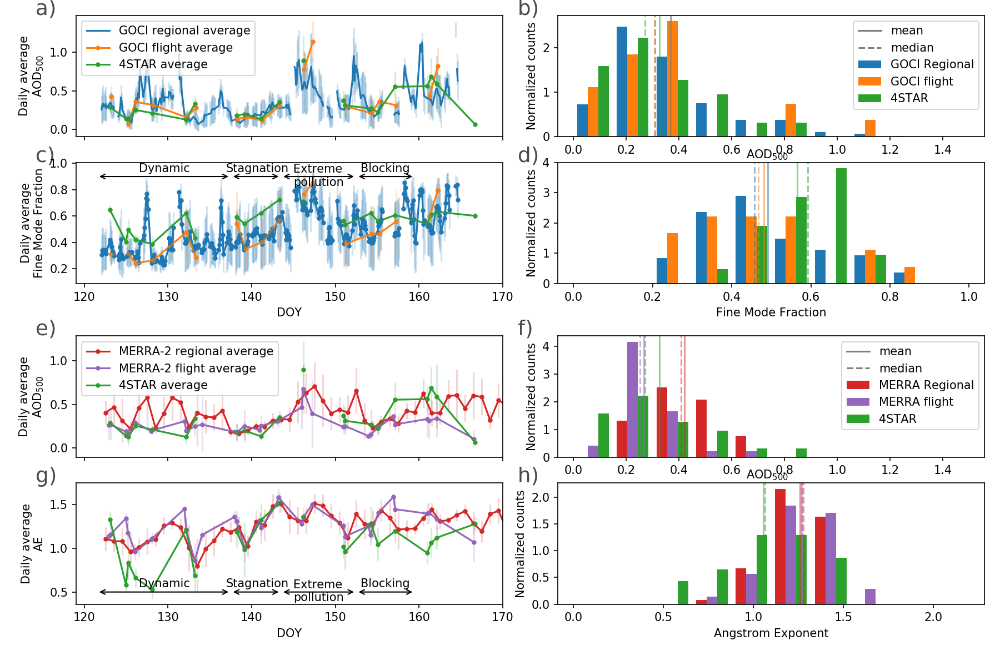

In [709]:
fig, ax = plt.subplots(4,2,sharex=False,figsize=(12,8))

## GOCI daily averages
ax[0,0].plot(goci_time['doys'],goci_time['aod_mean'],'.-',markersize=0.1,label='GOCI regional average')
ax[0,0].errorbar(goci_time['doys'],goci_time['aod_mean'],yerr=goci_time['aod_std'],markersize=0.1,marker='.',c='tab:blue',alpha=0.2)
ax[0,0].plot(gociar_time['doys'],gociar_time['aod_mean'],'.-',label='GOCI flight average')
ax[0,0].errorbar(gociar_time['doys'],gociar_time['aod_mean'],yerr=gociar_time['aod_std'],marker='.',c='tab:orange',alpha=0.2)
ax[0,0].plot(ar_time['doys'],ar_time['aod_mean'],'.-',label='4STAR average')
ax[0,0].errorbar(ar_time['doys'],ar_time['aod_mean'],yerr=ar_time['aod_std'],marker='.',c='tab:green',alpha=0.2)
ax[0,0].set_xticklabels([])
ax[1,0].set_xlabel('DOY')
ax[0,0].set_ylabel('Daily average\nAOD$_{{500}}$')
#ax[0,0].set_title('Daily average over Korea')
ax[0,0].legend()

ax[1,0].plot(goci_time['doys'],goci_time['fmf_mean'],'.-',label='GOCI regional average')
ax[1,0].errorbar(goci_time['doys'],goci_time['fmf_mean'],yerr=goci_time['fmf_std'],marker='.',c='tab:blue',alpha=0.2)
ax[1,0].plot(gociar_time['doys'],gociar_time['fmf_mean'],'.-',label='GOCI flight average')
ax[1,0].errorbar(gociar_time['doys'],gociar_time['fmf_mean'],yerr=gociar_time['fmf_std'],marker='.',c='tab:orange',alpha=0.2)
ax[1,0].plot(ar_time['doys'],ar_time['fmf_mean'],'.-',label='4STAR average')
ax[1,0].errorbar(ar_time['doys'],ar_time['fmf_mean'],yerr=ar_time['fmf_std'],marker='.',c='tab:green',alpha=0.2)
ax[1,0].set_ylabel('Daily average\nFine Mode Fraction')

ax[0,0].get_shared_x_axes().join(ax[0,0], ax[1,0], ax[2,0],ax[3,0])
ax[1,0].set_xlim([119,170])

# add the met regimes
annotate_point_pair(ax[1,0],met_period_labels[0],(t1[0]-0.5,0.9),(t1[1]+0.5,0.9),text_yoffset=-4,text_xoffset=3)
annotate_point_pair(ax[1,0],met_period_labels[1],(t2[0]-0.5,0.9),(t2[1]+0.5,0.9),text_yoffset=-4,text_xoffset=3.6)
annotate_point_pair(ax[1,0],met_period_labels[2],(t3[0]-0.5,0.9),(t3[1]+0.5,0.9),text_yoffset=8,text_xoffset=3)
annotate_point_pair(ax[1,0],met_period_labels[3],(t4[0]-0.5,0.9),(t4[1]+0.5,0.9),text_yoffset=-4,text_xoffset=3)

## GOCI histogram
ax[0,1].hist([goci_time['aod_mean'],gociar_time['aod_mean'],ar_time['aod_mean']],
           label=['GOCI Regional','GOCI flight','4STAR'],range=[0,1.5],normed=True)

ax[0,1].axvline(np.nanmean(goci_time['aod_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[0,1].axvline(np.nanmedian(goci_time['aod_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[0,1].axvline(np.nanmean(gociar_time['aod_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[0,1].axvline(np.nanmedian(gociar_time['aod_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[0,1].axvline(np.nanmean(ar_time['aod_mean']),ls='-',alpha=0.5,c='tab:green')
ax[0,1].axvline(np.nanmedian(ar_time['aod_mean']),ls='--',alpha=0.5,c='tab:green')
ax[0,1].axvline([np.nan],ls='-',alpha=0.5,c='k',label='mean')
ax[0,1].axvline([np.nan],ls='--',alpha=0.5,c='k',label='median')
ax[0,1].legend()
ax[0,1].set_xlabel('AOD$_{{500}}$   ',labelpad=-6.5)
ax[0,1].set_ylabel('Normalized counts')
#ax[1,1].set_xlim([0,1.5])

ax[1,1].hist([goci_time['fmf_mean'],gociar_time['fmf_mean'],ar_time['fmf_mean']],
           label=['GOCI Regional','GOCI flight','4STAR'],range=[0,1.0],normed=True)
#ax[1,1].legend()

ax[1,1].axvline(np.nanmean(goci_time['fmf_mean']),ls='-',alpha=0.5,c='tab:blue')
ax[1,1].axvline(np.nanmedian(goci_time['fmf_mean']),ls='--',alpha=0.5,c='tab:blue')
ax[1,1].axvline(np.nanmean(gociar_time['fmf_mean']),ls='-',alpha=0.5,c='tab:orange')
ax[1,1].axvline(np.nanmedian(gociar_time['fmf_mean']),ls='--',alpha=0.5,c='tab:orange')
ax[1,1].axvline(np.nanmean(ar_time['fmf_mean']),ls='-',alpha=0.5,c='tab:green')
ax[1,1].axvline(np.nanmedian(ar_time['fmf_mean']),ls='--',alpha=0.5,c='tab:green')
ax[1,1].set_xlabel('Fine Mode Fraction')
ax[1,1].set_ylabel('Normalized counts')


## MERRA daily averages
ax[2,0].plot(merra_time['doys'],merra_time['aod_mean'],'.-',label='MERRA-2 regional average',c='tab:red')
ax[2,0].errorbar(merra_time['doys'],merra_time['aod_mean'],yerr=merra_time['aod_std'],marker='.',c='tab:red',alpha=0.2)
ax[2,0].plot(merraar_time['doys'],merraar_time['aod_mean'],'.-',label='MERRA-2 flight average',c='tab:purple')
ax[2,0].errorbar(merraar_time['doys'],merraar_time['aod_mean'],yerr=merraar_time['aod_std'],marker='.',c='tab:purple',alpha=0.2)
ax[2,0].plot(ar_time['doys'],ar_time['aod_mean'],'.-',label='4STAR average',c='tab:green')
ax[2,0].errorbar(ar_time['doys'],ar_time['aod_mean'],yerr=ar_time['aod_std'],marker='.',c='tab:green',alpha=0.2)
ax[3,0].set_xlabel('DOY')
ax[2,0].set_ylabel('Daily average\nAOD$_{{500}}$')
#ax[2,0].set_title('Daily average over Korea')
ax[2,0].legend()

ax[3,0].plot(merra_time['doys'],merra_time['ae_mean'],'.-',label='merra regional average',c='tab:red')
ax[3,0].errorbar(merra_time['doys'],merra_time['ae_mean'],yerr=merra_time['ae_std'],marker='.',c='tab:red',alpha=0.2)
ax[3,0].plot(merraar_time['doys'],merraar_time['ae_mean'],'.-',label='merra flight average',c='tab:purple')
ax[3,0].errorbar(merraar_time['doys'],merraar_time['ae_mean'],yerr=merraar_time['ae_std'],marker='.',c='tab:purple',alpha=0.2)
ax[3,0].plot(ar_time['doys'],ar_time['ae_mean'],'.-',label='4STAR average',c='tab:green')
ax[3,0].errorbar(ar_time['doys'],ar_time['ae_mean'],yerr=ar_time['ae_std'],marker='.',c='tab:green',alpha=0.2)
ax[3,0].set_ylabel('Daily average\nAE')

ax[2,0].set_xticklabels([])
ax[3,0].set_xlim([119,170])

# add the met regimes
annotate_point_pair(ax[3,0],met_period_labels[0],(t1[0]-0.5,0.5),(t1[1]+0.5,0.5),text_yoffset=-4,text_xoffset=3)
annotate_point_pair(ax[3,0],met_period_labels[1],(t2[0]-0.5,0.5),(t2[1]+0.5,0.5),text_yoffset=-4,text_xoffset=3.6)
annotate_point_pair(ax[3,0],met_period_labels[2],(t3[0]-0.5,0.5),(t3[1]+0.5,0.5),text_yoffset=8,text_xoffset=3)
annotate_point_pair(ax[3,0],met_period_labels[3],(t4[0]-0.5,0.5),(t4[1]+0.5,0.5),text_yoffset=-4,text_xoffset=3)

## MERRA histogram
ax[2,1].hist([merra_time['aod_mean'],merraar_time['aod_mean'],ar_time['aod_mean']],
           label=['MERRA Regional','MERRA flight','4STAR'],range=[0,1.5],normed=True,color=['tab:red','tab:purple','tab:green'])

ax[2,1].axvline(np.nanmean(merra_time['aod_mean']),ls='-',alpha=0.5,c='tab:red')
ax[2,1].axvline(np.nanmedian(merra_time['aod_mean']),ls='--',alpha=0.5,c='tab:red')
ax[2,1].axvline(np.nanmean(merraar_time['aod_mean']),ls='-',alpha=0.5,c='tab:purple')
ax[2,1].axvline(np.nanmedian(merraar_time['aod_mean']),ls='--',alpha=0.5,c='tab:purple')
ax[2,1].axvline(np.nanmean(ar_time['aod_mean']),ls='-',alpha=0.5,c='tab:green')
ax[2,1].axvline(np.nanmedian(ar_time['aod_mean']),ls='--',alpha=0.5,c='tab:green')
ax[2,1].axvline([np.nan],ls='-',alpha=0.5,c='k',label='mean')
ax[2,1].axvline([np.nan],ls='--',alpha=0.5,c='k',label='median')
ax[2,1].legend()
ax[2,1].set_xlabel('AOD$_{{500}}$   ',labelpad=-6.5)
ax[2,1].set_ylabel('Normalized counts')

ax[3,1].hist([merra_time['ae_mean'],merraar_time['ae_mean'],ar_time['ae_mean']],
           label=['MERRA Regional','MERRA flight','4STAR'],range=[0,2.2],normed=True,color=['tab:red','tab:purple','tab:green'])
#ax[3,1].legend()

ax[3,1].axvline(np.nanmean(merra_time['ae_mean']),ls='-',alpha=0.5,c='tab:red')
ax[3,1].axvline(np.nanmedian(merra_time['ae_mean']),ls='--',alpha=0.5,c='tab:red')
ax[3,1].axvline(np.nanmean(merraar_time['ae_mean']),ls='-',alpha=0.5,c='tab:purple')
ax[3,1].axvline(np.nanmedian(merraar_time['ae_mean']),ls='--',alpha=0.5,c='tab:purple')
ax[3,1].axvline(np.nanmean(ar_time['ae_mean']),ls='-',alpha=0.5,c='tab:green')
ax[3,1].axvline(np.nanmedian(ar_time['ae_mean']),ls='--',alpha=0.5,c='tab:green')
ax[3,1].set_xlabel('Angstrom Exponent')
ax[3,1].set_ylabel('Normalized counts')

plt.tight_layout(h_pad=0.01)
height_increase(ax[1,0],0.02)
height_increase(ax[1,1],0.02)
height_increase(ax[3,0],0.02)
height_increase(ax[3,1],0.02)

pu.sub_note('a)',ax[0,0],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('b)',ax[0,1],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('c)',ax[1,0],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('d)',ax[1,1],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('e)',ax[2,0],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('f)',ax[2,1],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('g)',ax[3,0],out=True,dx=-0.12,dy=-0.05)
pu.sub_note('h)',ax[3,1],out=True,dx=-0.12,dy=-0.05)


plt.savefig(fp+'plot/KORUS_GOCI_MERRA_AOD_daily_hist_avgs_combined_{}.png'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_MERRA_AOD_daily_hist_avgs_combined_{}.eps'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_MERRA_AOD_daily_hist_avgs_combined_{}.pdf'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_MERRA_AOD_daily_hist_avgs_combined_{}.svg'.format(vv),dpi=600,transparent=True)

## Make differences in regional/flight averages (Section 4.2, Fig. 6)

In [69]:
ar_time['delta_aod_gociar'] = np.zeros_like(ar_time['doys'])+np.nan
gociar_time['delta_aod_goci'] = np.zeros_like(ar_time['doys'])+np.nan
gociar_time['std_aod_goci'] = np.zeros_like(ar_time['doys'])+np.nan
for ii, da in enumerate(ar_time['doys'].astype(int)):
    igat = gociar_time['doys'].astype(int) == da
    igt  = goci_time['doys'].astype(int) == da
    ar_time['delta_aod_gociar'][ii] = ar_time['aod_mean'][ii] - np.nanmean(gociar_time['aod_mean'][igat])
    gociar_time['delta_aod_goci'][ii] = np.nanmean(gociar_time['aod_mean'][igat]) - np.nanmean(goci_time['aod_mean'][igt])
    gociar_time['std_aod_goci'][ii] = np.nanmean(goci_time['aod_std'][igt])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Mean of empty slice
  if __name__ == '__main__':


<IPython.core.display.Javascript object>


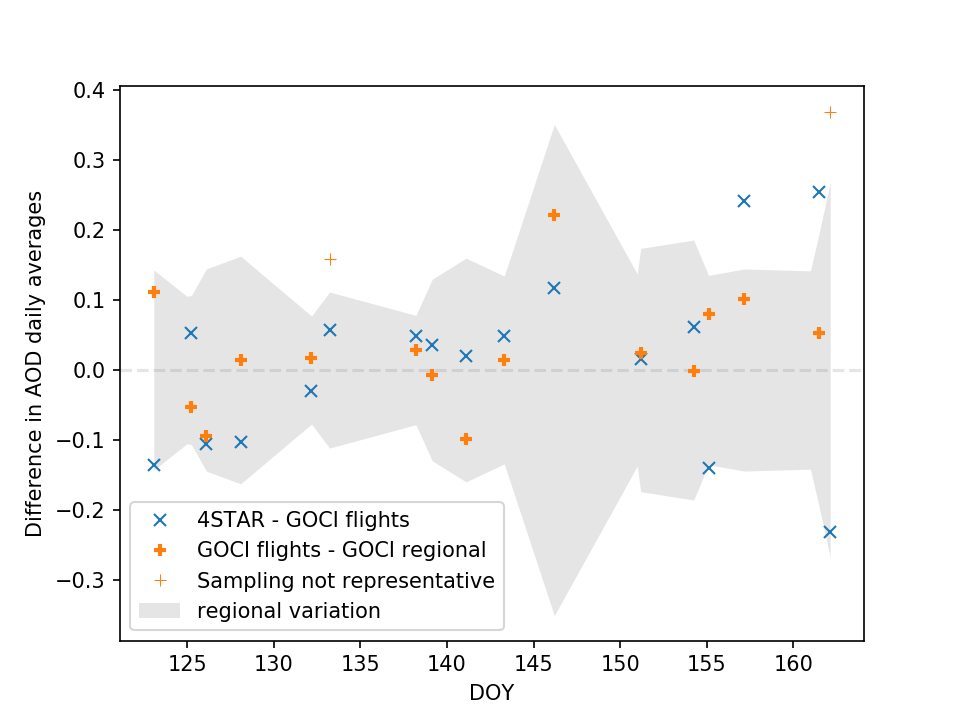

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


In [71]:
istd = np.isfinite(gociar_time['std_aod_goci'])

plt.figure()
plt.plot(ar_time['doys'],ar_time['delta_aod_gociar'],'x',label='4STAR - GOCI flights')
iout = abs(gociar_time['delta_aod_goci'])>gociar_time['std_aod_goci']
plt.plot(ar_time['doys'][~iout],gociar_time['delta_aod_goci'][~iout],'+',label='GOCI flights - GOCI regional',mew=2)

plt.plot(ar_time['doys'][iout],gociar_time['delta_aod_goci'][iout],'+',c='tab:orange',mew=0.5,label='Sampling not representative')
plt.axhline(0,ls='--',c='grey',alpha=0.2,zorder=-10)
plt.fill_between(ar_time['doys'][istd],0.0-gociar_time['std_aod_goci'][istd],gociar_time['std_aod_goci'][istd],
                 color='grey',alpha=0.2,label='regional variation',lw=0.0)
plt.legend()
plt.xlabel('DOY')
plt.ylabel('Difference in AOD daily averages')
plt.savefig(fp+'plot/KORUS_GOCI_AOD_sampling_representative.png',dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_AOD_sampling_representative.pdf',dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_AOD_sampling_representative.eps',dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_AOD_sampling_representative.svg',dpi=600,transparent=True)

# Aerosol Vertical dependence

## AOD spectra by altitude (Section 4.3, Fig. 7)

In [86]:
ar['fl_8'] = ar['GPS_Alt']>8000
ar['fl_2_8'] = (ar['GPS_Alt']<=8000) & (ar['GPS_Alt']>2000) & ar['fl_QA']
ar['fl_1.5_2'] = (ar['GPS_Alt']<=2000) & (ar['GPS_Alt']>1500) & ar['fl_QA']
ar['fl_1_1.5'] = (ar['GPS_Alt']<=1500) & (ar['GPS_Alt']>1000) & ar['fl_QA']
ar['fl_1_2'] = (ar['GPS_Alt']<=2000) & (ar['GPS_Alt']>1000) & ar['fl_QA']
ar['fl_0.5_1'] = (ar['GPS_Alt']<=1000) & (ar['GPS_Alt']>500) & ar['fl_QA']
ar['fl_0.5'] = (ar['GPS_Alt']<=500) & ar['fl_QA']
ar['fl_1.0'] = (ar['GPS_Alt']<=1000) & ar['fl_QA']

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less_equal
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less_equal
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less_equal
  after removing the cwd from sys

In [87]:
fls = {'fl':[],'fl_8':[],'fl_2_8':[],'fl_1_2':[],'fl_1.5_2':[],'fl_1_1.5':[],'fl_0.5_1':[],'fl_0.5':[]}
wvls = []
for i,a in enumerate(aod_names):
    wvls.append(ar[a]*0.0+wvl[i])
    for ff in fls.keys():
        fls[ff].append(ar[ff])
for ff in fls.keys():
    fls[ff] = np.array(fls[ff])
    fls[ff] = fls[ff].reshape(fls[ff].size)    
wvls = np.array(wvls)
wvlsn = wvls.reshape(wvls.size)

<IPython.core.display.Javascript object>


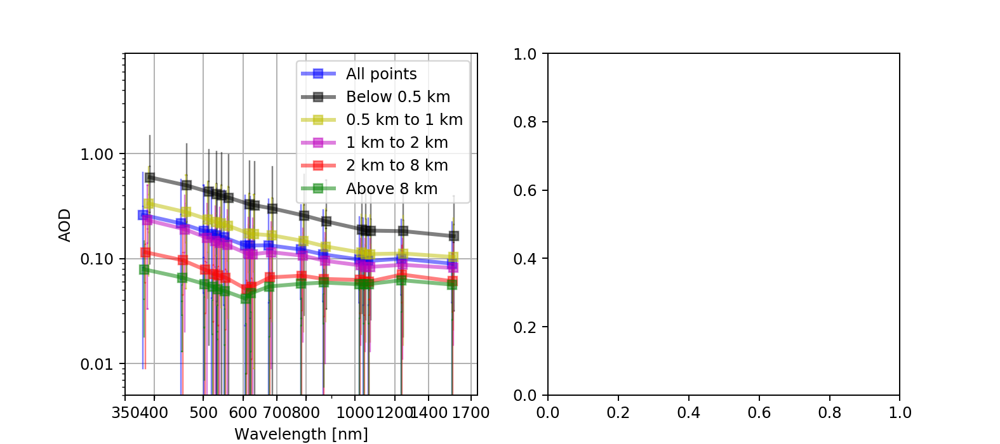

plotting_utils.py:614: RuntimeWarning: invalid value encountered in greater_equal
  val_fl = (val_lim>=c)&(val_lim<lims[i+1])
plotting_utils.py:614: RuntimeWarning: invalid value encountered in less
  val_fl = (val_lim>=c)&(val_lim<lims[i+1])


In [90]:
fig,ax = plt.subplots(1,2,figsize=(9,4))
ax[0].plot(wvlsn[fls['fl_0.5']],arsn[fls['fl_0.5']],'.',alpha=0)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
#ax[0].xticks([350,400,500,600,700,800,900,1000,1200,1400,1700])
#ax[0].set_xlim(350,1700)
#ax[0].set_ylim([0.005,8.0])

aod_mean = {}

aod_mean['all'] = pu.make_boxplot(arsn[fls['fl']],wvlsn[fls['fl']],wvl_bins,wvl,y=1,alpha=0.5,
                                  label='All points',fliers_off=True,color='b',ax=ax[0])
aod_mean['05'] = pu.make_boxplot(arsn[fls['fl_0.5']],wvlsn[fls['fl_0.5']],wvl_bins,wvl+12,y=1,alpha=0.5,
                label='Below 0.5 km',fliers_off=True,color='k',ax=ax[0])
aod_mean['05_1'] = pu.make_boxplot(arsn[fls['fl_0.5_1']],wvlsn[fls['fl_0.5_1']],wvl_bins,wvl+10,y=1,alpha=0.5,
                label='0.5 km to 1 km',fliers_off=True,color='y',ax=ax[0])
aod_mean['1_2'] = pu.make_boxplot(arsn[fls['fl_1_1.5']],wvlsn[fls['fl_1_1.5']],wvl_bins,wvl+8,y=1,alpha=0.5,
                label='1 km to 2 km',fliers_off=True,color='m',ax=ax[0])
#aod_mean['15_2'] = pu.make_boxplot(arsn[fls['fl_1.5_2']],wvlsn[fls['fl_1.5_2']],wvl_bins,wvl+6,y=1,alpha=0.5,
#                label='1.5 km to 2 km',fliers_off=True,color='c',ax=ax[0])
aod_mean['2_8'] = pu.make_boxplot(arsn[fls['fl_2_8']],wvlsn[fls['fl_2_8']],wvl_bins,wvl+4,y=1,alpha=0.5,
                label='2 km to 8 km',fliers_off=True,color='r',ax=ax[0])
aod_mean['8'] = pu.make_boxplot(arsn[fls['fl_8']],wvlsn[fls['fl_8']],wvl_bins,wvl+2,y=1,alpha=0.5,
                                  label='Above 8 km',fliers_off=True,color='g',ax=ax[0])

ax[0].legend(frameon=True, loc=1)
ax[0].set_xticks([350,400,500,600,700,800,1000,1200,1400,1700])
ax[0].xaxis.set_major_formatter(ScalarFormatter())
ax[0].yaxis.set_major_formatter(ScalarFormatter())
ax[0].xaxis.set_minor_formatter(FormatStrFormatter(''))
ax[0].set_xlim(350,1750)
ax[0].set_ylim([0.005,9.0])
ax[0].set_xlabel('Wavelength [nm]')
ax[0].set_ylabel('AOD')
ax[0].grid()


In [91]:
ae_mean = {}
[ae_mean['all'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['all'][1:-5]))
[ae_mean['05'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['05'][1:-5]))
[ae_mean['05_1'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['05_1'][1:-5]))
#[ae_mean['1_15'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['1_15'][1:-5]))
[ae_mean['1_2'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['1_2'][1:-5]))
#[ae_mean['15_2'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['15_2'][1:-5]))
[ae_mean['2_8'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['2_8'][1:-5]))
[ae_mean['8'],nul],cm = linfit(np.log10(wvl[1:-5]),-np.log10(aod_mean['8'][1:-5]))

In [92]:
n,bins,p = plt.hist(ar['GPS_Alt'][ar['fl']],bins=30,range=(0,10000))
pos = np.array([(bins[i]+bins[i+1])/2.0 for i,b in enumerate(bins[:-1])])

/home/sam/.local/lib/python2.7/site-packages/numpy/lib/histograms.py:824: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/histograms.py:825: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


<IPython.core.display.Javascript object>


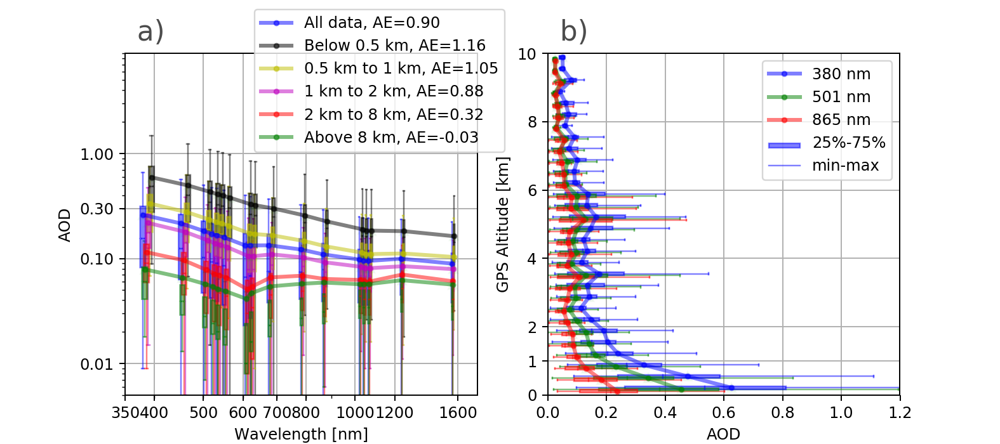

In [160]:
fig,ax = plt.subplots(1,2,figsize=(9,4))
ax[0].plot(wvlsn[fls['fl_0.5']][0:10],arsn[fls['fl_0.5']][0:10],'.',alpha=0)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
we = 10
pu.make_boxplot(arsn[fls['fl']],wvlsn[fls['fl']],wvl_bins,wvl,y=1,alpha=0.5,widths=we,patch_artist=True,
                label='All data, AE={:1.2f}'.format(ae_mean['all']),fliers_off=True,color='b',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_0.5']],wvlsn[fls['fl_0.5']],wvl_bins,wvl+15,y=1,alpha=0.5,
                label='Below 0.5 km, AE={:1.2f}'.format(ae_mean['05']),widths=we,patch_artist=True,
                fliers_off=True,color='k',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_0.5_1']],wvlsn[fls['fl_0.5_1']],wvl_bins,wvl+12,y=1,alpha=0.5,
                label='0.5 km to 1 km, AE={:1.2f}'.format(ae_mean['05_1']),widths=we,patch_artist=True,
                fliers_off=True,color='y',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_1_2']],wvlsn[fls['fl_1_2']],wvl_bins,wvl+9,y=1,alpha=0.5,
                label='1 km to 2 km, AE={:1.2f}'.format(ae_mean['1_2']),widths=we,patch_artist=True,
                fliers_off=True,color='m',ax=ax[0],mean_marker='.')
#pu.make_boxplot(arsn[fls['fl_1.5_2']],wvlsn[fls['fl_1.5_2']],wvl_bins,wvl+6,y=1,alpha=0.5,
#                label='1.5 km to 2 km, AE={:1.2f}'.format(ae_mean['15_2']),
#                fliers_off=True,color='c',ax=ax[0])
pu.make_boxplot(arsn[fls['fl_2_8']],wvlsn[fls['fl_2_8']],wvl_bins,wvl+6,y=1,alpha=0.5,
                label='2 km to 8 km, AE={:1.2f}'.format(ae_mean['2_8']),widths=we,patch_artist=True,
                fliers_off=True,color='r',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_8']],wvlsn[fls['fl_8']],wvl_bins,wvl+3,y=1,alpha=0.5,widths=we,patch_artist=True,
                label='Above 8 km, AE={:1.2f}'.format(ae_mean['8']),fliers_off=True,color='g',ax=ax[0],mean_marker='.')

ax[0].legend(frameon=True, loc=1,bbox_to_anchor=(1.1,1.15))
ax[0].set_xticks([350,400,500,600,700,800,1000,1200,1600])
ax[0].xaxis.set_major_formatter(ScalarFormatter())
ax[0].yaxis.set_major_formatter(ScalarFormatter())
ax[0].xaxis.set_minor_formatter(FormatStrFormatter(''))
ax[0].set_xlim(350,1750)
ax[0].set_ylim([0.005,9.0])
ax[0].set_yticks([0.01,0.1,0.3,1.0])
ax[0].set_xlabel('Wavelength [nm]')
ax[0].set_ylabel('AOD')
ax[0].grid()



ax[1].plot(ar['AOD0501'][ar['fl']][0:10],ar['GPS_Alt'][ar['fl']][0:10],'.',alpha=0.0,color='w')
wed = 90
maodp,bpaod = pu.make_boxplot(ar['AOD0380'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos+50.0,widths=wed,
                             patch_artist=True,return_bp=True,
                color='blue',alpha=0.5,y=0,vert=False,label='380 nm',fliers_off=True,ax=ax[1],mean_marker='.')
pu.make_boxplot(ar['AOD0501'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos,widths=wed,patch_artist=True,
                color='green',alpha=0.5,y=0,vert=False,label='501 nm',fliers_off=True,ax=ax[1],mean_marker='.')
pu.make_boxplot(ar['AOD0865'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos-50.0,widths=wed,patch_artist=True,
                color='red',alpha=0.5,y=0,vert=False,label='865 nm',fliers_off=True,ax=ax[1],mean_marker='.')
lg_op = ax[1].legend(frameon=True)
hand,lglbl = lg_op.axes.get_legend_handles_labels()
hand.append(bpaod['boxes'][0])
hand.append(bpaod['whiskers'][0])
lglbl.append('25%-75%')
lglbl.append('min-max')
lg_op._legend_box = None
lg_op._init_legend_box(hand, lglbl)
lg_op._set_loc(lg_op._loc)
lg_op.set_title(lg_op.get_title().get_text())

lg_oph = lg_op.legendHandles
lg_oph[3].set_height(3)

ax[1].set_xlim(0,1.2)
ax[1].set_ylim(0,10000)
ax[1].set_yticks([0,1000,2000,4000,6000,8000,10000])
ax[1].set_yticklabels([0,1,2,4,6,8,10])
ax[1].set_xlabel('AOD')
ax[1].set_ylabel('GPS Altitude [km]')
#ax[1].yaxis.set_major_formatter(ScalarFormatter())
ax[1].yaxis.set_minor_formatter(FormatStrFormatter(''))
#plt.title('KORUS-AQ average AOD profile from 4STAR')
ax[1].grid()

pu.sub_note('a)',ax[0],out=True)
pu.sub_note('b)',ax[1],out=True)

plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.png'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.pdf'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.eps'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.svg'.format(vv),dpi=600,transparent=True)


In [93]:
len(arsn[fls['fl_0.5']])/17.0, len(arsn[fls['fl_0.5_1']])/17.0,len(arsn[fls['fl_1_2']])/17.0,\
len(arsn[fls['fl_2_8']])/17.0,len(arsn[fls['fl_8']])/17.0

(64736.0, 41821.0, 63130.0, 121569.0, 31076.0)

<IPython.core.display.Javascript object>


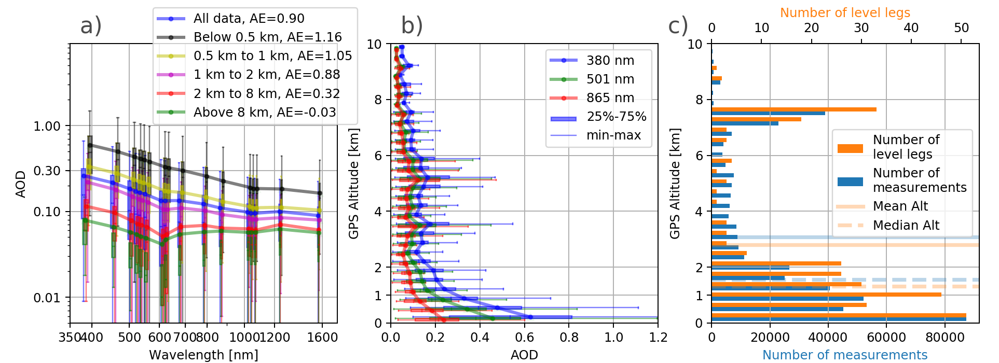

In [137]:
fig,ax = plt.subplots(1,3,figsize=(11,4))
ax[0].plot(wvlsn[fls['fl_0.5']][0:10],arsn[fls['fl_0.5']][0:10],'.',alpha=0)
ax[0].set_yscale('log')
ax[0].set_xscale('log')
we = 10
pu.make_boxplot(arsn[fls['fl']],wvlsn[fls['fl']],wvl_bins,wvl,y=1,alpha=0.5,widths=we,patch_artist=True,
                label='All data, AE={:1.2f}'.format(ae_mean['all']),fliers_off=True,color='b',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_0.5']],wvlsn[fls['fl_0.5']],wvl_bins,wvl+15,y=1,alpha=0.5,
                label='Below 0.5 km, AE={:1.2f}'.format(ae_mean['05']),widths=we,patch_artist=True,
                fliers_off=True,color='k',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_0.5_1']],wvlsn[fls['fl_0.5_1']],wvl_bins,wvl+12,y=1,alpha=0.5,
                label='0.5 km to 1 km, AE={:1.2f}'.format(ae_mean['05_1']),widths=we,patch_artist=True,
                fliers_off=True,color='y',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_1_2']],wvlsn[fls['fl_1_2']],wvl_bins,wvl+9,y=1,alpha=0.5,
                label='1 km to 2 km, AE={:1.2f}'.format(ae_mean['1_2']),widths=we,patch_artist=True,
                fliers_off=True,color='m',ax=ax[0],mean_marker='.')
#pu.make_boxplot(arsn[fls['fl_1.5_2']],wvlsn[fls['fl_1.5_2']],wvl_bins,wvl+6,y=1,alpha=0.5,
#                label='1.5 km to 2 km, AE={:1.2f}'.format(ae_mean['15_2']),
#                fliers_off=True,color='c',ax=ax[0])
pu.make_boxplot(arsn[fls['fl_2_8']],wvlsn[fls['fl_2_8']],wvl_bins,wvl+6,y=1,alpha=0.5,
                label='2 km to 8 km, AE={:1.2f}'.format(ae_mean['2_8']),widths=we,patch_artist=True,
                fliers_off=True,color='r',ax=ax[0],mean_marker='.')
pu.make_boxplot(arsn[fls['fl_8']],wvlsn[fls['fl_8']],wvl_bins,wvl+3,y=1,alpha=0.5,widths=we,patch_artist=True,
                label='Above 8 km, AE={:1.2f}'.format(ae_mean['8']),fliers_off=True,color='g',ax=ax[0],mean_marker='.')

ax[0].legend(frameon=True, loc=1,bbox_to_anchor=(1.1,1.15))
ax[0].set_xticks([350,400,500,600,700,800,1000,1200,1600])
ax[0].xaxis.set_major_formatter(ScalarFormatter())
ax[0].yaxis.set_major_formatter(ScalarFormatter())
ax[0].xaxis.set_minor_formatter(FormatStrFormatter(''))
ax[0].set_xlim(350,1750)
ax[0].set_ylim([0.005,9.0])
ax[0].set_yticks([0.01,0.1,0.3,1.0])
ax[0].set_xlabel('Wavelength [nm]')
ax[0].set_ylabel('AOD')
ax[0].grid()

ax[1].plot(ar['AOD0501'][ar['fl']][0:10],ar['GPS_Alt'][ar['fl']][0:10],'.',alpha=0.0,color='w')
wed = 90
maodp,bpaod = pu.make_boxplot(ar['AOD0380'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos+50.0,widths=wed,
                             patch_artist=True,return_bp=True,
                color='blue',alpha=0.5,y=0,vert=False,label='380 nm',fliers_off=True,ax=ax[1],mean_marker='.')
pu.make_boxplot(ar['AOD0501'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos,widths=wed,patch_artist=True,
                color='green',alpha=0.5,y=0,vert=False,label='501 nm',fliers_off=True,ax=ax[1],mean_marker='.')
pu.make_boxplot(ar['AOD0865'][ar['fl']],ar['GPS_Alt'][ar['fl']],bins,pos-50.0,widths=wed,patch_artist=True,
                color='red',alpha=0.5,y=0,vert=False,label='865 nm',fliers_off=True,ax=ax[1],mean_marker='.')
lg_op = ax[1].legend(frameon=True)
hand,lglbl = lg_op.axes.get_legend_handles_labels()
hand.append(bpaod['boxes'][0])
hand.append(bpaod['whiskers'][0])
lglbl.append('25%-75%')
lglbl.append('min-max')
lg_op._legend_box = None
lg_op._init_legend_box(hand, lglbl)
lg_op._set_loc(lg_op._loc)
lg_op.set_title(lg_op.get_title().get_text())

lg_oph = lg_op.legendHandles
lg_oph[3].set_height(3)

ax[1].set_xlim(0,1.2)
ax[1].set_ylim(0,10000)
ax[1].set_yticks([0,1000,2000,4000,6000,8000,10000])
ax[1].set_yticklabels([0,1,2,4,6,8,10])
ax[1].set_xlabel('AOD')
ax[1].set_ylabel('GPS Altitude [km]')
#ax[1].yaxis.set_major_formatter(ScalarFormatter())
ax[1].yaxis.set_minor_formatter(FormatStrFormatter(''))
#plt.title('KORUS-AQ average AOD profile from 4STAR')
ax[1].grid()

ax[2].hist([ar['GPS_Alt'],np.array(alts)],bins=30,label=['Number of \nmeasurements','Number of \nlevel legs'],
           orientation='horizontal',color=['tab:blue','tab:orange'])
ax[2].axhline(np.nanmean(ar['GPS_Alt']),color='tab:blue',lw=3,alpha=0.3,label='Mean Alt')
ax[2].axhline(np.nanmedian(ar['GPS_Alt']),color='tab:blue',ls='--',lw=3,alpha=0.3,label='Median Alt')
ax[2].grid()
ax[2].set_xlabel('Number of measurements',color='tab:blue')
ax[2].set_ylabel('GPS Altitude [km]')
ax[2].set_ylim(0,10000)
ax[2].set_yticks([0,1000,2000,4000,6000,8000,10000])
ax[2].set_yticklabels([0,1,2,4,6,8,10])


axy = ax[2].twiny()
axy.hist([[],np.array(alts)],bins=30,label=['Number of \nmeasurements','Number of \nlevel legs'],
           orientation='horizontal',color=['tab:blue','tab:orange'])
axy.axhline(np.nanmean(alts),color='tab:orange',lw=3,alpha=0.3,label='Mean Alt')
axy.axhline(np.nanmedian(alts),color='tab:orange',ls='--',lw=3,alpha=0.3,label='Median Alt')

axy.set_xlabel('Number of level legs',color='tab:orange')

#axy.legend(frameon=True)
handles, labels = axy.get_legend_handles_labels()
order = [3,2,0,1]
axy.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

pu.sub_note('a)',ax[0],out=True)
pu.sub_note('b)',ax[1],out=True)
pu.sub_note('c)',ax[2],out=True,dx=-0.2)
fig.subplots_adjust(left=0.07, bottom=None, right=0.98, top=None, wspace=None, hspace=None)

plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.png'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.pdf'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.eps'.format(vv),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_AOD_wvl_by_alt_{}_rev.svg'.format(vv),dpi=600,transparent=True)


## Analyse the Fine mode fraction

In [72]:
ar['fl_QA_low'] = ar['fl_QA'] & (ar['GPS_Alt']<500.0)
ar['fl_QA_mid'] = ar['fl_QA'] & (ar['GPS_Alt']>2000.0) & (ar['GPS_Alt']<5000.0) 


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  


In [79]:
ar['fl_QA_fmf'] = ar['fl_QA'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc']))

In [82]:
bfaod,baltf,bnumf,bndaysf = make_bined_alt(fmf['tauf'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)
bcaod,baltc,bnumc,bndaysc = make_bined_alt(fmf['tauc'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)
beta,balte,bnume,bndayse = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)

11123.0 123.58888888888889
11123.0 123.58888888888889
11123.0 123.58888888888889


In [83]:
blat,baltl,bnuml,bndaysl = make_bined_alt(ar['Latitude'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)
blon,baltlo,bnumlo,bndayslo = make_bined_alt(ar['Longitude'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)

11123.0 123.58888888888889
11123.0 123.58888888888889


In [84]:
blats = [np.nanmedian(ll) for ll in blat]
blons = [np.nanmedian(ll) for ll in blon]

### Plot the histogram distribution of the fine mode fraction (Section 4.3, Fig. 8)

<IPython.core.display.Javascript object>


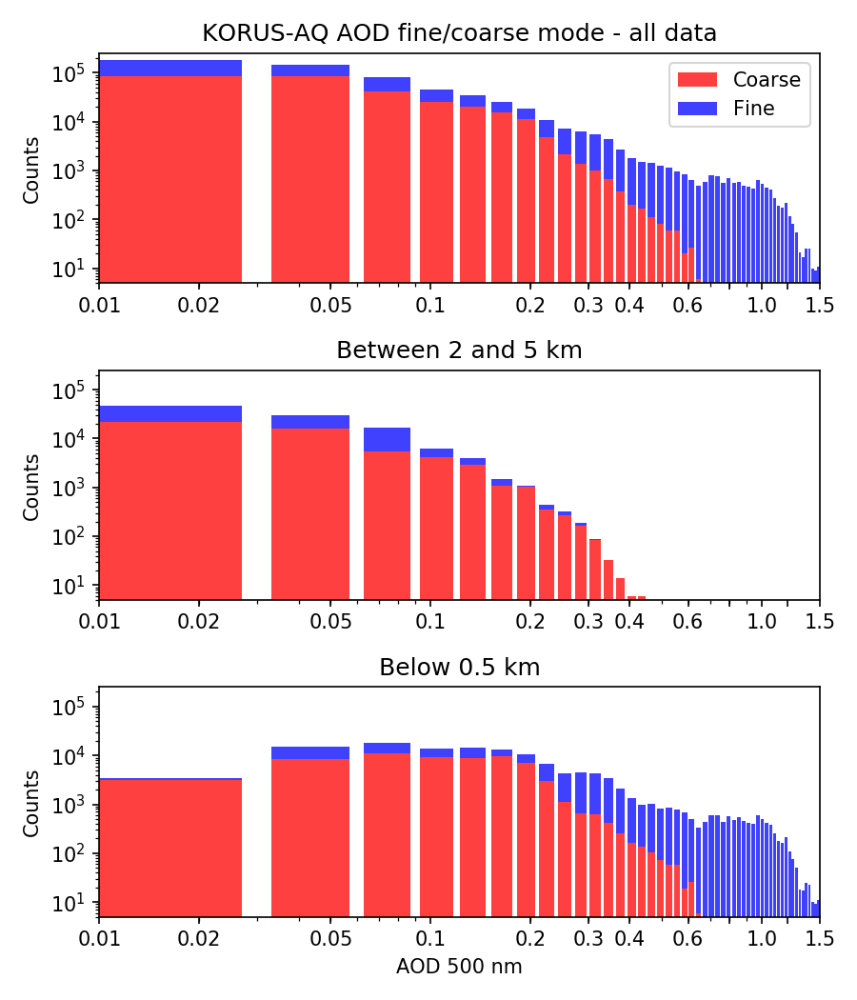

In [88]:
plt.figure(figsize=(6,7))
ax1 = plt.subplot(3,1,1)
plt.hist([fmf['tauc'][ar['fl_QA']],fmf['tauf'][ar['fl_QA']]],color=['r','b'],histtype='bar',
            bins=50,range=[0.0,1.5],label=['Coarse','Fine'],edgecolor='None',
         alpha=0.75,normed=False,stacked=True,rwidth = 0.8)
plt.legend(frameon=True,loc=1)
plt.title('KORUS-AQ AOD fine/coarse mode - all data')
#plt.xlabel('AOD 500 nm')
plt.ylabel('Counts')
plt.yscale('log'),plt.xscale('log')
plt.ylim(5,250000),plt.xlim(0.01,1.5)
plt.xticks([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,0.8,1.0,1.2,1.5])
ax1.set_xticklabels([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,'',1.0,'',1.5])

ax2 = plt.subplot(3,1,2,sharex=ax1)
plt.hist([fmf['tauc'][ar['fl_QA_mid']],fmf['tauf'][ar['fl_QA_mid']]],color=['r','b'],histtype='bar',
            bins=50,range=[0.0,1.5],label=['Coarse','Fine'],edgecolor='None',
         alpha=0.75,normed=False,stacked=True,rwidth = 0.8)
#plt.legend(frameon=False)
plt.title('Between 2 and 5 km')
plt.ylabel('Counts')
plt.yscale('log'),plt.xscale('log')
plt.ylim(5,250000),plt.xlim(0.01,1.5)
plt.xticks([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,0.8,1.0,1.2,1.5])
ax2.set_xticklabels([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,'',1.0,'',1.5])

ax3 = plt.subplot(3,1,3,sharex=ax2)
plt.hist([fmf['tauc'][ar['fl_QA_low']],fmf['tauf'][ar['fl_QA_low']]],color=['r','b'],histtype='bar',
            bins=50,range=[0.0,1.5],label=['Coarse','Fine'],edgecolor='None',
         alpha=0.75,normed=False,stacked=True,rwidth = 0.8)
#plt.legend(frameon=False)
plt.title('Below 0.5 km')
#plt.xlabel('AOD 500 nm')
plt.ylabel('Counts')
plt.yscale('log'),plt.xscale('log')
plt.ylim(5,250000),plt.xlim(0.01,1.5)
plt.xlabel('AOD 500 nm')
plt.xticks([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,0.8,1.0,1.2,1.5])
ax3.set_xticklabels([0.01,0.02,0.05,0.1,0.2,0.3,0.4,0.6,'',1.0,'',1.5])

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_hist.png',transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_hist.pdf',transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_hist.eps',transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_hist.svg',transparent=True,dpi=500)

### Plot the vertical dependence of the fine mode fraction

<IPython.core.display.Javascript object>


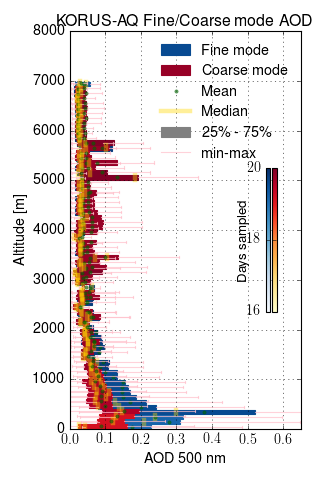

In [110]:
plt.figure(figsize=(4,6))
bp =plt.boxplot(bfaod,positions=np.array(baltf)-5.0,vert=False,
                showfliers=False,widths=90,showmeans=True,patch_artist=True)
plt.xlabel('AOD 500 nm')
plt.ylabel('Altitude [m]')
bl = plt.cm.YlOrRd
gr = plt.cm.Blues
pu.set_box_whisker_color(gr,bp,bndaysf)
    
bpc =plt.boxplot(bcaod,positions=np.array(baltc)+10.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(bl,bpc,bndaysc)
bpc['boxes'][-1].set_color('grey')

ax = plt.gca()
plt.title('KORUS-AQ Fine/Coarse mode AOD')
plt.ylim(0,8000)
plt.yticks([0,1000,2000,3000,4000,5000,6000,7000,8000])
ax.set_yticklabels([0,1000,2000,3000,4000,5000,6000,7000,8000])
plt.xlim(0.0,0.65)
plt.grid()
plt.legend([bp['boxes'][5],bpc['boxes'][18],bpc['means'][0],bpc['medians'][0],bpc['boxes'][-1],bpc['whiskers'][0]],
           ['Fine mode','Coarse mode','Mean','Median','25\% - 75\%','min-max'],
           frameon=False,loc=1,numpoints=1)

scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
scalarmapgr.set_array(bndaysf)
scalarmapbl = plt.cm.ScalarMappable(cmap=bl)
scalarmapbl.set_array(bndaysc)
cbaxesgr = plt.gcf().add_axes([0.83, 0.35, 0.015, 0.3])
cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr)
cbaxesbl = plt.gcf().add_axes([0.85, 0.35, 0.015, 0.3])
cbb = plt.colorbar(scalarmapbl,cax=cbaxesbl)
cbg.set_ticks([0,6,12,16,18,20])
cbb.set_ticks([0,6,12,16,18,20]),cbb.set_ticklabels(['','','','',''])
cbaxesgr.yaxis.set_ticks_position('left'),cbaxesbl.yaxis.set_ticks_position('left')
cbaxesgr.text(-6.0,0.5,'Days sampled',rotation=90,verticalalignment='center')

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_AOD_vertical.png',
            transparent=True,dpi=500)

In [56]:
blats[0]=36.2

In [57]:
bndm = np.nanmax(blats)*1.0
bndm

37.594356000000005

In [ ]:
cl = gr
for j,q in enumerate(blats):
    print j, q, cl(blats[j]*1.0/bndm)

<IPython.core.display.Javascript object>


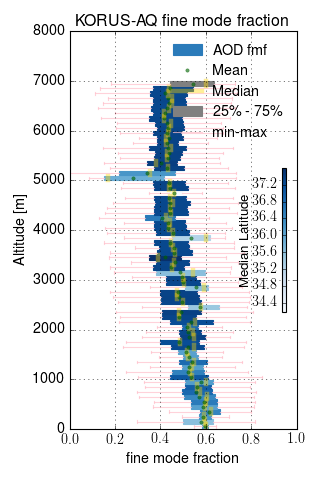

In [111]:
plt.figure(figsize=(4,6))
bp =plt.boxplot(beta,positions=np.array(balte),vert=False,
                showfliers=False,widths=90,showmeans=True,patch_artist=True)
plt.xlabel('fine mode fraction')
plt.ylabel('Altitude [m]')
bl = plt.cm.YlOrRd
gr = plt.cm.Blues
pu.set_box_whisker_color(gr,bp,blats,color_not_start_at_zero=True)
    
#bpc =plt.boxplot(bcaod,positions=np.array(baltc)+10.0,vert=False,
#                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
#pu.set_box_whisker_color(bl,bpc,bndaysc)
bp['boxes'][-1].set_color('grey')

ax = plt.gca()
plt.title('KORUS-AQ fine mode fraction')
plt.ylim(0,8000)
plt.yticks([0,1000,2000,3000,4000,5000,6000,7000,8000])
ax.set_yticklabels([0,1000,2000,3000,4000,5000,6000,7000,8000])
plt.xlim(0.0,1.0)
plt.grid()
plt.legend([bp['boxes'][5],bp['means'][5],bp['medians'][5],bp['boxes'][-1],bp['whiskers'][5]],
           ['AOD fmf','Mean','Median','25\% - 75\%','min-max'],
           frameon=False,loc=1,numpoints=1)

scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
scalarmapgr.set_array(blats)
#scalarmapbl = plt.cm.ScalarMappable(cmap=bl)
#scalarmapbl.set_array(bndays)
cbaxesgr = plt.gcf().add_axes([0.88, 0.35, 0.015, 0.3])
cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr)
#cbaxesbl = plt.gcf().add_axes([0.85, 0.35, 0.015, 0.3])
#cbb = plt.colorbar(scalarmapbl,cax=cbaxesbl)
#cbg.set_ticks([0,6,12,15,18])
#cbb.set_ticks([0,6,12,15,18]),cbb.set_ticklabels(['','','','',''])
cbaxesgr.yaxis.set_ticks_position('left')#,cbaxesbl.yaxis.set_ticks_position('left')
cbaxesgr.text(-9.0,0.5,'Median Latitude',rotation=90,verticalalignment='center')

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_fine_mode_AOD_vertical.png',
            transparent=True,dpi=500)

### Split fmf for met

In [402]:
ar['fl_QA_fmf'] = ar['fl_QA'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc']))
ar['fl_QA_fmf_met1'] = ar['fl'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc'])) & (ar['doys']> t1[0]) & (ar['doys']< t1[1])
ar['fl_QA_fmf_met2'] = ar['fl'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc'])) & (ar['doys']> t2[0]) & (ar['doys']< t2[1])
ar['fl_QA_fmf_met3'] = ar['fl'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc'])) & (ar['doys']> t3[0]) & (ar['doys']< t3[1])
ar['fl_QA_fmf_met4'] = ar['fl'] & (np.isfinite(fmf['tauf'])) & (np.isfinite(fmf['tauc'])) & (ar['doys']> t4[0]) & (ar['doys']< t4[1])

In [405]:
beta,balte,bnume,bndayse = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf'],n=90)
beta1,balte1,bnume1,bndayse1 = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf_met1'],n=90)
beta2,balte2,bnume2,bndayse2 = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf_met2'],n=90)
beta3,balte3,bnume3,bndayse3 = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf_met3'],n=90)
beta4,balte4,bnume4,bndayse4 = make_bined_alt(fmf['eta'],ar['GPS_Alt'],ar['days'],ar['fl_QA_fmf_met4'],n=90)

11123.0 123.58888888888889
8871.5 98.57222222222222
7695.5 85.50555555555556
7734.2 85.93555555555555
7580.0 84.22222222222223


In [415]:
bndayse1[0] = 9
bndayse2[0] = 9
bndayse3[0] = 9
bndayse4[0] = 9
bndayse[0] = 9

<IPython.core.display.Javascript object>


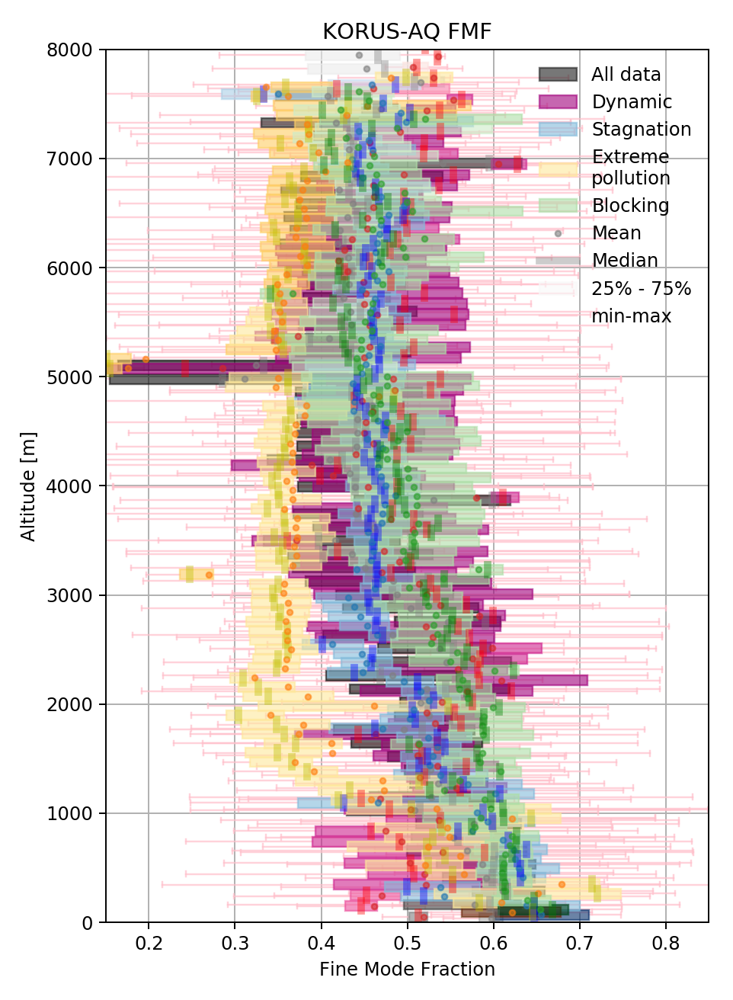

In [418]:
plt.figure(figsize=(5.5,7.5))
bp =plt.boxplot(beta,positions=np.array(balte)-25.0,vert=False,
                showfliers=False,widths=90,showmeans=True,patch_artist=True)
plt.xlabel('Fine Mode Fraction')
plt.ylabel('Altitude [m]')

rd = plt.cm.RdPu
bl = plt.cm.Blues
og = plt.cm.YlOrBr
gr = plt.cm.Greens
k = plt.cm.Greys

pu.set_box_whisker_color(k,bp,bndayse,mean_color='grey',median_color='grey',face_alpha=0.6)
    
bp1 = plt.boxplot(beta1,positions=np.array(balte1)+00.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(rd,bp1,bndayse1,mean_color='tab:red',median_color='r',face_alpha=0.6)
bp1['boxes'][0].set_color('grey')
bp2 = plt.boxplot(beta2,positions=np.array(balte2)+25.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(bl,bp2,bndayse2,mean_color='tab:blue',median_color='b',face_alpha=0.6)
bp3 = plt.boxplot(beta3,positions=np.array(balte3)+50.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(og,bp3,bndayse3,mean_color='tab:orange',median_color='y',face_alpha=0.6)
bp4 = plt.boxplot(beta4,positions=np.array(balte4)+75.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(gr,bp4,bndayse4,mean_color='tab:green',median_color='g',face_alpha=0.6)

ax = plt.gca()
plt.title('KORUS-AQ FMF')
plt.ylim(0,8000)
plt.yticks([0,1000,2000,3000,4000,5000,6000,7000,8000])
ax.set_yticklabels([0,1000,2000,3000,4000,5000,6000,7000,8000])
plt.xlim(0.15,0.85)
plt.grid()
plt.legend([bp['boxes'][5],bp1['boxes'][15],bp2['boxes'][16],bp3['boxes'][7],bp4['boxes'][-4],
            bp['means'][0],bp['medians'][0],bp['boxes'][-2],bp['whiskers'][0]],
           ['All data','Dynamic','Stagnation','Extreme\npollution','Blocking','Mean','Median','25% - 75%','min-max'],
           frameon=False,loc=1,numpoints=1)

if False:
    scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
    scalarmapgr.set_array(bndays)
    scalarmapbl = plt.cm.ScalarMappable(cmap=bl)
    scalarmapbl.set_array(bndays)
    scalarmapk = plt.cm.ScalarMappable(cmap=k)
    scalarmapk.set_array(bndays)
    scalarmaprd = plt.cm.ScalarMappable(cmap=rd)
    scalarmaprd.set_array(bndays)
    scalarmapog = plt.cm.ScalarMappable(cmap=og)
    scalarmapog.set_array(bndays)
    cbaxesgr = plt.gcf().add_axes([0.83, 0.15, 0.015, 0.3])
    cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr)
    cbaxesbl = plt.gcf().add_axes([0.87, 0.15, 0.015, 0.3])
    cbb = plt.colorbar(scalarmapbl,cax=cbaxesbl)
    cbaxesk = plt.gcf().add_axes([0.91, 0.15, 0.015, 0.3])
    cbk = plt.colorbar(scalarmapk,cax=cbaxesk)
    cbaxesog = plt.gcf().add_axes([0.85, 0.15, 0.015, 0.3])
    cbo = plt.colorbar(scalarmapog,cax=cbaxesog)
    cbaxesrd = plt.gcf().add_axes([0.89, 0.15, 0.015, 0.3])
    cbr = plt.colorbar(scalarmaprd,cax=cbaxesrd)
    cbg.set_ticks([0,3,6,9,12,15,18])
    cbb.set_ticks([0,3,6,9,12,15,18]),cbb.set_ticklabels(['','','','','',''])
    cbk.set_ticks([0,3,6,9,12,15,18]),cbk.set_ticklabels(['','','','','',''])
    cbo.set_ticks([0,3,6,9,12,15,18]),cbo.set_ticklabels(['','','','','',''])
    cbr.set_ticks([0,3,6,9,12,15,18]),cbr.set_ticklabels(['','','','','',''])
    cbaxesgr.yaxis.set_ticks_position('left'),cbaxesbl.yaxis.set_ticks_position('left')
    cbaxesgr.text(-6.0,0.5,'Days sampled',rotation=90,verticalalignment='center')

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_FMF_vertical_met_{}.png'.format(vv),
            transparent=True,dpi=500)
#plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.pdf'.format(vv),
#            transparent=True,dpi=500)
#plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.eps'.format(vv),
#            transparent=True,dpi=500)
#plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.svg'.format(vv),
#            transparent=True,dpi=500)

## Plotting of the angstrom vertical dependence

In [217]:
ar['fl_QA_angs'] = ar['fl'] & (ar['AOD0501']>0.05) 

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


### Plot vertical angstrom exponent over Seoul

In [90]:
ar['fl_QA_angs_seoul'] = ar['fl'] & (ar['AOD0501']>0.05) & (ar['Latitude']<37.75) &\
                        (ar['Latitude']>36.9) & (ar['Longitude']<127.30) & (ar['Longitude']>126.60)
any(ar['fl_QA_angs_seoul'])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


True

In [220]:
bang,balt,bnum,bndays = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs'],n=90)
bangs,balts,bnums,bndayss = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs_seoul'],n=90)

<IPython.core.display.Javascript object>


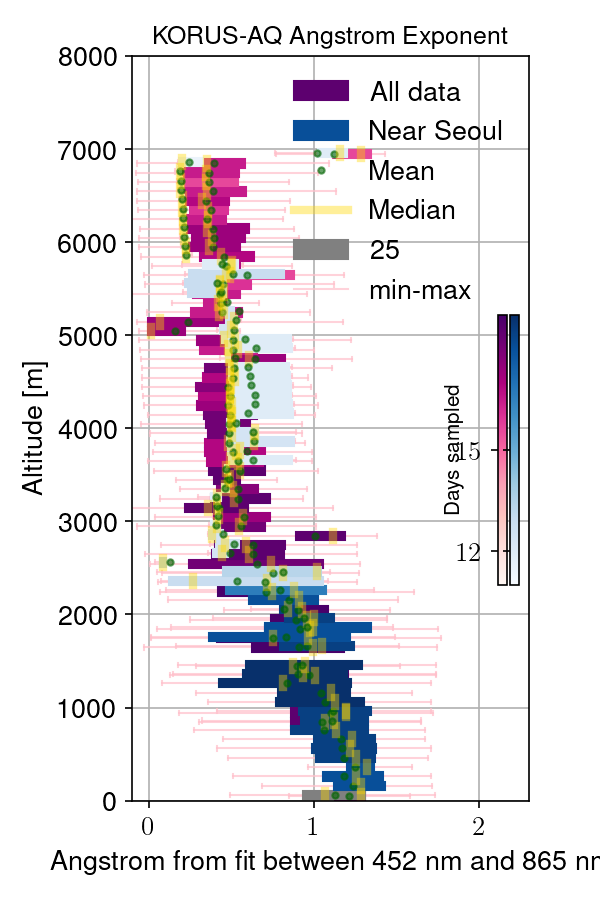

/home/sam/.local/lib/python2.7/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
/home/sam/.local/lib/python2.7/site-packages/matplotlib/cbook/__init__.py:1874: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
/home/sam/.local/lib/python2.7/site-packages/matplotlib/cbook/__init__.py:1881: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
/home/sam/.local/lib/python2.7/site-packages/matplotlib/cbook/__init__.py:1889: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
/home/sam/.local/lib/python2.7/site-packages/matplotlib/cbook/__init__.py:1890: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)
/home/sam/.local/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tigh

In [222]:
plt.figure(figsize=(4,6))
bp =plt.boxplot(bang,positions=np.array(balt)-5.0,vert=False,
                showfliers=False,widths=90,showmeans=True,patch_artist=True)
plt.xlabel('Angstrom from fit between 452 nm and 865 nm')
plt.ylabel('Altitude [m]')
gr = plt.cm.RdPu
bl = plt.cm.Blues
pu.set_box_whisker_color(gr,bp,bndays)
    
bpc =plt.boxplot(bangs,positions=np.array(balts)+10.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(bl,bpc,bndayss)
bpc['boxes'][0].set_color('grey')

ax = plt.gca()
plt.title('KORUS-AQ Angstrom Exponent')
plt.ylim(0,8000)
plt.yticks([0,1000,2000,3000,4000,5000,6000,7000,8000])
ax.set_yticklabels([0,1000,2000,3000,4000,5000,6000,7000,8000])
plt.xlim(-0.1,2.3)
plt.grid()
plt.legend([bp['boxes'][5],bpc['boxes'][18],bpc['means'][0],bpc['medians'][0],bpc['boxes'][0],bpc['whiskers'][0]],
           ['All data','Near Seoul','Mean','Median','25% - 75%','min-max'],
           frameon=False,loc=1,numpoints=1)

scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
scalarmapgr.set_array(bndays)
scalarmapbl = plt.cm.ScalarMappable(cmap=bl)
scalarmapbl.set_array(bndays)
cbaxesgr = plt.gcf().add_axes([0.83, 0.35, 0.015, 0.3])
cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr)
cbaxesbl = plt.gcf().add_axes([0.85, 0.35, 0.015, 0.3])
cbb = plt.colorbar(scalarmapbl,cax=cbaxesbl)
cbg.set_ticks([0,3,6,9,12,15])
cbb.set_ticks([0,3,6,9,12,15]),cbb.set_ticklabels(['','','','',''])
cbaxesgr.yaxis.set_ticks_position('left'),cbaxesbl.yaxis.set_ticks_position('left')
cbaxesgr.text(-6.0,0.5,'Days sampled',rotation=90,verticalalignment='center')

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical.png',
            transparent=True,dpi=500)

### Plot vertical angstrom exponent for different Met. regimes (Section 4.3, Fig. 9)

In [39]:
ar['fl_QA_angs'] = ar['fl'] & (ar['AOD0501']>0.05) 
ar['fl_QA_angs_met1'] = ar['fl'] & (ar['AOD0501']>0.05) & (ar['doys']> t1[0]) & (ar['doys']< t1[1])
ar['fl_QA_angs_met2'] = ar['fl'] & (ar['AOD0501']>0.05)  & (ar['doys']> t2[0]) & (ar['doys']< t2[1])
ar['fl_QA_angs_met3'] = ar['fl'] & (ar['AOD0501']>0.05)  & (ar['doys']> t3[0]) & (ar['doys']< t3[1])
ar['fl_QA_angs_met4'] = ar['fl'] & (ar['AOD0501']>0.05)  & (ar['doys']> t4[0]) & (ar['doys']< t4[1])

#ar['fl_QA_angs_seoul'] = ar['fl'] & (ar['AOD0501']>0.05) & (ar['Latitude']<37.75) &\
#                        (ar['Latitude']>36.9) & (ar['Longitude']<127.30) & (ar['Longitude']>126.60)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in greater
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in greater
  after removing the cwd from sys.path.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in greater
  """


In [40]:
bang,balt,bnum,bndays = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs'],n=30,rg=[0.0,8000.0])
bangm1,baltm1,bnumm1,bndaysm1 = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs_met1'],n=30,rg=[0.0,8000.0])
bangm2,baltm2,bnumm2,bndaysm2 = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs_met2'],n=30,rg=[0.0,8000.0])
bangm3,baltm3,bnumm3,bndaysm3 = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs_met3'],n=30,rg=[0.0,8000.0])
bangm4,baltm4,bnumm4,bndaysm4 = make_bined_alt(angs,ar['GPS_Alt'],ar['days'],ar['fl_QA_angs_met4'],n=30,rg=[0.0,8000.0])

9227.9 266.666666667
8867.3 266.666666667
7622.0 266.666666667
7668.0 266.666666667
7572.0 266.666666667


<IPython.core.display.Javascript object>


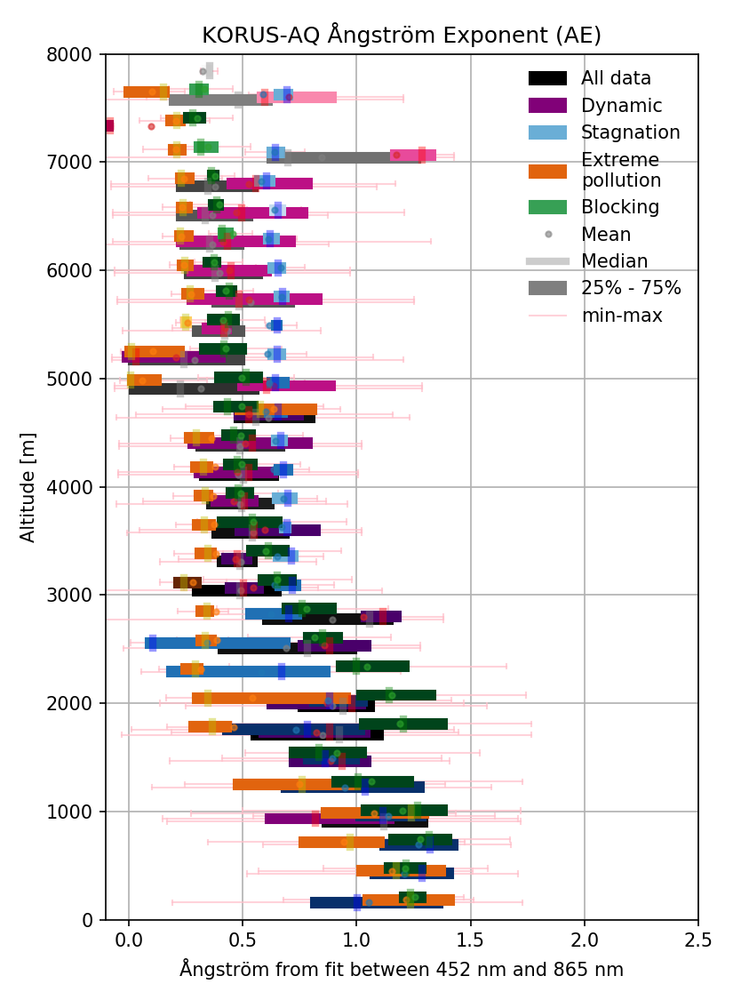

In [43]:
plt.figure(figsize=(5.5,7.5))
bp =plt.boxplot(bang,positions=np.array(balt)-25.0,vert=False,
                showfliers=False,widths=90,showmeans=True,patch_artist=True)
plt.xlabel(u'Ångström from fit between 452 nm and 865 nm')
plt.ylabel('Altitude [m]')

rd = plt.cm.RdPu
bl = plt.cm.Blues
og = plt.cm.YlOrBr
gr = plt.cm.Greens
k = plt.cm.Greys

pu.set_box_whisker_color(k,bp,bndays,mean_color='grey',median_color='grey')
    
bp1 = plt.boxplot(bangm1,positions=np.array(baltm1)+00.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(rd,bp1,bndaysm1,mean_color='tab:red',median_color='r')
bp1['boxes'][0].set_color('grey')
bp2 = plt.boxplot(bangm2,positions=np.array(baltm2)+25.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(bl,bp2,bndaysm2,mean_color='tab:blue',median_color='b')
bp3 = plt.boxplot(bangm3,positions=np.array(baltm3)+50.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(og,bp3,bndaysm3,mean_color='tab:orange',median_color='y')
bp4 = plt.boxplot(bangm4,positions=np.array(baltm4)+75.0,vert=False,
                 showfliers=False,widths=90,showmeans=True,patch_artist=True)
pu.set_box_whisker_color(gr,bp4,bndaysm4,mean_color='tab:green',median_color='g')

ax = plt.gca()
plt.title(u'KORUS-AQ Ångström Exponent (AE)')
plt.ylim(0,8000)
plt.yticks([0,1000,2000,3000,4000,5000,6000,7000,8000])
ax.set_yticklabels([0,1000,2000,3000,4000,5000,6000,7000,8000])
plt.xlim(-0.1,2.5)
plt.grid()
plt.legend([bp['boxes'][5],bp1['boxes'][15],bp2['boxes'][16],bp3['boxes'][7],bp4['boxes'][-4],
            bp['means'][0],bp['medians'][0],bp['boxes'][-2],bp['whiskers'][0]],
           ['All data','Dynamic','Stagnation','Extreme\npollution','Blocking','Mean','Median','25% - 75%','min-max'],
           frameon=False,loc=1,numpoints=1)

if False:
    scalarmapgr = plt.cm.ScalarMappable(cmap=gr)
    scalarmapgr.set_array(bndays)
    scalarmapbl = plt.cm.ScalarMappable(cmap=bl)
    scalarmapbl.set_array(bndays)
    scalarmapk = plt.cm.ScalarMappable(cmap=k)
    scalarmapk.set_array(bndays)
    scalarmaprd = plt.cm.ScalarMappable(cmap=rd)
    scalarmaprd.set_array(bndays)
    scalarmapog = plt.cm.ScalarMappable(cmap=og)
    scalarmapog.set_array(bndays)
    cbaxesgr = plt.gcf().add_axes([0.83, 0.15, 0.015, 0.3])
    cbg = plt.colorbar(scalarmapgr,cax=cbaxesgr)
    cbaxesbl = plt.gcf().add_axes([0.87, 0.15, 0.015, 0.3])
    cbb = plt.colorbar(scalarmapbl,cax=cbaxesbl)
    cbaxesk = plt.gcf().add_axes([0.91, 0.15, 0.015, 0.3])
    cbk = plt.colorbar(scalarmapk,cax=cbaxesk)
    cbaxesog = plt.gcf().add_axes([0.85, 0.15, 0.015, 0.3])
    cbo = plt.colorbar(scalarmapog,cax=cbaxesog)
    cbaxesrd = plt.gcf().add_axes([0.89, 0.15, 0.015, 0.3])
    cbr = plt.colorbar(scalarmaprd,cax=cbaxesrd)
    cbg.set_ticks([0,3,6,9,12,15,18])
    cbb.set_ticks([0,3,6,9,12,15,18]),cbb.set_ticklabels(['','','','','',''])
    cbk.set_ticks([0,3,6,9,12,15,18]),cbk.set_ticklabels(['','','','','',''])
    cbo.set_ticks([0,3,6,9,12,15,18]),cbo.set_ticklabels(['','','','','',''])
    cbr.set_ticks([0,3,6,9,12,15,18]),cbr.set_ticklabels(['','','','','',''])
    cbaxesgr.yaxis.set_ticks_position('left'),cbaxesbl.yaxis.set_ticks_position('left')
    cbaxesgr.text(-6.0,0.5,'Days sampled',rotation=90,verticalalignment='center')

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.png'.format(vv),
            transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.pdf'.format(vv),
            transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.eps'.format(vv),
            transparent=True,dpi=500)
plt.savefig(fp+'plot/KORUS_4STAR_Angstrom_fit_vertical_met_{}.svg'.format(vv),
            transparent=True,dpi=500)

# Work with the level legs

## Seperate each of the level legs into distinct segments

In [91]:
angs[angs>5.0] = np.nan

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


In [92]:
vals = {'utc':ar['Start_UTC'][fl],'alt':ar['GPS_Alt'][fl],'lat':ar['Latitude'][fl],'lon':ar['Longitude'][fl],
        'aod0500':ar['AOD0501'][fl],'aod1040':ar['AOD1040'][fl],'AE':angs[fl],'doys':ar['doys'][fl],
        'aod_fine':fmf['tauf'][fl],'aod_coarse':fmf['tauc'][fl],'fmf':fmf['eta'][fl],
        'GOCI_AOD':goci2ar['aod'][fl],'GOCI_AE':goci2ar['AE'][fl],'GOCI_fmf':goci2ar['fmf'][fl],
        'GOCI_AOD_f':goci2ar['aod_f'][fl],'GOCI_AOD_c':goci2ar['aod_c'][fl],
        'situ_ext':lg2ar['ext_532'][fl],'situ_ssa':lg2ar['SSA_550'][fl],'situ_ae':lg2ar['AE'][fl]}

#        'MERRA_AOD':ma['aod'][fl], 'MERRA_AE':ma['ae'][fl],
#        'MERRA_AOD_dust':ma['aod_dust'][fl], 'MERRA_AOD_sea':ma['aod_sea'][fl], 'MERRA_AOD_bc':ma['aod_bc'][fl],
#        'MERRA_AOD_oc':ma['aod_oc'][fl], 'MERRA_AOD_sulf':ma['aod_sulf'][fl],
        


In [93]:
dvalst = get_segments_by_time(f_level,vals['doys'],vals,tsep=200.0/24.0/60.0/60.0)

In [94]:
len(dvalst['AE']), dvalst['doys'][1]

(305, array([122.99612269, 122.99613426, 122.99614583, ..., 123.01628472,
        123.0162963 , 123.01630787]))

In [95]:
dvalst['len_minutes'] = []
dvalst['len_doys'] = []
for i,n in enumerate(dvalst['utc']):
    try:
        len_min = (n[-1]-n[0])*60.0
        print i,len_min
        dvalst['len_minutes'].append(len_min)
        dvalst['len_doys'].append(dvalst['doys'][i][-1]-dvalst['doys'][i][0])
    except:
        print np.nan
        dvalst['len_minutes'].append(np.nan)
        dvalst['len_doys'].append(np.nan)

0 3.149999999999906
1 29.066666666666734
2 2.433333333333394
3 18.049999999999997
4 3.0999999999999517
5 33.28333333333347
6 34.04999999999994
7 0.23333333333326323
8 3.5166666666665236
9 1.6499999999999915
10 0.13333333333335418
11 11.083333333333414
12 24.849999999999994
13 67.09999999999994
14 18.500000000000014
15 12.600000000000051
16 0.2833333333334309
17 0.14999999999986358
18 3.999999999999986
19 10.46666666666681
20 43.800000000000026
21 44.25000000000004
22 0.6833333333332803
23 0.06666666666667709
24 0.08333333333318649
25 9.366666666666532
26 8.883333333333496
27 2.1000000000000085
28 6.099999999999994
29 12.48333333333342
30 13.983333333333334
31 0.2499999999999858
32 0.016666666666722563
33 3.0833333333334423
34 0.4999999999999716
35 5.550000000000068
36 0.6166666666666032
37 7.316666666666478
38 52.01666666666654
39 0.3666666666666174
40 4.349999999999881
41 5.100000000000051
42 6.7499999999998295
43 3.1666666666666288
44 13.0833333333333
45 37.749999999999986
46 0.60000

In [96]:
dvals = dvalst # set the default to use the time seperated segments

In [97]:
len(doys)

20

## Now calculate the distances travelled within each segments

In [98]:
ddv = get_distances(dvals)
nul = sort_by_cumdist(dvals)
len(dvals['cumdist'])

305

## Save or load for easier analysis in multiple sessions

In [99]:
if 'dvals' in locals():
    np.save(fp+'KORUS_dvals_{}.npy'.format(vv),dvals,allow_pickle=True)
else:
    dvals = np.load(fp+'KORUS_dvals_{}.npy'.format(vv),allow_pickle=True,fix_imports=True,encoding='latin1')
    dvals = dvals.item()

### Save to file for easier reloading using matlab (older reloads)

In [ ]:
use_matlab = False
if use_matlab:
    if 'dvals' in locals():
        hs.savemat(fp+'KORUS_autocorr_dvals_{}.mat'.format(vv),dvals)
    else:
        dvals = hs.loadmat(fp+'KORUS_autocorr_dvals_{}.mat'.format(vv))

In [ ]:
dvals.keys(), len(dvals['dist']), dvals['dist'][0].shape

## Place the MERRA-2 interpolated values in the dvals

In [100]:
 dvals['alt'][0]

array([1271.4, 1271.6, 1271.8, 1272.1, 1272.4, 1271.5, 1271.5, 1271.5,
       1271.8, 1271.7])

In [119]:
merraint['alt'].shape, merraint['aod'].shape

((71,), (177508, 72))

In [124]:
im = 0

dvals['MERRA_AOD'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AE'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AOD_dust'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AOD_sea'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AOD_bc'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AOD_oc'] = np.zeros_like(dvals['doys'])
dvals['MERRA_AOD_sulf'] = np.zeros_like(dvals['doys'])

for i,dv in enumerate(dvals['doys']):
    if i>299:
        dvals['MERRA_AOD'][i] = np.zeros_like(dv)
        dvals['MERRA_AE'][i] = np.zeros_like(dv)
        dvals['MERRA_AOD_dust'][i] = np.zeros_like(dv)
        dvals['MERRA_AOD_sea'][i] = np.zeros_like(dv)
        dvals['MERRA_AOD_bc'][i] = np.zeros_like(dv)
        dvals['MERRA_AOD_oc'][i] = np.zeros_like(dv)
        dvals['MERRA_AOD_sulf'][i] = np.zeros_like(dv)
        continue
    ialt = np.argmin(abs(merraint['alt']-np.nanmean(dvals['alt'][i])))
    tmp_aod, tmp_ae, tmp_aodd, tmp_aods, tmp_aodb, tmp_aodo, tmp_aodf = [],[],[],[],[],[],[]
    for j,do in enumerate(dv):
        tmp_aod.append(merraint['aod'][im,ialt])
        tmp_ae.append(merraint['ae'][im,ialt])
        tmp_aodd.append(merraint['aod_dust'][im,ialt])
        tmp_aods.append(merraint['aod_sea'][im,ialt])
        tmp_aodb.append(merraint['aod_bc'][im,ialt])
        tmp_aodo.append(merraint['aod_oc'][im,ialt])
        tmp_aodf.append(merraint['aod_sulf'][im,ialt])
        im = im+1
    dvals['MERRA_AOD'][i] = np.array(tmp_aod)
    dvals['MERRA_AE'][i] = np.array(tmp_ae)
    dvals['MERRA_AOD_dust'][i] = np.array(tmp_aodd)
    dvals['MERRA_AOD_sea'][i] = np.array(tmp_aods)
    dvals['MERRA_AOD_bc'][i] = np.array(tmp_aodb)
    dvals['MERRA_AOD_oc'][i] = np.array(tmp_aodo)
    dvals['MERRA_AOD_sulf'][i] = np.array(tmp_aodf)

In [ ]:
#        'MERRA_AOD':ma['aod'][fl], 'MERRA_AE':ma['ae'][fl],
#        'MERRA_AOD_dust':ma['aod_dust'][fl], 'MERRA_AOD_sea':ma['aod_sea'][fl], 'MERRA_AOD_bc':ma['aod_bc'][fl],
#        'MERRA_AOD_oc':ma['aod_oc'][fl], 'MERRA_AOD_sulf':ma['aod_sulf'][fl],

# Calculate the autocorrelation of aerosol variables with respect to distance

**From Shinozuka and Redemann, 2011, Horizontal variability of aerosol optical depth observed during the ARCTAS airborne experiment, ACP**

Autocorrelation is the correlation coefficient among all
data pairs xj and xj+k that exist at a separation, or lag, of k. That is,

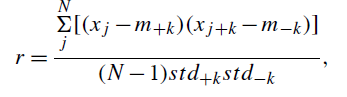

where k indicates the spatial lag (or distance), m+k and std+k denote the mean and standard deviation, respectively, of all data points that are located a distance of +k away from an- other data point, and m−k and std−k are the corresponding quantities for data points located a distance of −k away from another data point (Redemann et al., 2006; Anderson et al., 2003).
Figure 1c shows pairs of 499nm AOD measured 20km (±0.2 km) away from each other in the Canada phase. The correlation coefficient, r, is 0.37. This is the autocorrelation for 20km.

## Run the autocorrelation calculations (some computer science for lower mem)

In [153]:
min_num = 100 # minimum number of points to be considered valid
types = ['all','t1','t2','t3','t4','z1','z2','z3']
corr_ks = [0.08,0.12, 0.18,0.27,0.4,0.6,0.9,1.35,2.0,3.0,5.0,7.5, 10.0, 15.0, 25.0, 35.0, 65.0, 100.0, 160.0,250.0, 380.0]

#[0.08,0.12,0.25,0.5,1.0,1.5,3.0,5.0,10.0,15.0,25.0,
#          35.0,65.0,100.0,150.0,200.0,350.0] 

In [154]:
dvals['doys'][0][0], dvals['alt'][0][0]

(122.97180555555556, 1271.4)

In [206]:
# This is the new way to prepare the autocorrelation arrays, 
# set up the distance arrays and the corresponding arrays for matching values with varying lags. 
# iis will be needed to populate the correlation plus and minus arrays
dv = 0.20
mat_dist = [None]*len(dvals['cumdist'])
iis = []
for i,cd in enumerate(dvals['cumdist']):
    mat_dist[i] = np.array([cd-d for d in cd])
    iis.append([np.where((mat_dist[i]>(k*(1.0-dv)))&(mat_dist[i]<(k*(1.0+dv)))) for ik,k in enumerate(corr_ks)])

In [208]:
N = [len(cd) for i,cd in enumerate(dvals['cumdist'])] # number of points in each level leg

In [209]:
alldist = np.hstack([dist for dist in dvals['dist']])

<IPython.core.display.Javascript object>


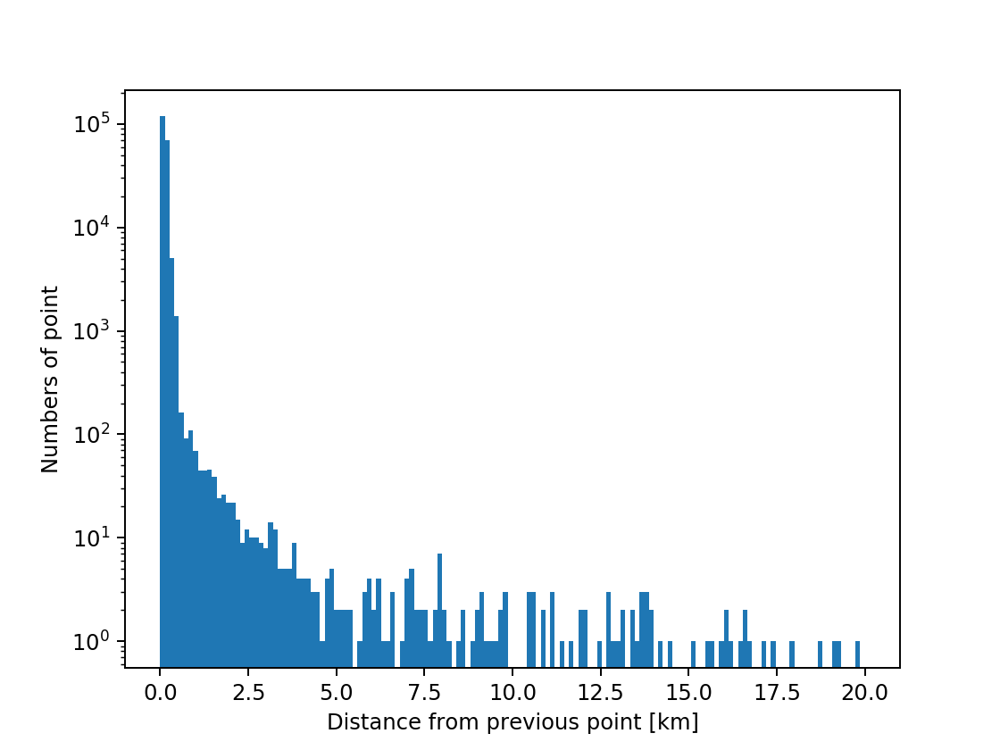

Text(0,0.5,'Numbers of point')

In [210]:
plt.figure()
plt.hist(alldist,bins=150,range=[0,20])
plt.gca().set_yscale('log')
plt.xlabel('Distance from previous point [km]')
plt.ylabel('Numbers of point')

In [211]:
iis[0] # example array for indices that have varying lag for a given leg.

[(array([], dtype=int64), array([], dtype=int64)),
 (array([2, 3]), array([3, 4])),
 (array([0, 1, 2]), array([1, 2, 4])),
 (array([1, 7]), array([3, 8])),
 (array([0, 0, 1, 5, 5, 6, 6, 7, 7]), array([2, 3, 4, 8, 9, 8, 9, 8, 9])),
 (array([0]), array([4])),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([2, 2, 2, 3, 3, 3, 4, 4, 4]), array([5, 6, 7, 5, 6, 7, 5, 6, 7])),
 (array([0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 2, 2, 3, 3, 4, 4]),
  array([5, 6, 7, 8, 9, 5, 6, 7, 8, 9, 8, 9, 8, 9, 8, 9])),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dtype=int64)),
 (array([], dtype=int64), array([], dt

In [126]:
dvals['doys_n'] = np.array([dvals['doys'][i][0] for i,cd in enumerate(dvals['cumdist'])])
dvals['alt_n'] = np.array([dvals['alt'][i][0] for i,cd in enumerate(dvals['cumdist'])])

In [145]:
# set up the different types of autocorrelation (all data, only for met time 1, low altitudes, etc.)
itypes = [None]*8
#all data under alt <3km
itypes[0], = np.where((dvals['doys_n']>0.0) &
                        (dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z2[1]))
#time types for alt <3km
itypes[1], = np.where((dvals['doys_n'] > t1[0]) & (dvals['doys_n'] < t1[1]) &
                        (dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z2[1]))
itypes[2], = np.where((dvals['doys_n'] > t2[0]) & (dvals['doys_n'] < t2[1 ]) &
                        (dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z2[1]))
itypes[3], = np.where((dvals['doys_n'] > t3[0]) & (dvals['doys_n'] < t3[1]) &
                        (dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z2[1]))
itypes[4], = np.where((dvals['doys_n'] > t4[0]) & (dvals['doys_n'] < t4[1]) &
                        (dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z2[1]))
#alt types
itypes[5], = np.where((dvals['alt_n'] > z1[0]) & (dvals['alt_n'] < z1[1]))
itypes[6], = np.where((dvals['alt_n'] > z2[0]) & (dvals['alt_n'] < z2[1]))
itypes[7], = np.where((dvals['alt_n'] > z3[0]) & (dvals['alt_n'] < z3[1]))

In [146]:
z1,z2

([0.0, 1000.0], [1000.0, 3000.0])

In [396]:
for itt,ts in enumerate([t1,t2,t3,t4]):
    to_it = np.where((dvals['doys_n'] > ts[0]) & (dvals['doys_n'] < ts[1]))
    print('time met {}: ndays: {}'.format(itt+1,len(np.unique(np.around(dvals['doys_n'][to_it])))))

time met 1: ndays: 7
time met 2: ndays: 4
time met 3: ndays: 3
time met 4: ndays: 3


In [401]:
for itt, zs in enumerate([z1,z2,z3]):
    to_it = np.where((dvals['alt_n'] > zs[0]) & (dvals['alt_n'] < zs[1]))
    print('alt range {}: ndays: {}'.format(itt+1,len(np.unique(np.around(dvals['doys_n'][to_it])))))

alt range 1: ndays: 18
alt range 2: ndays: 18
alt range 3: ndays: 21


In [216]:
# Spot check the distance indices represent the actual distance values in the each segment
j = 0
for ik,k in enumerate(corr_ks): 
    print k, dvals['cumdist'][j][iis[j][ik][0]]-dvals['cumdist'][j][iis[j][ik][1]]

0.08 []
0.12 [-0.1075282 -0.1076511]
0.18 [-0.17796138 -0.15450371 -0.2151793 ]
0.27 [-0.26203191 -0.32388935]
0.4 [-0.33246508 -0.43999329 -0.36968301 -0.3854454  -0.42328378 -0.35476484
 -0.39260323 -0.32388935 -0.36172774]
0.6 [-0.54764439]
0.9 []
1.35 []
2.0 []
3.0 []
5.0 []
7.5 []
10.0 [-11.8652383  -11.89591885 -11.92679435 -11.7577101  -11.78839065
 -11.81926614 -11.650059   -11.68073955 -11.71161504]
15.0 [-12.19770339 -12.22838394 -12.25925943 -12.58314878 -12.62098717
 -12.01974201 -12.05042256 -12.08129806 -12.40518741 -12.44302579
 -12.2506837  -12.28852208 -12.1431555  -12.18099388 -12.0355044
 -12.07334278]
25.0 []
35.0 []
65.0 []
100.0 []
160.0 []
250.0 []
380.0 []


In [222]:
len(iis)

305

In [217]:
# tester for just one plus and minus lag distances in distribution for correlation calc.
val = 'AE'
ik = 1
j = 0
corrp = np.hstack([dvals[val][i][iis[i][ik][1]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])
corrm = np.hstack([dvals[val][i][iis[i][ik][0]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])

In [212]:
corr_vals = ['aod1040','aod0500','AE','aod_fine','aod_coarse','fmf',
             'GOCI_AOD','GOCI_AE','GOCI_fmf',
             'MERRA_AOD','MERRA_AE',
             'situ_ext','situ_ae','situ_ssa']

In [213]:
range_vals = {'aod1040':[0.0,3.0],'aod0500':[0.0,5.0],'AE':[-1.0,5.0],'aod_fine':[0.0,5.0],'aod_coarse':[0.0,5.0],
              'fmf':[0.0,1.0],'GOCI_AOD':[0.0,5.0],'GOCI_AE':[-1.0,5.0],'GOCI_fmf':[0.0,1.0],
              'MERRA_AOD':[0.0,5.0],'MERRA_AE':[-1.0,5.0],'situ_ext':[0.0,1000.0],'situ_ae':[-1.0,5.0],'situ_ssa':[0.2,1.0]}

In [214]:
corr_vals = ['AE','aod1040','fmf','aod0500']

In [215]:
len(dvals['cumdist'])

305

### Testing single runs before multiprocessing

In [262]:
autocorr = {}
autocorr_len = {}

for val in corr_vals:
    autocorr[val] = np.zeros((len(types),len(corr_ks)))+np.nan
    autocorr_len[val] = np.zeros((len(types),len(corr_ks)))
    print val
    for ik,k in enumerate(corr_ks):
        sys.stdout.write("{} ".format(ik))
        for j,jt in enumerate(types):
            corrp = np.hstack([dvals[val][i][iis[i][ik][1]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])
            corrm = np.hstack([dvals[val][i][iis[i][ik][0]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])
            badc = (corrp>range_vals[val][1]) | (corrp<range_vals[val][0])
            if any(badc): 
                corrp[badc] = np.nan
                corrm[badc] = np.nan
            
            badc = (corrm>range_vals[val][1]) | (corrm<range_vals[val][0])
            if any(badc): 
                corrp[badc] = np.nan
                corrm[badc] = np.nan
            
            mmk = np.nanmean(corrm)
            mpk = np.nanmean(corrp)
            smk = np.nanstd(corrm)
            spk = np.nanstd(corrp)
            top = (corrm-mpk)*(corrp-mmk) #[(v-mpk)*(corrp[iv]-mmk) for iv,v in enumerate(corrm)]
            #print val,ik,j,mmk,mpk,smk,spk,np.nansum(top)
            autocorr[val][j,ik] = np.nansum(top)/((len(corrm)-1)*spk*smk)
            autocorr_len[val][j,ik] = len(corrm)
            if autocorr_len[val][j,ik]<min_num:
                autocorr[val][j,ik] = np.nan


AE
0 1 2 

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in greater
  del sys.path[0]
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in less
  del sys.path[0]
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in greater
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in less


3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:23: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


aod1040
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 fmf
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 aod0500
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 

In [ ]:
# For calculating monte carlo over the selection of horizontal legs, and not the samples, first testing
autocorr_mc = {}
autocorr_len_mc = {}
subsamp_ratio = 0.30
N_mc = 50


for val in ['AE']:
    autocorr_mc[val] = np.zeros((len(types),len(corr_ks),N_mc))+np.nan
    autocorr_len_mc[val] = np.zeros((len(types),len(corr_ks),N_mc))
    for ix in range(N_mc):
        print ix, val
        irand = np.random.randint(len(dvals['cumdist']),size=int(subsamp_ratio*len(dvals['cumdist'])))
        for ik,k in enumerate(corr_ks):
            sys.stdout.write("{} ".format(ik))
            for j,jt in enumerate(types):        
                corrp = np.hstack([dvals[val][i][iis[i][ik][1]] for i in irand if i in itypes[j]])
                corrm = np.hstack([dvals[val][i][iis[i][ik][0]] for i in irand if i in itypes[j]])
                badc = (corrp>range_vals[val][1]) | (corrp<range_vals[val][0])
                if any(badc): 
                    corrp[badc] = np.nan
                    corrm[badc] = np.nan

                badc = (corrm>range_vals[val][1]) | (corrm<range_vals[val][0])
                if any(badc): 
                    corrp[badc] = np.nan
                    corrm[badc] = np.nan

                mmk = np.nanmean(corrm)
                mpk = np.nanmean(corrp)
                smk = np.nanstd(corrm)
                spk = np.nanstd(corrp)
                top = (corrm-mpk)*(corrp-mmk) #[(v-mpk)*(corrp[iv]-mmk) for iv,v in enumerate(corrm)]
                #print val,ik,j,mmk,mpk,smk,spk,np.nansum(top)
                autocorr_mc[val][j,ik,ix] = np.nansum(top)/((len(corrm)-1)*spk*smk)
                autocorr_len_mc[val][j,ik,ix] = len(corrm)
                if autocorr_len_mc[val][j,ik,ix]<min_num:
                    autocorr_mc[val][j,ik,ix] = np.nan

In [199]:
np.nanmean(autocorr_mc['AE'][0,:,:],axis=1)

array([0.89564951, 0.93213467, 0.9041905 , 0.92265411, 0.91765188,
       0.91329125, 0.90971334, 0.90734833, 0.90448487, 0.90055933,
       0.89173173, 0.88063485, 0.86960385, 0.85254418, 0.82349686,
       0.80811281, 0.78087613, 0.76284893, 0.69991822, 0.62823504,
       0.25566397])

In [202]:
autocorr_len_mc['AE'][0,6,:]

array([227888., 344048., 377370., 424417., 255498., 185381., 202483.,
       751012., 443813., 212330., 177638., 201514., 156294., 409942.,
       427238., 178075., 379676., 164896., 183007., 399614., 220345.,
       204283., 310961., 345508., 208220., 365219., 208470., 365448.,
       729743., 549938., 375331.,  87810., 159557., 209941., 223994.,
       409858., 384052., 169413., 354840., 185189., 438859., 411647.,
       250396., 161304., 754015., 560993., 168241., 215095., 378418.,
       174148.])

### Functionalize for using 
takes a long time ~7hours on 7 cpus server

In [125]:
dvals.keys()

['dist',
 'MERRA_AOD_sulf',
 'aod_coarse',
 'MERRA_AOD_oc',
 'MERRA_AOD',
 'len_minutes',
 'alt',
 'MERRA_AE',
 'aod1040',
 'doys',
 'MERRA_AOD_bc',
 'lon',
 'situ_ssa',
 'fmf',
 'MERRA_AOD_sea',
 'GOCI_AOD_c',
 'AE',
 'GOCI_AOD_f',
 'cumdist',
 'GOCI_AOD',
 'lat',
 'GOCI_fmf',
 'aod_fine',
 'utc',
 'situ_ext',
 'aod0500',
 'len_doys',
 'situ_ae',
 'MERRA_AOD_dust',
 'GOCI_AE']

In [286]:
dvals.keys()

[u'dist',
 u'doys_n',
 u'MERRA_AOD',
 u'aod_coarse',
 u'MERRA_AOD_oc',
 u'alt_n',
 u'len_minutes',
 u'alt',
 u'MERRA_AE',
 u'aod1040',
 u'doys',
 u'MERRA_AOD_bc',
 u'lon',
 u'situ_ssa',
 u'fmf',
 u'MERRA_AOD_sea',
 u'GOCI_AOD_c',
 u'AE',
 u'GOCI_AOD_f',
 u'cumdist',
 u'GOCI_AOD',
 u'lat',
 u'GOCI_fmf',
 u'aod_fine',
 u'utc',
 u'MERRA_AOD_sulf',
 u'aod0500',
 u'situ_ext',
 u'len_doys',
 u'situ_ae',
 u'MERRA_AOD_dust',
 u'GOCI_AE']

In [135]:
if (vv == 'v2') | (vv == 'v3') | (vv == 'v4'):
    corr_vals = ['aod_fine','aod_coarse','GOCI_AOD_c','GOCI_AOD_f',
                 'MERRA_AOD_dust','MERRA_AOD_sea','MERRA_AOD_bc','MERRA_AOD_oc','MERRA_AOD_sulf',
                 'aod1040','aod0500','AE','fmf',
                 'GOCI_AOD','GOCI_AE','GOCI_fmf',
                 'MERRA_AOD','MERRA_AE',
                 'situ_ext','situ_ae','situ_ssa']
    range_vals = {'aod_fine':[0.0,5.0],'aod_coarse':[0.0,5.0],'GOCI_AOD_c':[0.0,5.0],'GOCI_AOD_f':[0.0,5.0],
                  'MERRA_AOD_dust':[0.0,5.0],'MERRA_AOD_sea':[0.0,5.0],'MERRA_AOD_bc':[0.0,5.0],
                  'MERRA_AOD_oc':[0.0,5.0],'MERRA_AOD_sulf':[0.0,5.0],
                  'aod1040':[0.0,3.0],'aod0500':[0.0,5.0],'AE':[-1.0,5.0],
                  'fmf':[0.0,1.0],'GOCI_AOD':[0.0,5.0],'GOCI_AE':[-1.0,5.0],'GOCI_fmf':[0.0,1.0],
                  'MERRA_AOD':[0.0,5.0],'MERRA_AE':[-1.0,5.0],'situ_ext':[0.0,1000.0],
                  'situ_ae':[-1.0,5.0],'situ_ssa':[0.2,1.0]}
    

In [241]:
autocorr = {}
autocorr_len = {}

In [242]:
def calc_autocorr(val,types=types,corr_ks=corr_ks,dvals=dvals,iis=iis,itypes=itypes,range_vals=range_vals):
    dat = {'c':{},'l':{},'mean_diff':{},'std_diff':{},'median_diff':{}}
    dat['c'][val] = np.zeros((len(types),len(corr_ks)))+np.nan
    dat['mean_diff'][val] = np.zeros((len(types),len(corr_ks)))+np.nan
    dat['std_diff'][val] = np.zeros((len(types),len(corr_ks)))+np.nan
    dat['median_diff'][val] = np.zeros((len(types),len(corr_ks)))+np.nan
    dat['l'][val] = np.zeros((len(types),len(corr_ks)))
    print val
    for ik,k in enumerate(corr_ks):
        sys.stdout.write("{} ".format(ik))
        for j,jt in enumerate(types):
            corrp = np.hstack([dvals[val][i][iis[i][ik][1]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])
            corrm = np.hstack([dvals[val][i][iis[i][ik][0]] for i,cd in enumerate(dvals['cumdist']) if i in itypes[j]])
            badc = (corrp>range_vals[val][1]) | (corrp<range_vals[val][0])
            if any(badc): 
                corrp[badc] = np.nan
                corrm[badc] = np.nan
            
            badc = (corrm>range_vals[val][1]) | (corrm<range_vals[val][0])
            if any(badc): 
                corrp[badc] = np.nan
                corrm[badc] = np.nan
            
            mmk = np.nanmean(corrm)
            mpk = np.nanmean(corrp)
            smk = np.nanstd(corrm)
            spk = np.nanstd(corrp)
            top = (corrm-mpk)*(corrp-mmk) #[(v-mpk)*(corrp[iv]-mmk) for iv,v in enumerate(corrm)]
            #print val,ik,j,mmk,mpk,smk,spk,np.nansum(top)
            dat['c'][val][j,ik] = np.nansum(top)/((len(corrm)-1)*spk*smk)
            dat['mean_diff'][val][j,ik] = np.nanmean(corrm-corrp)
            dat['std_diff'][val][j,ik] = np.nanstd(corrm-corrp)
            dat['median_diff'][val][j,ik] = np.nanmedian(corrm-corrp)
            dat['l'][val][j,ik] = len(corrm)
            if dat['l'][val][j,ik]<min_num:
                dat['c'][val][j,ik] = np.nan
                
    return dat

In [243]:
subsamp_ratio = 0.30
N_mc = 50

In [233]:
def calc_autocorr_mc(val,types=types,corr_ks=corr_ks,dvals=dvals,iis=iis,itypes=itypes,range_vals=range_vals,
                     subsamp_ratio=subsamp_ratio,N_mc=N_mc):
    dat = {'c':{},'l':{}}
    dat['c'][val] = np.zeros((len(types),len(corr_ks),N_mc))+np.nan
    dat['l'][val] = np.zeros((len(types),len(corr_ks),N_mc))
    for ix in range(N_mc):
        print ix,val
        irand = np.random.randint(len(dvals['cumdist']),size=int(subsamp_ratio*len(dvals['cumdist'])))
        for ik,k in enumerate(corr_ks):
            sys.stdout.write("{} ".format(ik))
            for j,jt in enumerate(types):
                corrp = np.hstack([dvals[val][i][iis[i][ik][1]] for i in irand if i in itypes[j]])
                corrm = np.hstack([dvals[val][i][iis[i][ik][0]] for i in irand if i in itypes[j]])
                badc = (corrp>range_vals[val][1]) | (corrp<range_vals[val][0])
                if any(badc): 
                    corrp[badc] = np.nan
                    corrm[badc] = np.nan

                badc = (corrm>range_vals[val][1]) | (corrm<range_vals[val][0])
                if any(badc): 
                    corrp[badc] = np.nan
                    corrm[badc] = np.nan

                mmk = np.nanmean(corrm)
                mpk = np.nanmean(corrp)
                smk = np.nanstd(corrm)
                spk = np.nanstd(corrp)
                top = (corrm-mpk)*(corrp-mmk) #[(v-mpk)*(corrp[iv]-mmk) for iv,v in enumerate(corrm)]
                #print val,ik,j,mmk,mpk,smk,spk,np.nansum(top)
                dat['c'][val][j,ik,ix] = np.nansum(top)/((len(corrm)-1)*spk*smk)
                dat['l'][val][j,ik,ix] = len(corrm)
                if dat['l'][val][j,ik,ix]<min_num:
                    dat['c'][val][j,ik,ix] = np.nan
                
    return dat

In [247]:
p = Pool(7,worker_init)

aod_fine
aod_coarse
MERRA_AOD_bc
MERRA_AOD_dust
GOCI_AOD_c
MERRA_AOD_sea
GOCI_AOD_f


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in less
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in greater
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in greater
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in less
  

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 MERRA_AOD_oc
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 MERRA_AOD_sulf
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 aod1040


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1076: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 aod0500


/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:25: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: Mean of empty slice
/home/sam/.local/lib/python2.7/site-p

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 AE
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 fmf
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 GOCI_AOD
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 GOCI_AE
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 GOCI_fmf
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 MERRA_AOD
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 MERRA_AE
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 situ_ext
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 situ_ae
0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 situ_ssa


In [248]:
autocorr = {}
autocorr_len = {}
mean_diff = {}
median_diff = {}
std_diff = {}
with tqdm(total=len(corr_vals)) as pbar:
    for i, outs in tqdm(enumerate(p.imap_unordered(calc_autocorr, corr_vals))):
        pbar.update()
        k = outs['c'].keys()[0]
        autocorr[k] = outs['c'][k]
        autocorr_len[k] = outs['l'][k]
        mean_diff[k] = outs['mean_diff'][k]
        median_diff[k] = outs['median_diff'][k]
        std_diff[k] = outs['std_diff'][k]

In [236]:
autocorr_mc = {}
autocorr_len_mc = {}
with tqdm(total=len(corr_vals)) as pbar:
    for i, outs in tqdm(enumerate(p.imap_unordered(calc_autocorr_mc, corr_vals))):
        pbar.update()
        k = outs['c'].keys()[0]
        autocorr_mc[k] = outs['c'][k]
        autocorr_len_mc[k] = outs['l'][k]

In [237]:
autocorr_mc['GOCI_fmf'].shape

(8, 21, 50)

### Save

In [251]:
## Save the non-montecarlo for mean, meidan and std differences
dat_m = {u'autocorr':autocorr,u'autocorr_len':autocorr_len,u'mean_diff':mean_diff,u'median_diff':median_diff,u'std_diff':std_diff}
dat_mm = wu.iterate_dict_unicode(dat_m)
hs.savemat(fp+'KORUS_fine_coarse_autocorr_mean_med_std_{}.mat'.format(vv),dat_mm)

('no', u'std_diff')
('no', u'mean_diff')
('no', u'autocorr')
('no', u'median_diff')
('no', u'autocorr_len')


/home/sam/.local/lib/python2.7/site-packages/hdf5storage/__init__.py:1306: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  f = h5py.File(filename)


In [238]:
dat_c = {u'autocorr_mc':autocorr_mc,'autocorr_len_mc':autocorr_len_mc}

In [239]:
dat_u = wu.iterate_dict_unicode(dat_c)

('no', 'autocorr_len_mc')
('no', u'autocorr_mc')


In [240]:
hs.savemat(fp+'KORUS_fine_coarse_autocorr_mc_{}.mat'.format(vv),dat_u)

/home/sam/.local/lib/python2.7/site-packages/hdf5storage/__init__.py:1234: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  f = h5py.File(filename)
/home/sam/.local/lib/python2.7/site-packages/hdf5storage/__init__.py:1306: H5pyDeprecationWarning: The default file mode will change to 'r' (read-only) in h5py 3.0. To suppress this warning, pass the mode you need to h5py.File(), or set the global default h5.get_config().default_file_mode, or set the environment variable H5PY_DEFAULT_READONLY=1. Available modes are: 'r', 'r+', 'w', 'w-'/'x', 'a'. See the docs for details.
  f = h5py.File(filename)


In [225]:
dat_mm = hs.loadmat(fp+'KORUS_fine_coarse_autocorr_mean_med_std_{}.mat'.format(vv))
mean_diff = dat_mm[u'mean_diff']
std_diff = dat_mm[u'std_diff']
median_diff = dat_mm[u'median_diff']

In [224]:
dat_mm.keys()

[u'autocorr', u'mean_diff', u'std_diff', u'median_diff', u'autocorr_len']

### Load the models

In [127]:
dat_c = hs.loadmat(fp+'KORUS_fine_coarse_autocorr_mc_{}.mat'.format(vv))

In [128]:
dat_c.keys()

[u'autocorr_len_mc', u'autocorr_mc']

In [129]:
autocorr_len_mc, autocorr_mc = dat_c['autocorr_len_mc'],dat_c['autocorr_mc']

In [130]:
autocorr_mc.keys()

[u'aod1040',
 u'situ_ssa',
 u'GOCI_AOD_c',
 u'AE',
 u'MERRA_AOD_sulf',
 u'GOCI_AOD_f',
 u'MERRA_AOD_bc',
 u'MERRA_AE',
 u'aod0500',
 u'MERRA_AOD_dust',
 u'aod_coarse',
 u'MERRA_AOD_oc',
 u'fmf',
 u'GOCI_AOD',
 u'situ_ext',
 u'situ_ae',
 u'MERRA_AOD',
 u'GOCI_AE',
 u'aod_fine',
 u'GOCI_fmf',
 u'MERRA_AOD_sea']

In [131]:
autocorr_mc['aod0500'].shape

(8, 21, 50)

In [132]:
autocorr_len_mc['aod0500'].shape

(8, 21, 50)

### combine results and calc stats

In [133]:
autocorrs = autocorr_mc

In [134]:
autocorr_min = {}
autocorr_max = {}
autocorr_d = {}
autocorr_mean = {}

for val in corr_vals:
    autocorr_min[val] = np.zeros((len(types),len(corr_ks)))+np.nan
    autocorr_max[val] = np.zeros((len(types),len(corr_ks)))+np.nan
    autocorr_d[val] = np.zeros((len(types),len(corr_ks)))+np.nan
    autocorr_mean[val] = np.zeros((len(types),len(corr_ks)))+np.nan
    
    for ik,k in enumerate(corr_ks):
        for j,jt in enumerate(types):
            #if not len(corr_all[j][0][ik][val]):
            #    continue
            autocorr_min[val][j,ik] = np.nanmin(autocorrs[val][j,ik,:])
            autocorr_max[val][j,ik] = np.nanmax(autocorrs[val][j,ik,:])
            autocorr_d[val][j,ik] = autocorr_max[val][j,ik] - autocorr_min[val][j,ik]
            autocorr_mean[val][j,ik] = np.nanmean(autocorrs[val][j,ik,:])

NameError: name 'corr_vals' is not defined

## Plot main Instrisic vs. extrinsic for each dataset (monte carlo on segments) (Section 4.4, Fig. 10)

In [103]:
corr_ks = np.array(corr_ks)

In [105]:
e_folding_autocorr = lambda x: corr_ks[np.argmin(abs(x[0]*np.exp(-1.0)-x))]
percentile_autocorr = lambda x,p: corr_ks[np.argmin(abs(x[0]*p-x))]
distance_autocorr = lambda x,p: corr_ks[np.argmin(abs(x-p))]

<IPython.core.display.Javascript object>


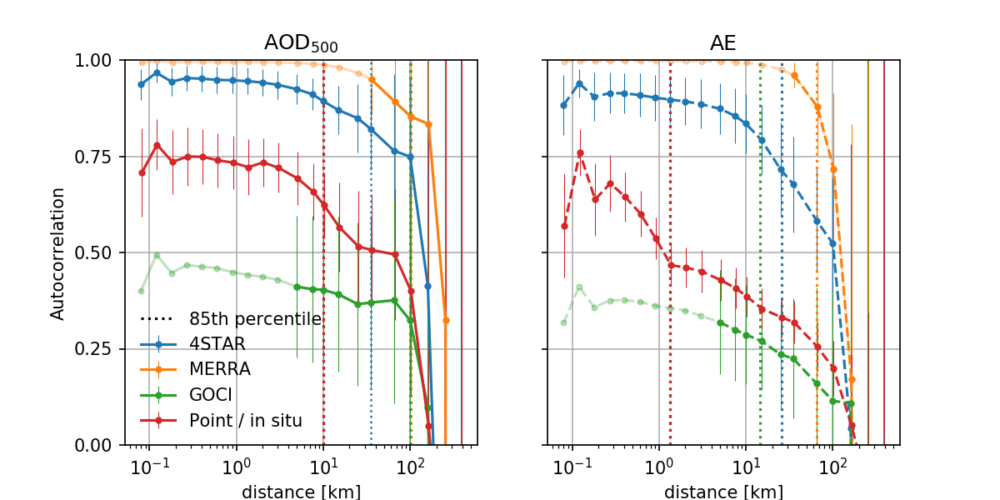

In [107]:
fig, ax = plt.subplots(1,2,sharey=True,figsize=(8,4))
j = 0
jj = 0
jjm = 10
jjme = 15
cl = ['tab:blue','tab:orange','tab:green','tab:red']
#ax[0].plot(corr_ks[jj:],np.nanmean(autocorr_mc['AE'][j,jj:],ls='--',marker='.',label='AE',color='k')
ax[1].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['AE'][j,jj:,:],axis=1),yerr=np.nanstd(autocorr_mc['AE'][j,jj:,:],axis=1),
               elinewidth=0.51,ls='--',marker='.',label='4STAR',color=cl[0])
ax[1].axvline(percentile_autocorr(np.nanmean(autocorr_mc['AE'][j,jj:,:],axis=1),0.85)*1.03,ls=':',color=cl[0])
ax[1].plot(corr_ks[jj:]*1.02,np.nanmean(autocorr_mc['MERRA_AE'][j,jj:,:],axis=1),ls='--',marker='.',alpha=0.3,color=cl[1])
ax[1].errorbar(corr_ks[jjme:]*1.02,np.nanmean(autocorr_mc['MERRA_AE'][j,jjme:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['MERRA_AE'][j,jjme:,:],axis=1),elinewidth=0.51,
               ls='--',marker='.',label='MERRA',color=cl[1])
ax[1].axvline(percentile_autocorr(np.nanmean(autocorr_mc['MERRA_AE'][j,jj:,:],axis=1),0.85),ls=':',color=cl[1])
ax[1].plot(corr_ks[jj:],np.nanmean(autocorr_mc['GOCI_AE'][j,jj:,:],axis=1),ls='--',marker='.',alpha=0.3,color=cl[2])
ax[1].errorbar(corr_ks[jjm:],np.nanmean(autocorr_mc['GOCI_AE'][j,jjm:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['GOCI_AE'][j,jjm:,:],axis=1),elinewidth=0.51,
               ls='--',marker='.',label='GOCI',color=cl[2])
ax[1].axvline(percentile_autocorr(np.nanmean(autocorr_mc['GOCI_AE'][j,jj:,:],axis=1),0.85)*0.97,ls=':',color=cl[2])
ax[1].errorbar(corr_ks[jj:]*1.02,np.nanmean(autocorr_mc['situ_ae'][j,jj:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['situ_ae'][j,jj:,:],axis=1),elinewidth=0.51,
               ls='--',marker='.',label='Point / in situ',color=cl[3])
ax[1].axvline(percentile_autocorr(np.nanmean(autocorr_mc['situ_ae'][j,jj:,:],axis=1),0.85),ls=':',color='k',label='85th percentile')
ax[1].axvline(percentile_autocorr(np.nanmean(autocorr_mc['situ_ae'][j,jj:,:],axis=1),0.85),ls=':',color=cl[3])
ax[1].set_title('AE')

#ax[1].plot(corr_ks[jj:],np.nanmean(autocorr_mc['aod0500'][j,jj:],ls='-',marker='.',label='AOD',color='k')
ax[0].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['aod0500'][j,jj:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['aod0500'][j,jj:,:],axis=1),elinewidth=0.51,
               ls='-',marker='.',label='4STAR',color=cl[0])
ax[0].plot(corr_ks[jj:]*1.02,np.nanmean(autocorr_mc['MERRA_AOD'][j,jj:,:],axis=1),ls='-',marker='.',alpha=0.3,color=cl[1])
ax[0].errorbar(corr_ks[jjme:]*1.02,np.nanmean(autocorr_mc['MERRA_AOD'][j,jjme:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['MERRA_AOD'][j,jjme:,:],axis=1),elinewidth=0.51,
               ls='-',marker='.',label='MERRA',color=cl[1])
ax[0].plot(corr_ks[jj:],np.nanmean(autocorr_mc['GOCI_AOD'][j,jj:,:],axis=1),ls='-',marker='.',alpha=0.3,color=cl[2])
ax[0].errorbar(corr_ks[jjm:],np.nanmean(autocorr_mc['GOCI_AOD'][j,jjm:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['GOCI_AOD'][j,jjm:,:],axis=1),elinewidth=0.51,
               ls='-',marker='.',label='GOCI',color=cl[2])
ax[0].errorbar(corr_ks[jj:]*1.02,np.nanmean(autocorr_mc['situ_ext'][j,jj:,:],axis=1),
               yerr=np.nanstd(autocorr_mc['situ_ext'][j,jj:,:],axis=1),elinewidth=0.51,
               ls='-',marker='.',label='Point / in situ',color=cl[3])
ax[0].axvline(percentile_autocorr(np.nanmean(autocorr_mc['aod0500'][j,jj:,:],axis=1),0.85),ls=':',color=cl[0],lw=1.2)
ax[0].axvline(percentile_autocorr(np.nanmean(autocorr_mc['MERRA_AOD'][j,jj:,:],axis=1),0.85)*1.03,ls=':',color=cl[1])
ax[0].axvline(percentile_autocorr(np.nanmean(autocorr_mc['GOCI_AOD'][j,jj:,:],axis=1),0.85),ls=':',color=cl[2])
ax[0].axvline(percentile_autocorr(np.nanmean(autocorr_mc['situ_ext'][j,jj:,:],axis=1),0.85),ls=':',color='k',label='85th percentile')
ax[0].axvline(percentile_autocorr(np.nanmean(autocorr_mc['situ_ext'][j,jj:,:],axis=1),0.85),ls=':',color=cl[3])
ax[0].set_title('AOD$_{{500}}$')

if False:
    #ax[1].plot(corr_ks[jj:],np.nanmean(autocorr_mc['aod0500'][j,jj:],ls='-',marker='.',label='AOD',color='k')
    ax[2].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['fmf'][j,jj:,:],axis=1),yerr=np.nanstd(autocorr_mc['fmf'][j,jj:,:],axis=1),ls='-',marker='.',label='4STAR',color='tab:blue')
    #ax[0].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['MERRA_AOD'][j,jj:],yerr=np.nanstd(autocorr_mc['MERRA_AOD'][j,jj:],ls='-',marker='.',label='MERRA')
    ax[2].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['GOCI_fmf'][j,jj:,:],axis=1),yerr=np.nanstd(autocorr_mc['GOCI_fmf'][j,jj:,:],axis=1),ls='-',marker='.',label='GOCI',color='tab:green')
    #ax[0].errorbar(corr_ks[jj:],np.nanmean(autocorr_mc['situ_ext'][j,jj:],yerr=np.nanstd(autocorr_mc['situ_ext'][j,jj:],ls='-',marker='.',label='Point / in situ')
    ax[2].set_title('FMF')

ax[0].legend(frameon=False)

ax[0].set_ylim(0,1)
ax[0].set_yticks([0,0.25,0.5,0.75,1.0])
ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[0].set_xlabel('distance [km]')
ax[1].set_xlabel('distance [km]')
ax[0].set_ylabel('Autocorrelation')
ax[0].grid()
ax[1].grid()
#ax[2].grid()

plt.savefig(fp+'plot/KORUS_autocorr_AOD_AE_{}_sub.png'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_AOD_AE_{}_sub.pdf'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_AOD_AE_{}_sub.eps'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_AOD_AE_{}_sub.svg'.format(vv+'b'),dpi=600,transparent=True)

## Determine standard deviation, mean, and medians change with distance (Section 4.4, Table 2)

<IPython.core.display.Javascript object>


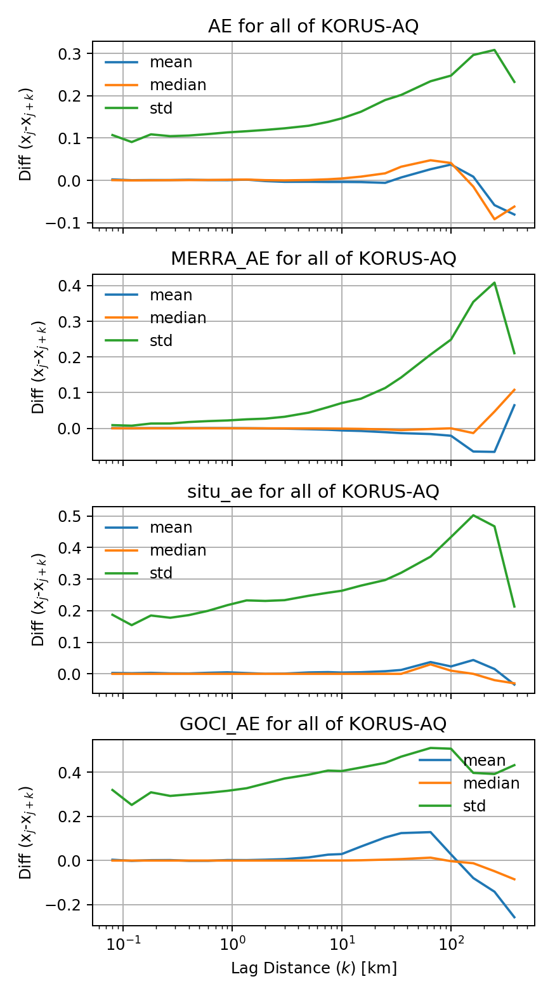

In [280]:
elements = ['AE','MERRA_AE','situ_ae','GOCI_AE'] 
fig,ax = plt.subplots(len(elements),1,sharex=True,figsize=(5,9))
for i,nl in enumerate(elements):
    
    ax[i].plot(corr_ks,mean_diff[nl][0],label='mean')
    ax[i].plot(corr_ks,median_diff[nl][0],label='median')
    ax[i].plot(corr_ks,std_diff[nl][0],label='std')
    ax[i].legend(frameon=False)
    if i>2: ax[i].set_xlabel('Lag Distance ($k$) [km]')
    ax[i].set_ylabel('Diff (x$_{{j}}$-x$_{{j+k}}$)')
    ax[i].set_title('{} for all of KORUS-AQ'.format(nl))
    ax[i].grid()
    ax[i].set_xscale('log')
plt.tight_layout()
plt.savefig(fp+'plot/KORUS_diff_AE_{}.png'.format(vv),dpi=600,transparent=True)

In [245]:
di = {'aod90':[15,65,10,7.5],
'aod85' : [35,100,65,10],
'aode' : [160,250,160,100],
'ae90' : [10,65,0.6,0.27],
'ae85' : [15,65,7.5,0.9],
'aee' : [100,160,100,65]} # value taken from below for the distance bin with the average percentile value.
dikaod = ['aod90','aod85','aode']
dikae = ['ae90','ae85','aee']

In [251]:
elements = ['aod0500','MERRA_AOD','GOCI_AOD','situ_ext'] 
for k in dikaod:
    print('For values at {}'.format(k))
    for n,d in enumerate(di[k]):
        i = np.argmin(abs(np.array(corr_ks)-d))
        if 'situ_ext' in elements[n]: 
            fac=2.5/1000.0 
        else: 
            fac = 1.0
        print('..{}: mean={}, median={}, std={}'.format(elements[n],mean_diff[elements[n]][0][i]*fac,
                                                       median_diff[elements[n]][0][i]*fac,std_diff[elements[n]][0][i]*fac))
        

For values at aod90
..aod0500: mean=0.00300834213437, median=0.001, std=0.136352776892
..MERRA_AOD: mean=-0.00152465794235, median=-0.00276079028845, std=0.050446074456
..GOCI_AOD: mean=0.00802572328648, median=0.00556910037994, std=0.0985393165286
..situ_ext: mean=0.0134077559805, median=0.0089, std=0.292627003868
For values at aod85
..aod0500: mean=-0.00720219905577, median=0.0, std=0.143659561292
..MERRA_AOD: mean=-0.00730698276311, median=-0.0042871683836, std=0.0682243183255
..GOCI_AOD: mean=0.0184529937893, median=0.029114857316, std=0.144178145801
..situ_ext: mean=0.0172830515458, median=0.0127, std=0.318018171899
For values at aode
..aod0500: mean=-0.00737407589652, median=-0.004, std=0.155704832418
..MERRA_AOD: mean=-0.0984917730093, median=-0.0230080429465, std=0.135785907507
..GOCI_AOD: mean=-0.0333503554635, median=-0.00334507226944, std=0.21719714156
..situ_ext: mean=0.00574200766619, median=0.006875, std=0.389412249137


In [247]:
elements = ['AE','MERRA_AE','GOCI_AE','situ_ae'] 
for k in dikae:
    print('For values at {}'.format(k))
    for n,d in enumerate(di[k]):
        i = np.argmin(abs(np.array(corr_ks)-d))
        print('..{}: mean={}, median={}, std={}'.format(elements[n],mean_diff[elements[n]][0][i],
                                                       median_diff[elements[n]][0][i],std_diff[elements[n]][0][i],))

For values at ae90
..AE: mean=-0.0036421048253, median=0.00456951823797, std=0.146542316354
..MERRA_AE: mean=-0.0161320008337, median=-0.00188684463501, std=0.206618964672
..GOCI_AE: mean=-0.000988700290457, median=0.0, std=0.307233415051
..situ_ae: mean=0.00154486972175, median=0.0, std=0.177602564477
For values at ae85
..AE: mean=-0.00395296317924, median=0.00890322554636, std=0.162280910783
..MERRA_AE: mean=-0.0161320008337, median=-0.00188684463501, std=0.206618964672
..GOCI_AE: mean=0.0268288151734, median=0.000157296657562, std=0.40797648219
..situ_ae: mean=0.0048294040123, median=0.0, std=0.217444841421
For values at aee
..AE: mean=0.0374450957226, median=0.0411727883392, std=0.247670020663
..MERRA_AE: mean=-0.0650862827897, median=-0.0134109854698, std=0.354427486658
..GOCI_AE: mean=0.0280864870545, median=-0.00281977653503, std=0.507112975063
..situ_ae: mean=0.0373226341759, median=0.03, std=0.371020352286


<IPython.core.display.Javascript object>


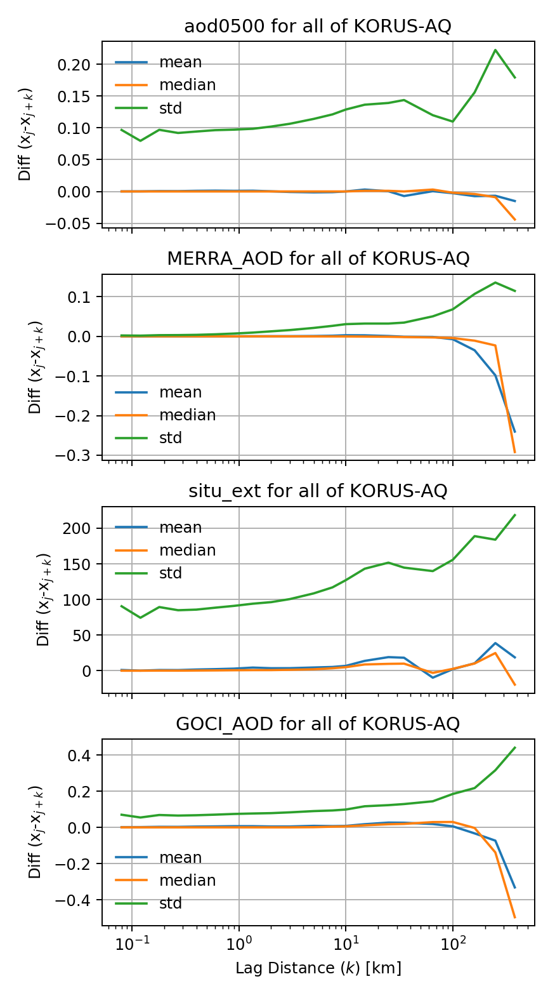

In [282]:
elements = ['aod0500','MERRA_AOD','situ_ext','GOCI_AOD'] 
fig,ax = plt.subplots(len(elements),1,sharex=True,figsize=(5,9))
for i,nl in enumerate(elements):
    
    ax[i].plot(corr_ks,mean_diff[nl][0],label='mean')
    ax[i].plot(corr_ks,median_diff[nl][0],label='median')
    ax[i].plot(corr_ks,std_diff[nl][0],label='std')
    ax[i].legend(frameon=False)
    ax[i].set_ylabel('Diff (x$_{{j}}$-x$_{{j+k}}$)')
    if i>2: ax[i].set_xlabel('Lag Distance ($k$) [km]')
    ax[i].set_title('{} for all of KORUS-AQ'.format(nl))
    ax[i].grid()
    ax[i].set_xscale('log')
plt.tight_layout()
plt.savefig(fp+'plot/KORUS_diff_AOD_{}.png'.format(vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


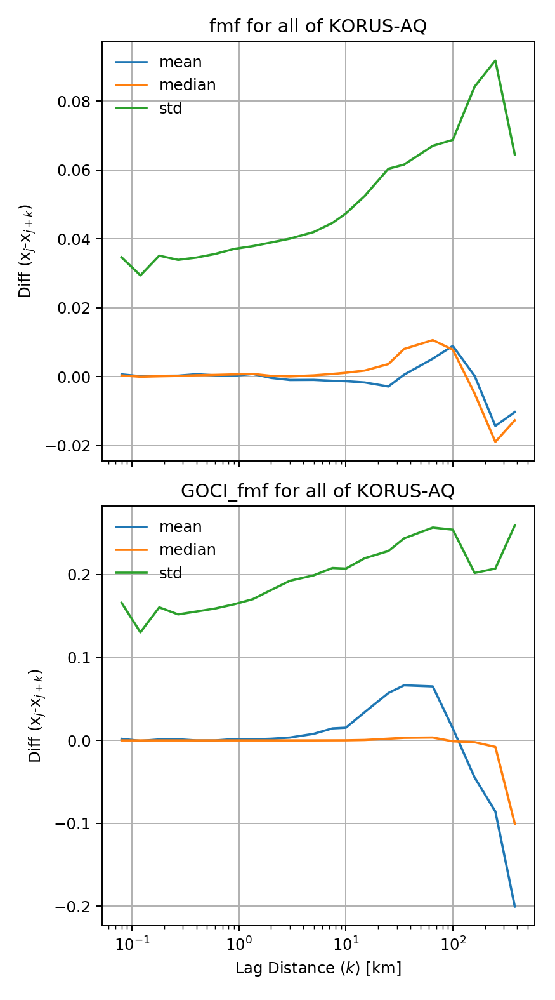

In [284]:
elements = ['fmf','GOCI_fmf'] 
fig,ax = plt.subplots(len(elements),1,sharex=True,figsize=(5,9))
for i,nl in enumerate(elements):
    
    ax[i].plot(corr_ks,mean_diff[nl][0],label='mean')
    ax[i].plot(corr_ks,median_diff[nl][0],label='median')
    ax[i].plot(corr_ks,std_diff[nl][0],label='std')
    ax[i].legend(frameon=False)
    ax[i].set_ylabel('Diff (x$_{{j}}$-x$_{{j+k}}$)')
    if i>len(elements)-2: ax[i].set_xlabel('Lag Distance ($k$) [km]')
    ax[i].set_title('{} for all of KORUS-AQ'.format(nl))
    ax[i].grid()
    ax[i].set_xscale('log')
plt.tight_layout()
plt.savefig(fp+'plot/KORUS_diff_FMF_{}.png'.format(vv),dpi=600,transparent=True)

# Investigate the autocorrelation based on other factors (time, speciation) (Section 4.5)

## Load the Autocorrelations from Shinozuka & Redemann

In [107]:
SR_corr_ks = [0.45,1.0,3.0,6.0,10.0,20.0,34.2]
SR_aod_corr_long = [0.998,0.997,0.995,0.985,0.981,0.946,0.917]
SR_aod_corr_loc = [0.975,0.941,0.830,0.712,0.584,0.365,0.328]
SR_AE_corr_long = [1.000,0.977,0.975,0.960,0.944,0.913,0.919]
SR_AE_corr_loc = [0.975,0.956,0.919,0.831,0.747,0.519,0.366]

#AOD local

> 0,4376084276355722; 0,9757725145572111  
0,9955912496957824; 0,9408298503197231  
2,993269282069332; 0,8303668774336445  
5,997701705897239; 0,711850105383489  
9,981245014250291; 0,5844939806380168  
20,005524337736603; 0,36462079805665715  
35,166804844012965; 0,32825206301575405  

#AE local  

>0,43836153494904556; 0,9757721573250459  
0,9972623352215253; 0,9556260493694856  
2,9925078192756667; 0,9191462151252102  
5,985354161428386; 0,8309627406851716  
9,993780925398312; 0,7465159146929592  
19,996703813167056; 0,5185049833887045  
35,22351663341235; 0,36598292430250434  

#AOD long  
>0,43833272405336876; 0,9987068195620337  
0,9971397077970326; 0,9985360625870756  
2,9918543848699146; 0,9953484799771375  
6,0033122296001995; 0,985586039366985  
9,969908496905848; 0,9810416889936774  
19,972213345966814; 0,9461254599364131  
35,10743016861416; 0,9178948308505701  

#AE long  
>0,43757781072798063; 1,0001868324223917  
0,9989150464154728; 0,9778205265602119  
2,992025659700471; 0,9753731289965352  
5,9831337971357215; 0,9604326081520385  
9,970944322675367; 0,9447901261029547  
19,97407661698948; 0,9135730361161722  
35,10728129935923; 0,9193744864787629  

In [108]:
note = [['a)','b)'],['c)','d)'],['e)','f)'],['g)','h)'],['i)','j)']]

## Only plot subset of autocorrelation extensive vs intensive

In [169]:
key_list = ['aod0500','aod1040','AE','aod_fine','aod_coarse']
key_list2 = ['aod0500','aod1040','AE','fmf']
legend_list = ['All','Dynamic','Stagnation','Extreme pollution','Blocking','0-1 km','1-3 km','3+ km']
cl_list = ['k','tab:red','tab:blue','tab:orange','tab:green','tab:olive','tab:cyan','tab:purple']
m_list = ['.','o','s','v','^','*','+','x']
tit = ['AOD$_{{500}}$','AOD$_{{1040}}$','AE','AOD$_{{fine}}$','AOD$_{{coarse}}$']
tit2 = ['AOD$_{{500}}$','AOD$_{{1040}}$','AE','fine-mode fraction']

<IPython.core.display.Javascript object>


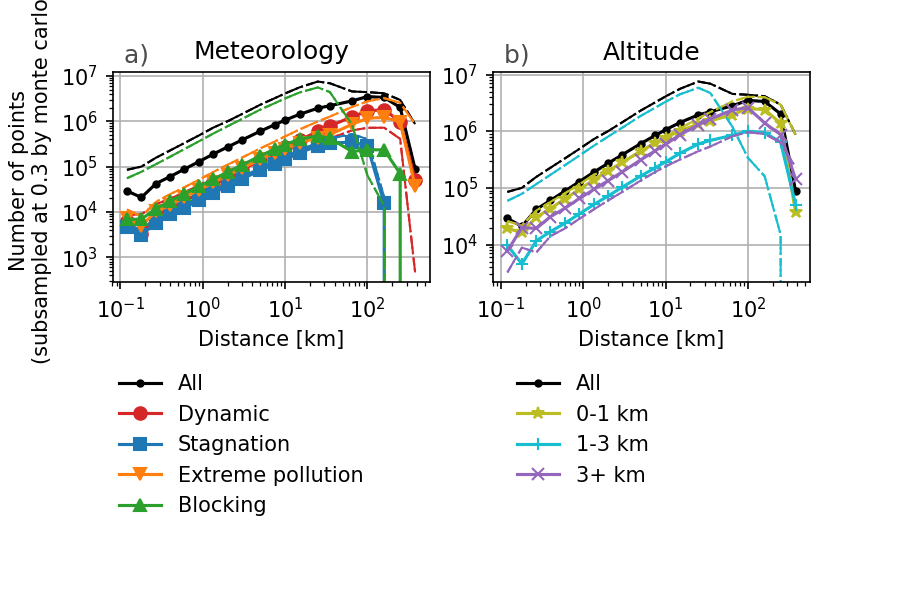

In [246]:
fig, ax = plt.subplots(2,2,figsize=(6,4))
i = 0
i_mc = 0 #which montecarlo iteration
for j in [0,1,2,3,4]:
    ax[i,0].plot(corr_ks[1:],autocorr_len_mc['aod0500'][j,1:,i_mc],label=legend_list[j],color=cl_list[j],marker=m_list[j])

    ax[i,0].plot(corr_ks[1:],autocorr_len_mc['GOCI_AOD'][j,1:,i_mc],
                 color=cl_list[j],ls=':',lw=1)
    ax[i,0].plot(corr_ks[1:],autocorr_len_mc['MERRA_AOD'][j,1:,i_mc],
                color=cl_list[j],ls='--',lw=1)
    ax[i,0].plot(corr_ks[1:],autocorr_len_mc['situ_ext'][j,1:,i_mc],
                 color=cl_list[j],ls='-.',lw=1)
for j in [0,5,6,7]:    
    ax[i,1].plot(corr_ks[1:],autocorr_len_mc['aod0500'][j,1:,i_mc],label=legend_list[j],color=cl_list[j],marker=m_list[j])

    ax[i,1].plot(corr_ks[1:],autocorr_len_mc['GOCI_AOD'][j,1:,i_mc],
                 color=cl_list[j],ls=':',lw=1)
    ax[i,1].plot(corr_ks[1:],autocorr_len_mc['MERRA_AOD'][j,1:,i_mc],
                 color=cl_list[j],ls='--',lw=1)
    ax[i,1].plot(corr_ks[1:],autocorr_len_mc['situ_ext'][j,1:,i_mc],
                 color=cl_list[j],ls='-.',lw=1)
#ax[i,0].set_ylim(0,1)
#ax[i,1].set_ylim(0,1)
ax[i,0].set_xscale('log')
ax[i,1].set_xscale('log')
ax[i,0].set_yscale('log')
ax[i,1].set_yscale('log')
ax[i,0].grid()
ax[i,1].grid()

ax[1,0].set_visible(False)
ax[1,1].set_visible(False)


#print 'r({})'.format(k)
ax[i,0].set_ylabel('Number of points \n(subsampled at {sub} by monte carlo)'.format(tit2[i],sub=subsamp_ratio))
pu.sub_note(note[i][0],ax=ax[i,0],out=True,fontsize=12)
pu.sub_note(note[i][1],ax=ax[i,1],out=True,fontsize=12)

ax[i,0].set_title('Meteorology')
ax[i,1].set_title('Altitude')
ax[i,0].set_xlabel('Distance [km]')
ax[i,1].set_xlabel('Distance [km]')

ax[i,0].legend(frameon=False,bbox_to_anchor=[0.85,-0.35])
ax[i,1].legend(frameon=False,bbox_to_anchor=[0.55,-0.35])
    

plt.savefig(fp+'plot/KORUS_Autocorr_number_{}.png'.format(vv),dpi=600,transparent=True)

In [247]:
key_list2

['aod0500', 'aod1040', 'AE', 'fmf']

In [248]:
tit2

['AOD$_{{500}}$', 'AOD$_{{1040}}$', 'AE', 'fine-mode fraction']

In [249]:
key_list3 = ['aod0500','fmf']
tit3 = ['AOD$_{{500}}$','fine-mode fraction']

In [91]:
corr_ks = np.array(corr_ks)

## Time and altitude ranges with monte carlo based on segments (Section 4.5, Fig. 11)

In [112]:
autocorr_mm = {}
autocorr_dm = {}
for k in autocorr_mc.keys():
    autocorr_mm[k] = np.zeros((len(types),len(corr_ks)))+np.nan
    autocorr_dm[k] = np.zeros((len(types),len(corr_ks)))+np.nan
    for j,jt in enumerate(types):
        autocorr_mm[k][j,:] = np.nanmean(autocorr_mc[k][j,:,:],axis=1)
        autocorr_dm[k][j,:] = np.nanstd(autocorr_mc[k][j,:,:],axis=1)

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: Mean of empty slice
  import sys
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1503: RuntimeWarning: invalid value encountered in subtract
  np.subtract(arr, avg, out=arr, casting='unsafe')


In [171]:
cl_list = ['k','tab:red','tab:blue','tab:orange','tab:green','tab:olive','tab:cyan','tab:purple']
key_list3 = ['aod0500','fmf']
tit3 = ['AOD$_{{500}}$','fine-mode fraction']

<IPython.core.display.Javascript object>


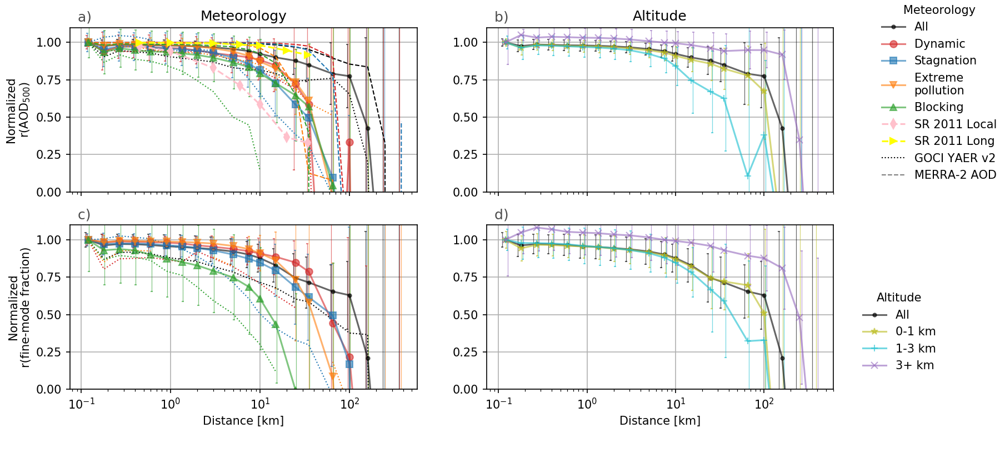

In [150]:
fig, ax = plt.subplots(2,3,figsize=(12,5.5))
for i,k in enumerate(key_list3):
    for j in [0,1,2,3,4]:
        ax[i,0].plot(corr_ks[1:],autocorr_mm[k][j,1:]/autocorr_mm[k][j,1],label=legend_list[j],color=cl_list[j],
                     marker=m_list[j],alpha=0.6)
        ax[i,0].errorbar(corr_ks[1:]*(0.94+j/50.0),autocorr_mm[k][j,1:]/autocorr_mm[k][j,1],
                         yerr=autocorr_dm[k][j,1:]/autocorr_mm[k][j,1],
                         color=cl_list[j],marker=None,ls='none',alpha=0.6,capsize=1.0,elinewidth=0.6)
        if k is 'aod0500':
            ax[i,0].plot(corr_ks[1:],autocorr_mm['GOCI_AOD'][j,1:]/autocorr_mm['GOCI_AOD'][j,1],
                         color=cl_list[j],ls=':',lw=1)
            ax[i,0].plot(corr_ks[1:],autocorr_mm['MERRA_AOD'][j,1:]/autocorr_mm['MERRA_AOD'][j,1],
                        color=cl_list[j],ls='--',lw=1)

        if k is 'fmf':
            ax[i,0].plot(corr_ks[1:],autocorr_mm['GOCI_fmf'][j,1:]/autocorr_mm['GOCI_fmf'][j,1],
                         color=cl_list[j],ls=':',lw=1)
    for j in [0,5,6,7]:    
        ax[i,1].plot(corr_ks[1:],autocorr_mm[k][j,1:]/autocorr_mm[k][j,1],label=legend_list[j],color=cl_list[j],
                     marker=m_list[j],alpha=0.6)
        ax[i,1].errorbar(corr_ks[1:]*(0.92+j/50.0),autocorr_mm[k][j,1:]/autocorr_mm[k][j,1],
                         yerr=autocorr_dm[k][j,1:]/autocorr_mm[k][j,1],
                         color=cl_list[j],marker=None,ls='none',alpha=0.6,capsize=1.0,elinewidth=0.6)
        #if k is 'aod0500':
        #    ax[i,1].plot(corr_ks[1:],autocorr_mm['GOCI_AOD'][j,1:]/autocorr_mm['GOCI_AOD'][j,1],
        #                 color=cl_list[j],ls=':',lw=1)
        #    ax[i,1].plot(corr_ks[1:],autocorr_mm['MERRA_AOD'][j,1:]/autocorr_mm['MERRA_AOD'][j,1],
        #                 color=cl_list[j],ls='--',lw=1)

        #if k is 'fmf':
        #    ax[i,1].plot(corr_ks[1:],autocorr_mm['GOCI_fmf'][j,1:]/autocorr_mm['GOCI_fmf'][j,1],
        #                 color=cl_list[j],ls=':',lw=1)
    ax[i,0].set_ylim(0,1.1)
    ax[i,1].set_ylim(0,1.1)
    ax[i,0].set_yticks([0,0.25,0.5,0.75,1.0])
    ax[i,1].set_yticks([0,0.25,0.5,0.75,1.0])
    ax[i,0].set_xscale('log')
    ax[i,1].set_xscale('log')
    ax[i,0].grid()
    ax[i,1].grid()
    
    ax[i,2].set_visible(False)
    
    #print 'r({})'.format(k)
    ax[i,0].set_ylabel('Normalized\nr({})'.format(tit3[i]))
    plt.setp(ax[i,0].get_xticklabels(), visible=False)
    plt.setp(ax[i,1].get_xticklabels(), visible=False)
    pu.sub_note(note[i][0],ax=ax[i,0],out=True,fontsize=12)
    pu.sub_note(note[i][1],ax=ax[i,1],out=True,fontsize=12)
    
    if i==0:
        ax[i,0].set_title('Meteorology')
        ax[i,1].set_title('Altitude')
        
        ax[i,0].plot(SR_corr_ks,SR_aod_corr_loc,'d--',c='pink',label='SR 2011 Local')
        ax[i,0].plot(SR_corr_ks,SR_aod_corr_long,'>--',c='yellow',label='SR 2011 Long')
        
    if i==0:
        ax[i,0].plot([],[],':',c='k',lw=1,label='GOCI YAER v2')
        ax[i,0].plot([],[],'--',c='grey',lw=1,label='MERRA-2 AOD')
        ax[i,0].legend(frameon=False,bbox_to_anchor=[2.7,1.2],title='Meteorology')
        ax[i,1].legend(frameon=False,bbox_to_anchor=[1.055,-0.55],title='Altitude')

    if i==1:
        ax[i,0].set_xlabel('Distance [km]')
        ax[i,1].set_xlabel('Distance [km]')
        plt.setp(ax[i,0].get_xticklabels(), visible=True)
        plt.setp(ax[i,1].get_xticklabels(), visible=True)

plt.subplots_adjust(left=0.07, bottom=0.15, right=1.25, top=0.94,
                wspace=None, hspace=None)
        
plt.savefig(fp+'plot/KORUS_Autocorr_dif_rel_subset_with_SR2011_GOCI_MERRA_{}.png'.format(vv),
            dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_Autocorr_dif_rel_subset_with_SR2011_GOCI_MERRA_{}.eps'.format(vv),
            dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_Autocorr_dif_rel_subset_with_SR2011_GOCI_MERRA_{}.pdf'.format(vv),
            dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_Autocorr_dif_rel_subset_with_SR2011_GOCI_MERRA_{}.svg'.format(vv),
            dpi=600,transparent=True)


### Get values of the percentile autocorrelation

In [161]:
def percentile_autocorrv2(x,p,istart=1,iend=-1):
    ffx = interpolate.interp1d(x[istart:iend],corr_ks[istart:iend],bounds_error=False)
    return float(ffx(x[istart]-(1.0-p)))

In [116]:
for j in [0,1,2,3,4]:
    
    fo = interpolate.interp1d(autocorr_mm['aod0500'][j,0:-1],corr_ks[0:-1],fill_value='extrapolate')
    fa = interpolate.interp1d(autocorr_mm['fmf'][j,0:-1],corr_ks[0:-1],fill_value='extrapolate')
    
    print(legend_list[j],
          percentile_autocorrv2(autocorr_mm['aod0500'][j,:],0.85,istart=1),
          percentile_autocorrv2(autocorr_mm['fmf'][j,:],0.85,istart=1))

('All', 37.36695275659099, 13.980061624265245)
('Dynamic', 15.162616584364214, 26.307950972341764)
('Stagnation', 8.305903300088572, 10.424425067085341)
('Extreme pollution', 12.635896504898085, 16.03911244060484)
('Blocking', 8.043336193317451, 3.4506044351837475)


In [117]:
for j in [0,1,2,3,4]:
    fo = interpolate.interp1d(autocorr_mm['aod_fine'][j,1:-1],corr_ks[1:-1],fill_value='extrapolate')
    fa = interpolate.interp1d(autocorr_mm['aod_coarse'][j,1:-1],corr_ks[1:-1],fill_value='extrapolate')
    
    print(legend_list[j],fo(0.85*autocorr_mm['aod_fine'][j,1]),fa(0.85*autocorr_mm['aod_coarse'][j,1]))
    

('All', array(30.20943791), array(19.71309349))
('Dynamic', array(9.14137623), array(15.74703281))
('Stagnation', array(8.681189), array(5.07422589))
('Extreme pollution', array(7.27763613), array(8.51273904))
('Blocking', array(2.63309905), array(2.78982455))


In [118]:
att = []
for j in [0,1,2,3,4]:
    att.append(percentile_autocorrv2(autocorr_mm['aod_fine'][j,:],0.85))

In [119]:
for j in [0,1,2,3,4]:
    print legend_list[j], percentile_autocorrv2(autocorr_mm['MERRA_AOD'][j,:],0.85),\
percentile_autocorrv2(autocorr_mm['aod0500'][j,:],0.85)

All 118.124821348 37.3669527566
Dynamic 66.2641629057 15.1626165844
Stagnation 53.0179888147 8.30590330009
Extreme pollution 17.5845552405 12.6358965049
Blocking 15.6906619006 8.04333619332


In [120]:
def print_autocorr(k,a,a_std,j,jj):
    'k: keys string, a: autocorr array, a_std: autocorr array (standard deviation)'
    p_e =  e_folding_autocorr(a[k][j,jj:],jj)
    p_85 = percentile_autocorr(a[k][j,jj:],0.85,jj)
    p_90 = percentile_autocorr(a[k][j,jj:],0.9,jj)
    
    p_eP =  e_folding_autocorr(a[k][j,jj:]+a_std[k][j,jj:],jj)
    p_85P = percentile_autocorr(a[k][j,jj:]+a_std[k][j,jj:],0.85,jj)
    p_90P = percentile_autocorr(a[k][j,jj:]+a_std[k][j,jj:],0.9,jj)
    
    p_eM =  e_folding_autocorr(a[k][j,jj:]-a_std[k][j,jj:],jj)
    p_85M = percentile_autocorr(a[k][j,jj:]-a_std[k][j,jj:],0.85,jj)
    p_90M = percentile_autocorr(a[k][j,jj:]-a_std[k][j,jj:],0.9,jj)
    
    
    dP_eM = np.nanmax([p_e,p_eP,p_eM])
    dP_85M = np.nanmax([p_85,p_85P,p_85M])
    dP_90M = np.nanmax([p_90,p_90P,p_90M])
    
    dP_eP = np.nanmin([p_e,p_eP,p_eM])
    dP_85P = np.nanmin([p_85,p_85P,p_85M])
    dP_90P = np.nanmin([p_90,p_90P,p_90M])
    
    print '..{}: efolding={} [{},{}], 90%={} [{},{}], 85%={} [{},{}]'.format(k,p_e,dP_eP,dP_eM,p_90,dP_90P,dP_90M,p_85,dP_85P,dP_85M)
    
    return p_e,p_85,p_90


In [123]:
jj = 2
j = 0
p_e,p_85,p_90 = [],[],[]
print 'Type {}, AOD'.format(types[j])
for k in ['aod0500','MERRA_AOD','GOCI_AOD','situ_ext']: 
    pe,p85,p90 = print_autocorr(k,autocorr_mm,autocorr_dm,j,jj)
    p_e.append(pe)
    p_85.append(p85)
    p_90.append(p90)
print '... Averages: efolding={}, 90%={}, 85%={}'.format(np.nanmean(p_e),np.nanmean(p_90),np.nanmean(p_85))
print 'Type {}, AE'.format(types[j])
p_e,p_85,p_90 = [],[],[]
for k in ['AE','MERRA_AE','GOCI_AE','situ_ae']:
    pe,p85,p90 = print_autocorr(k,autocorr_mm,autocorr_dm,j,jj)
    p_e.append(pe)
    p_85.append(p85)
    p_90.append(p90)
print '... Averages: efolding={}, 90%={}, 85%={}'.format(np.nanmean(p_e),np.nanmean(p_90),np.nanmean(p_85))

Type all, AOD
..aod0500: efolding=160.0 [35.0,160.0], 90%=25.0 [15.0,35.0], 85%=35.0 [25.0,35.0]
..MERRA_AOD: efolding=250.0 [0.27,250.0], 90%=65.0 [0.27,65.0], 85%=100.0 [0.27,100.0]
..GOCI_AOD: efolding=160.0 [65.0,160.0], 90%=10.0 [3.0,160.0], 85%=65.0 [5.0,160.0]
..situ_ext: efolding=100.0 [35.0,100.0], 90%=7.5 [7.5,7.5], 85%=10.0 [10.0,10.0]
... Averages: efolding=167.5, 90%=26.875, 85%=52.5
Type all, AE
..AE: efolding=100.0 [100.0,100.0], 90%=10.0 [10.0,15.0], 85%=15.0 [15.0,25.0]
..MERRA_AE: efolding=160.0 [100.0,160.0], 90%=65.0 [35.0,100.0], 85%=65.0 [35.0,160.0]
..GOCI_AE: efolding=100.0 [25.0,100.0], 90%=5.0 [3.0,5.0], 85%=7.5 [5.0,7.5]
..situ_ae: efolding=65.0 [65.0,100.0], 90%=0.6 [0.6,0.9], 85%=0.9 [0.9,0.9]
... Averages: efolding=106.25, 90%=20.15, 85%=22.1


## Speciation of the autocorrelation by time and alt

### Looking into speciation

In [156]:
e_folding_autocorr = lambda x: corr_ks[np.argmin(abs(x[0]*np.exp(-1.0)-x))]
percentile_autocorr = lambda x,p: corr_ks[np.argmin(abs(x[0]*p-x))]
distance_autocorr = lambda x,p: corr_ks[np.argmin(abs(x-p))]

In [138]:
e_folding_autocorr = lambda x,j: corr_ks[np.argmin(abs(x[0]*np.exp(-1.0)-x))+j]
percentile_autocorr = lambda x,p,j: corr_ks[np.argmin(abs(x[0]*p-x))+j]
distance_autocorr = lambda x,p,j: corr_ks[np.argmin(abs(x-p))+j]

In [139]:
ka = autocorr_mean.keys()
ka.sort()

In [140]:
kas = ['GOCI_AOD_c','GOCI_AOD_f','MERRA_AOD_bc','MERRA_AOD_dust','MERRA_AOD_oc','MERRA_AOD_sea','MERRA_AOD_sulf',
       'aod_coarse','aod_fine']

In [141]:
legend_list = ['All','Dynamic','Stagnation','Extreme\npollution','Blocking','0-1 km','1-3 km','3+ km']

In [142]:
autocorr_mean.keys()

[]

In [143]:
lbls = ['GOCI Coarse','GOCI Fine','MERRA Black Carbon','MERRA Dust',
           'MERRA Org. Carbon','MERRA Sea salt','MERRA Sulfate','4STAR Coarse','4STAR Fine']

### Add the average AODs for each species

In [147]:
mean_vals = {}
median_vals = {}
std_vals = {}
for kv in dvals.keys():
    if kv in ['dist','doys_n','alt_n','cumdist','len_doys','len_minutes']:
        continue
    mean_vals[kv],median_vals[kv],std_vals[kv] = [],[],[]
    for n,tp in enumerate(itypes):
        dv_temp = np.hstack(dvals[kv][tp])
        mean_vals[kv].append(np.nanmean(dv_temp))
        median_vals[kv].append(np.nanmedian(dv_temp))
        std_vals[kv].append(np.nanstd(dv_temp))

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: Mean of empty slice
  # Remove the CWD from sys.path while we load stuff.
/home/sam/.local/lib/python2.7/site-packages/numpy/lib/nanfunctions.py:1628: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


### 85th percentile plot with segment monte carlo (Section 4.5, Fig. 12)

In [157]:
e_folding_autocorr = lambda x: corr_ks[np.argmin(abs(x[0]*np.exp(-1.0)-x))]
percentile_autocorr = lambda x,p: corr_ks[np.argmin(abs(x[0]*p-x))]
distance_autocorr = lambda x,p: corr_ks[np.argmin(abs(x-p))]

In [158]:
ka = autocorr_mc.keys()
ka.sort()

In [159]:
mc = True

In [260]:
e_fold = {}
perc = {}
for k in types:
    e_fold[k] = []
    perc[k] = []
jj = 2
for j,t in enumerate(types):
    print 'Type {}: label {}'.format(t,legend_list[j])
    for k in kas:
        print '..{}: efolding={}, 90%={}, 85%={}'.format(k,
        e_folding_autocorr(np.nanmean(autocorr_mc[k][j,jj:,:],axis=1)),
        percentile_autocorr(np.nanmean(autocorr_mc[k][j,jj:,:],axis=1),0.9),percentile_autocorr(np.nanmean(autocorr_mc[k][j,jj:,:],axis=1),0.85))
        if mc:
            e_fold[t].append([e_folding_autocorr(a) for a in autocorr_mc[k][j,jj:,:].T])
            perc[t].append([percentile_autocorrv2(a,0.85,istart=jj) for a in autocorr_mc[k][j,:,:].T])
        else:
            e_fold[t].append(e_folding_autocorr(np.nanmean(autocorr_mc[k][j,jj:,:],axis=1)))
            perc[t].append(percentile_autocorrv2(np.nanmean(autocorr_mc[k][j,:,:],axis=1),0.85,istart=jj))

Type all: label All
..GOCI_AOD_c: efolding=25.0, 90%=2.0, 85%=3.0
..GOCI_AOD_f: efolding=35.0, 90%=5.0, 85%=25.0
..MERRA_AOD_bc: efolding=65.0, 90%=25.0, 85%=35.0
..MERRA_AOD_dust: efolding=65.0, 90%=35.0, 85%=35.0
..MERRA_AOD_oc: efolding=65.0, 90%=15.0, 85%=25.0
..MERRA_AOD_sea: efolding=100.0, 90%=25.0, 85%=35.0
..MERRA_AOD_sulf: efolding=65.0, 90%=15.0, 85%=25.0
..aod_coarse: efolding=65.0, 90%=7.5, 85%=15.0
..aod_fine: efolding=65.0, 90%=10.0, 85%=15.0
Type t1: label Dynamic
..GOCI_AOD_c: efolding=160.0, 90%=160.0, 85%=160.0
..GOCI_AOD_f: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_bc: efolding=15.0, 90%=10.0, 85%=10.0
..MERRA_AOD_dust: efolding=15.0, 90%=10.0, 85%=10.0
..MERRA_AOD_oc: efolding=15.0, 90%=15.0, 85%=15.0
..MERRA_AOD_sea: efolding=15.0, 90%=10.0, 85%=10.0
..MERRA_AOD_sulf: efolding=15.0, 90%=15.0, 85%=15.0
..aod_coarse: efolding=35.0, 90%=5.0, 85%=10.0
..aod_fine: efolding=35.0, 90%=3.0, 85%=7.5
Type t2: label Stagnation
..GOCI_AOD_c: efolding=160.0, 90%=160.0, 

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':


..MERRA_AOD_dust: efolding=10.0, 90%=7.5, 85%=10.0
..MERRA_AOD_oc: efolding=15.0, 90%=15.0, 85%=15.0
..MERRA_AOD_sea: efolding=15.0, 90%=15.0, 85%=15.0
..MERRA_AOD_sulf: efolding=15.0, 90%=10.0, 85%=15.0
..aod_coarse: efolding=10.0, 90%=3.0, 85%=5.0
..aod_fine: efolding=7.5, 90%=2.0, 85%=3.0
Type t4: label Blocking
..GOCI_AOD_c: efolding=160.0, 90%=160.0, 85%=160.0
..GOCI_AOD_f: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_bc: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_dust: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_oc: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_sea: efolding=160.0, 90%=160.0, 85%=160.0
..MERRA_AOD_sulf: efolding=160.0, 90%=160.0, 85%=160.0
..aod_coarse: efolding=160.0, 90%=160.0, 85%=160.0
..aod_fine: efolding=160.0, 90%=160.0, 85%=160.0
Type z1: label 0-1 km
..GOCI_AOD_c: efolding=25.0, 90%=2.0, 85%=5.0
..GOCI_AOD_f: efolding=35.0, 90%=7.5, 85%=10.0
..MERRA_AOD_bc: efolding=35.0, 90%=15.0, 85%=25.0
..MERRA_AOD_dust: efolding=65.0, 90%=25.0, 85%

In [261]:
if mc:
    e_foldr = [list(np.nanmedian(e_fold[k],axis=1)) for k in types]
    percr = [list(np.nanmedian(perc[k],axis=1)) for k in types]
else:
    e_foldr = [e_fold[k] for k in types]
    percr = [perc[k] for k in types]

In [262]:
for i,e in enumerate(e_foldr):
    e.insert(0,legend_list[i])
    percr[i].insert(0,legend_list[i])

In [263]:
pd_fold = pd.DataFrame(percr,columns=['types'] + kas) 

In [264]:
pd_fold['types'][3] = 'Extreme\npollution'

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [265]:
pd_fold

,types,GOCI_AOD_c,GOCI_AOD_f,MERRA_AOD_bc,MERRA_AOD_dust,MERRA_AOD_oc,MERRA_AOD_sea,MERRA_AOD_sulf,aod_coarse,aod_fine
0,All,52.055058,65.935164,118.197817,131.252369,118.371615,112.233047,85.708782,45.548681,49.316964
1,Dynamic,29.236326,33.514631,72.174268,71.964007,48.647153,76.621015,75.879698,37.425138,21.037167
2,Stagnation,4.881208,4.401866,62.002104,83.961608,37.300123,40.959964,65.520785,11.004426,13.649596
3,Extreme\npollution,16.865573,22.921549,68.515680,71.322094,65.564914,58.059399,46.574492,24.480765,18.020236
4,Blocking,14.229492,4.661746,20.128733,25.756163,12.554777,27.323533,18.622518,18.958327,16.675826
5,0-1 km,32.310856,31.119192,102.241628,136.117829,94.405111,100.351167,65.047587,36.950215,38.778043
6,1-3 km,35.961235,17.466522,104.333507,100.187578,61.471955,72.602813,72.876400,17.571347,25.681980
7,3+ km,4.805693,5.200279,132.408009,171.899330,148.326053,161.258531,195.052332,118.557090,122.294615


In [266]:
cl_list = plt.cm.tab20(range(12)*21)

<IPython.core.display.Javascript object>


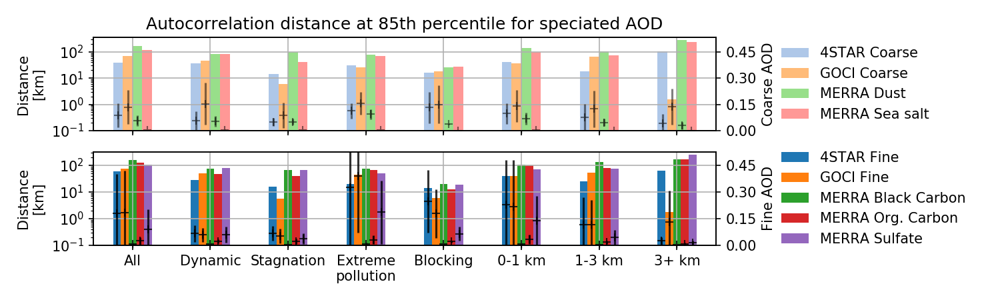

In [265]:
fig, ax = plt.subplots(2,1,sharex=True,figsize=(10,3))

y1_lbl = ['aod_coarse','GOCI_AOD_c','MERRA_AOD_dust','MERRA_AOD_sea']
b1 = pd_fold.plot(x='types',
        kind='bar',
        stacked=False,
        title='Autocorrelation distance at 85th percentile for speciated AOD',
        ax=ax[0],grid=True,logy=True,rot=0,color=cl_list[1::2],
        y=y1_lbl)

b1x = np.reshape([rect.get_x()+rect.get_width()/2.0 for rect in b1.patches],(len(y1_lbl),len(types)))
b1c = [rect.get_facecolor() for ir,rect in enumerate(b1.patches) if ir%len(types)==0]
b1x2 = b1.twinx()
for iy, lbl in enumerate(y1_lbl):
    #b1x2.plot(b1x[iy,:],mean_vals[lbl],'^',color='k',markersize=8)
    b1x2.errorbar(b1x[iy,:],mean_vals[lbl],yerr=std_vals[lbl],marker='+',color='k',alpha=0.5,ls='None')
    
b1x2.set_ylabel('Coarse AOD')
match_ygrid(b1,b1x2,np.linspace(0,0.45,4))

ax[0].legend(['4STAR Coarse','GOCI Coarse','MERRA Dust','MERRA Sea salt'],
             frameon=False,loc='center left', bbox_to_anchor=(1.085, 0.5))
ax[0].set_yticks([0.1,1,10,100])
ax[0].set_ylabel('Distance\n[km]')

y2_lbl = ['aod_fine','GOCI_AOD_f','MERRA_AOD_bc','MERRA_AOD_oc','MERRA_AOD_sulf']
b2 = pd_fold.plot(x='types',
        kind='bar',
        stacked=False,
        ax=ax[1],grid=True,logy=True,rot=0,color=cl_list[0::2],
        y=y2_lbl)


b2x = np.reshape([rect.get_x()+rect.get_width()/2.0 for rect in b2.patches],(len(y2_lbl),len(types)))
b2c = [rect.get_facecolor() for ir,rect in enumerate(b2.patches) if ir%len(types)==0]
b2x2 = b2.twinx()
for iy, lbl in enumerate(y2_lbl):
    b2x2.errorbar(b2x[iy,:],mean_vals[lbl],yerr=std_vals[lbl],marker='+',color='k',alpha=0.8,ls='None')
    
b2x2.set_ylabel('Fine AOD')
match_ygrid(b2,b2x2,np.linspace(0,0.45,4))
ax[1].legend(['4STAR Fine','GOCI Fine','MERRA Black Carbon','MERRA Org. Carbon','MERRA Sulfate'],
             frameon=False,loc='center left', bbox_to_anchor=(1.085, 0.5))
ax[1].set_yticks([0.1,1,10,100])
ax[1].set_ylabel('Distance\n[km]')
ax[1].set_xlabel('')
#ax[0].legend(['GOCI Coarse','GOCI Fine','MERRA Black Carbon','MERRA Dust',
#           'MERRA Org. Carbon','MERRA Sea salt','MERRA Sulfate','4STAR Coarse','4STAR Fine'],
#          frameon=False,loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout(h_pad=0.5,w_pad=-12)
match_ygrid(b2,b2x2,np.linspace(0,0.45,4))
match_ygrid(b1,b1x2,np.linspace(0,0.45,4))
plt.savefig(fp+'plot/KORUS_autocorr_percentile_speciated_AOD_withAODavgs_{}.png'.format(vv+'b'),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


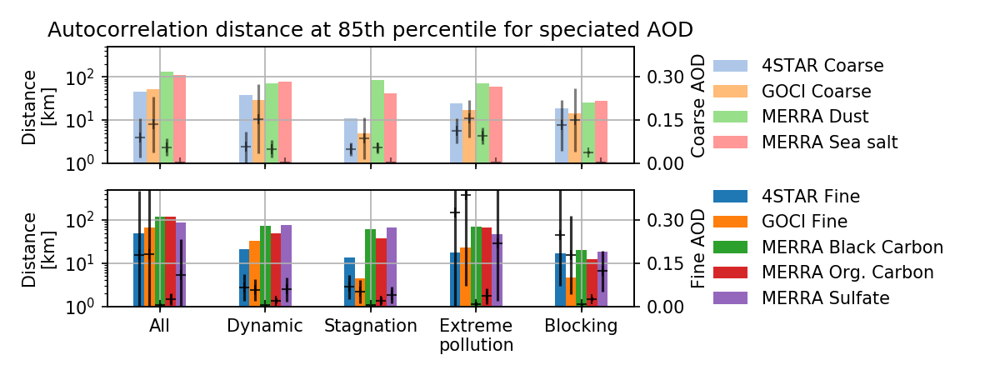

In [268]:
fig, ax = plt.subplots(2,1,sharex=True,figsize=(8,3))

y1_lbl = ['aod_coarse','GOCI_AOD_c','MERRA_AOD_dust','MERRA_AOD_sea']
b1 = pd_fold.iloc[0:5].plot(x='types',
        kind='bar',
        stacked=False,
        title='Autocorrelation distance at 85th percentile for speciated AOD',
        ax=ax[0],grid=True,logy=True,rot=0,color=cl_list[1::2],
        y=y1_lbl)

b1x = np.reshape([rect.get_x()+rect.get_width()/2.0 for rect in b1.patches],(len(y1_lbl),len(types[0:5])))
b1c = [rect.get_facecolor() for ir,rect in enumerate(b1.patches) if ir%len(types)==0]
b1x2 = b1.twinx()
for iy, lbl in enumerate(y1_lbl):
    #b1x2.plot(b1x[iy,:],mean_vals[lbl],'^',color='k',markersize=8)
    b1x2.errorbar(b1x[iy,:],mean_vals[lbl][0:5],yerr=std_vals[lbl][0:5],marker='+',color='k',alpha=0.5,ls='None')
    
b1x2.set_ylabel('Coarse AOD')
match_ygrid(b1,b1x2,np.linspace(0,0.45,4))

ax[0].legend(['4STAR Coarse','GOCI Coarse','MERRA Dust','MERRA Sea salt'],
             frameon=False,loc='center left', bbox_to_anchor=(1.12, 0.5))
ax[0].set_yticks([1,10,100])
ax[0].set_ylim([1,500])
ax[0].set_ylabel('Distance\n[km]')

y2_lbl = ['aod_fine','GOCI_AOD_f','MERRA_AOD_bc','MERRA_AOD_oc','MERRA_AOD_sulf']
b2 = pd_fold.iloc[0:5].plot(x='types',
        kind='bar',
        stacked=False,
        ax=ax[1],grid=True,logy=True,rot=0,color=cl_list[0::2],
        y=y2_lbl)


b2x = np.reshape([rect.get_x()+rect.get_width()/2.0 for rect in b2.patches],(len(y2_lbl),len(types[0:5])))
b2c = [rect.get_facecolor() for ir,rect in enumerate(b2.patches) if ir%len(types)==0]
b2x2 = b2.twinx()
for iy, lbl in enumerate(y2_lbl):
    b2x2.errorbar(b2x[iy,:],mean_vals[lbl][0:5],yerr=std_vals[lbl][0:5],marker='+',color='k',alpha=0.8,ls='None')
    
b2x2.set_ylabel('Fine AOD')
match_ygrid(b2,b2x2,np.linspace(0,0.45,4))
ax[1].legend(['4STAR Fine','GOCI Fine','MERRA Black Carbon','MERRA Org. Carbon','MERRA Sulfate'],
             frameon=False,loc='center left', bbox_to_anchor=(1.12, 0.5))
ax[1].set_yticks([1,10,100])
ax[1].set_ylim([1,500])
ax[1].set_ylabel('Distance\n[km]')
ax[1].set_xlabel('')
#ax[0].legend(['GOCI Coarse','GOCI Fine','MERRA Black Carbon','MERRA Dust',
#           'MERRA Org. Carbon','MERRA Sea salt','MERRA Sulfate','4STAR Coarse','4STAR Fine'],
#          frameon=False,loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.tight_layout(h_pad=0.5,w_pad=-12)
match_ygrid(b2,b2x2,np.linspace(0,0.45,4))
match_ygrid(b1,b1x2,np.linspace(0,0.45,4))
plt.savefig(fp+'plot/KORUS_autocorr_percentile_speciated_AOD_withAODavgs_mc_{}.png'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_percentile_speciated_AOD_withAODavgs_mc_{}.pdf'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_percentile_speciated_AOD_withAODavgs_mc_{}.eps'.format(vv+'b'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_autocorr_percentile_speciated_AOD_withAODavgs_mc_{}.svg'.format(vv+'b'),dpi=600,transparent=True)

### Save autocorr and monte carlo calculations to file

In [269]:
dat_c = { u'mean_vals':mean_vals,u'std_vals':std_vals,u'dvals':dvals,
        u'vals':vals,u'types':types,
        u'itypes':itypes,u'corr_ks':corr_ks,u'autocorr_mean':autocorr_mean}

In [270]:
dat_u = wu.iterate_dict_unicode(dat_c)

('no', u'autocorr_mean')
('no', u'mean_vals')
('no', u'corr_ks')
('no', u'dvals')
itypes
('no', u'vals')
('no', u'std_vals')
types


In [525]:
hs.savemat(fp+'KORUS_fine_coarse_autocorr_dvals_{}.mat'.format(vv),dat_u)

### load autocorr and monte carlo calc

In [176]:
dat_u = hs.loadmat(fp+'KORUS_fine_coarse_autocorr_dvals_{}.mat'.format(vv))

In [177]:
dat_u.keys()

[u'mean_vals',
 u'corr_ks',
 u'autocorr_mean',
 u'std_vals',
 u'dvals',
 u'vals',
 u'types']

In [271]:
corr_ks = dat_u['corr_ks']
dvals = dat_u['dvals']
itypes = dat_u['itypes']

In [ ]:
autocorr_mean = dat_u['autocorr_mean']

### get value of percentile of the autocorr

In [177]:
j = 0
jj = 3

In [17]:
percentile_autocorr(autocorr_mean['GOCI_AE'][j,jj:],0.85)

1.35

In [18]:
percentile_autocorr(autocorr_mean['situ_ae'][j,jj:],0.85)

0.18

In [19]:
np.mean([25.0,25.0,15.0,1.35])

16.5875

In [20]:
percentile_autocorrj = lambda x,p,jj: corr_ks[np.argmin(abs(x[jj]*p-x))+jj]

In [21]:
np.nanmedian([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.85,jj)])

45.0

In [22]:
np.nanmean([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:],0.85,jj+3),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:],0.85,jj+3),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.85,jj)])

83.75

In [23]:
np.nanstd([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:],0.85,jj+3),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:],0.85,jj+3),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.85,jj)])

54.47189642375231

In [24]:
np.nanstd([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.9,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:],0.9,jj+3),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:],0.9,jj+3),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.9,jj)])

61.01677535727367

In [25]:
np.nanstd([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.63,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:],0.63,jj+3),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:],0.63,jj+3),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.63,jj)])

40.67785023818245

In [42]:
for dx in [0.63,0.85,0.9]:
    mdx =  np.nanmean([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],dx,jj),
                percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],dx,jj)])
    mi_dx =  np.nanmean([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:]-autocorr_dm['aod0500'][j,jj:],dx,jj),
                percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:]-autocorr_dm['MERRA_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:]-autocorr_dm['GOCI_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:]-autocorr_dm['situ_ext'][j,jj:],dx,jj)])
    mp_dx =  np.nanmean([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:]+autocorr_dm['aod0500'][j,jj:],dx,jj),
                percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:]+autocorr_dm['MERRA_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:]+autocorr_dm['GOCI_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:]+autocorr_dm['situ_ext'][j,jj:],dx,jj)])
    mis_dx =  np.nanstd([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:]-autocorr_dm['aod0500'][j,jj:],dx,jj),
                percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:]-autocorr_dm['MERRA_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:]-autocorr_dm['GOCI_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:]-autocorr_dm['situ_ext'][j,jj:],dx,jj)])
    mps_dx =  np.nanstd([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:]+autocorr_dm['aod0500'][j,jj:],dx,jj),
                percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj+3:]+autocorr_dm['MERRA_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj+3:]+autocorr_dm['GOCI_AOD'][j,jj+3:],dx,jj+3),
                percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:]+autocorr_dm['situ_ext'][j,jj:],dx,jj)])
    print(dx,mdx,mi_dx,mp_dx,mp_dx-mi_dx,mis_dx,mps_dx,mps_dx-mis_dx)

(0.63, 145.0, 128.75, 145.0, 16.25, 54.12658773652741, 25.98076211353316, -28.145825622994252)
(0.85, 72.5, 93.75, 111.25, 17.5, 51.644820650284, 55.494932201057786, 3.8501115507737893)
(0.9, 54.5, 66.25, 111.25, 45.0, 57.26855594477654, 55.494932201057786, -1.7736237437187512)


In [39]:
autocorr_mean['aod0500'][j,jj:]-autocorr_dm['aod0500'][j,jj:]

array([ 0.90876071,  0.92444789,  0.92050553,  0.91592945,  0.91453208,
        0.91146486,  0.90416794,  0.89147598,  0.87984812,  0.87342283,
        0.8541154 ,  0.82619709,  0.79815587,  0.78377064,  0.77731662,
        0.67258289, -2.17067773, -7.02826847])

In [40]:
autocorr_mean['aod0500'][j,jj:]+autocorr_dm['aod0500'][j,jj:]

array([1.03733354, 1.03501582, 1.0334921 , 1.0354679 , 1.03289302,
       1.03084536, 1.0283483 , 1.02391136, 1.02095937, 1.02011579,
       1.0156712 , 1.01483739, 1.01233866, 1.02082006, 0.99835384,
       0.98132558, 3.43554268, 6.24564569])

In [57]:
np.nanmedian([percentile_autocorrj(autocorr_mean['AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ae'][j,jj:],0.85,jj)])

11.25

In [54]:
np.nanmean([percentile_autocorrj(autocorr_mean['AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ae'][j,jj:],0.85,jj)])

22.625

In [55]:
np.nanstd([percentile_autocorrj(autocorr_mean['AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ae'][j,jj:],0.85,jj)])

24.837912049928836

In [60]:
aod_per85 = np.array([percentile_autocorrj(autocorr_mean['aod0500'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AOD'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AOD'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ext'][j,jj:],0.85,jj)])

In [61]:
ae_per85 = np.array([percentile_autocorrj(autocorr_mean['AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['MERRA_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['GOCI_AE'][j,jj:],0.85,jj),
            percentile_autocorrj(autocorr_mean['situ_ae'][j,jj:],0.85,jj)])

In [64]:
aod_per85.mean(), ae_per85.mean(), np.mean(aod_per85-ae_per85)

(65.0, 22.625, 42.375)

In [65]:
aod_per85-ae_per85

array([50. , 95. , 17.5,  7. ])

In [66]:
aod_per85, ae_per85

(array([ 65., 160.,  25.,  10.]), array([15. , 65. ,  7.5,  3. ]))

In [287]:
j=0
jj=0
for k in ['GOCI_AOD','MERRA_AOD','aod0500','situ_ext']:
    print k, np.nanmean(np.nanstd(autocorr_mc[k][j,jj:-1,:],axis=1))
for k in ['GOCI_AE','MERRA_AE','AE','situ_ae']:
    print k, np.nanmean(np.nanstd(autocorr_mc[k][j,jj:-1,:],axis=1))

GOCI_AOD 0.45314885165883145
MERRA_AOD 0.11886878664751284
aod0500 0.2728785332164779
situ_ext 0.3006847702428752
GOCI_AE 1.7495306278793532
MERRA_AE 0.8546268104868144
AE 0.40523847739978436
situ_ae 0.0897343512990753


# Make supporting plots of AOD comparisons (Appendix B)

## Plot the comparison of GOCI to 4STAR AOD

<IPython.core.display.Javascript object>


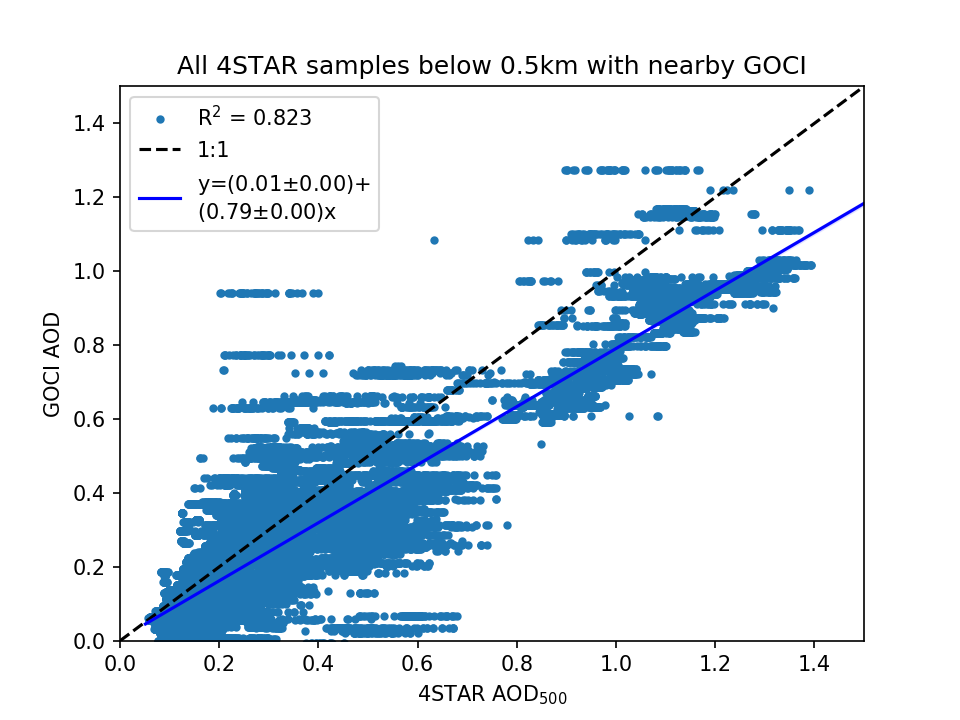

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,1,'All 4STAR samples below 0.5km with nearby GOCI')

In [459]:
plt.figure()
fla = ar['fl_QA'] & (ar['GPS_Alt']<500.0)
flan = ar['fl_QA'] & (ar['GPS_Alt']<500.0) & np.isfinite(ar['AOD0501']) & np.isfinite(goci2ar['aod'])
r = np.corrcoef(ar['AOD0501'][flan],goci2ar['aod'][flan])[0,1]**2.0
plt.plot(ar['AOD0501'][fla],goci2ar['aod'][fla],'.',label='R$^2$ = {:1.3f}'.format(r))
plt.xlim(0,1.5)
plt.ylim(0,1.5)
plt.xlabel('4STAR AOD$_{{500}}$')
plt.ylabel('GOCI AOD')
plt.plot([0,1.5],[0,1.5],'--k',label='1:1')
pu.plot_lin(ar['AOD0501'][fla],goci2ar['aod'][fla],x_err=ar['UNCAOD0501'][fla],labels=True,shaded_ci=True,ci=95)

plt.legend()
plt.title('All 4STAR samples below 0.5km with nearby GOCI')

In [41]:
fla = ar['fl_QA'] & (ar['GPS_Alt']<500.0)
flan = ar['fl_QA'] & (ar['GPS_Alt']<500.0) & np.isfinite(ar['AOD0501']) & np.isfinite(goci2ar['aod'])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  


In [44]:
len(np.unique(goci2ar['lon'][flan]))

596

In [45]:
nsub = len(np.unique(goci2ar['lon'][flan]))
aod_star = np.zeros((nsub))
aod_goci = np.zeros((nsub))
ae_star = np.zeros((nsub))
ae_goci = np.zeros((nsub))
aod_star_std = np.zeros((nsub))
ae_star_std = np.zeros((nsub))
for j,la in enumerate(np.unique(goci2ar['lat'][flan])):
    ipixel = np.where(goci2ar['lat'][flan]==la)[0]
    aod_goci[j] = np.mean(goci2ar['aod'][flan][ipixel])
    ae_goci[j] = np.mean(goci2ar['AE'][flan][ipixel])
    aod_star[j] = np.mean(ar['AOD0501'][flan][ipixel])
    ae_star[j] = np.mean(angs[flan][ipixel])
    aod_star_std[j] = np.std(ar['AOD0501'][flan][ipixel])
    ae_star_std[j] = np.std(angs[flan][ipixel])
    

In [46]:
nsub = len(np.unique(goci2ar['lon'][flan]))
aod_star = np.zeros((nsub))
aod_goci = np.zeros((nsub))
ae_star = np.zeros((nsub))
ae_goci = np.zeros((nsub))
fmf_star = np.zeros((nsub))
fmf_goci = np.zeros((nsub))
aod_star_std = np.zeros((nsub))
ae_star_std = np.zeros((nsub))
fmf_star_std = np.zeros((nsub))
for j,la in enumerate(np.unique(goci2ar['lat'][flan])):
    ipixel = np.where(goci2ar['lat'][flan]==la)[0]
    aod_goci[j] = np.mean(goci2ar['aod'][flan][ipixel])
    ae_goci[j] = np.mean(goci2ar['AE'][flan][ipixel])
    fmf_goci[j] = np.mean(goci2ar['fmf'][flan][ipixel])
    aod_star[j] = np.mean(ar['AOD0501'][flan][ipixel])
    ae_star[j] = np.mean(angs[flan][ipixel])
    fmf_star[j] = np.mean(fmf['eta'][flan][ipixel])
    aod_star_std[j] = np.std(ar['AOD0501'][flan][ipixel])
    ae_star_std[j] = np.std(angs[flan][ipixel])
    fmf_star_std[j] = np.std(fmf['eta'][flan][ipixel])
    

In [48]:
aod_goci_unc = 0.061+0.184*aod_goci  #from Choi et al. 2018

<IPython.core.display.Javascript object>


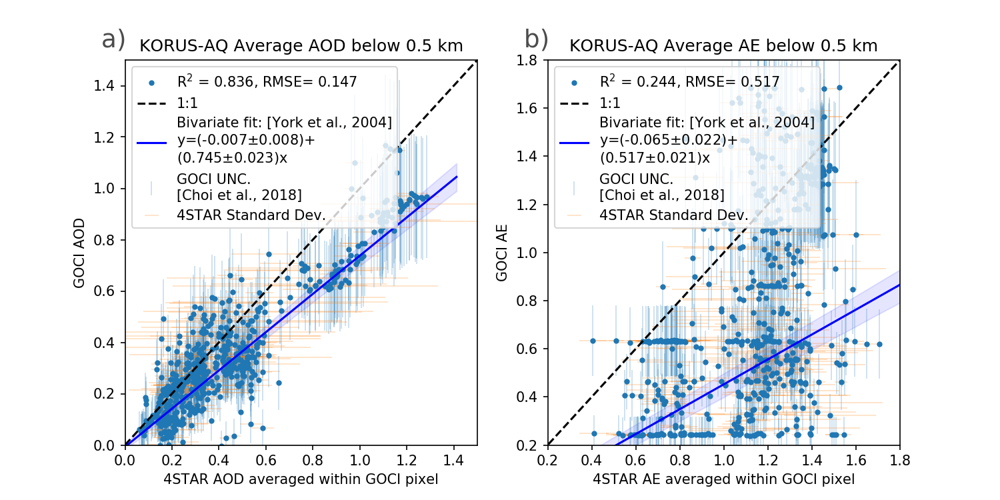

plotting_utils.py:828: RuntimeWarning: divide by zero encountered in divide
  wxi = 1.0 / dxi**2.0


In [49]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
rbin = np.corrcoef(aod_star,aod_goci)[0,1]**2.0
rmse = np.sqrt(np.nanmean((aod_star-aod_goci)**2.0))
ax[0].plot(aod_star,aod_goci,'.',label='R$^2$ = {:1.3f}, RMSE= {:1.3f}'.format(rbin,rmse))
ax[0].errorbar(aod_star,aod_goci,yerr=aod_goci_unc,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:blue',
               label='GOCI UNC.\n[Choi et al., 2018]')
ax[0].errorbar(aod_star,aod_goci,xerr=aod_star_std,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:orange',
               label='4STAR Standard Dev.')

ax[0].plot([0,1.5],[0,1.5],'--k',label='1:1')
pu.plot_lin(np.ma.masked_invalid(aod_star),np.ma.masked_invalid(aod_goci),
            x_err=np.ma.masked_invalid(aod_star_std),y_err=np.ma.masked_invalid(aod_goci_unc),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
ax[0].legend()
ax[0].set_xlim(0,1.5)
ax[0].set_ylim(0,1.5)
ax[0].set_xlabel('4STAR AOD averaged within GOCI pixel')
ax[0].set_ylabel('GOCI AOD')
ax[0].set_title('KORUS-AQ Average AOD below 0.5 km')
pu.sub_note('a)',ax=ax[0],out=True,dx=-0.1)

flae = np.isfinite(ae_star) & np.isfinite(ae_goci)
rbinae = np.corrcoef(ae_star[flae],ae_goci[flae])[0,1]**2.0
rmseae = np.sqrt(np.nanmean((ae_star[flae]-ae_goci[flae])**2.0))
ax[1].plot(ae_star,ae_goci,'.',label='R$^2$ = {:1.3f}, RMSE= {:1.3f}'.format(rbinae,rmseae))
ax[1].plot([0,2.0],[0,2.0],'--k',label='1:1')
ax[1].errorbar(ae_star,ae_goci,yerr=ae_goci*0.184+0.061/2,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:blue',
               label='GOCI UNC.\n[Choi et al., 2018]')
ax[1].errorbar(ae_star,ae_goci,xerr=ae_star_std,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:orange',
               label='4STAR Standard Dev.')
pu.plot_lin(np.ma.masked_invalid(ae_star),np.ma.masked_invalid(ae_goci),
            x_err=np.ma.masked_invalid(ae_star_std),y_err=np.ma.masked_invalid(ae_goci*0.184+0.061/2),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')

#pu.plot_lin(ae_star,ae_goci,x_err=ae_star_std,y_err=ae_goci*0.184+0.061/2,labels=True,shaded_ci=False,ci=95,ax=ax[1],use_method='york')
ax[1].legend()
ax[1].set_ylim(0.2,1.8)
ax[1].set_xlim(0.2,1.8)
ax[1].set_xlabel('4STAR AE averaged within GOCI pixel')
ax[1].set_ylabel('GOCI AE')
ax[1].set_title('KORUS-AQ Average AE below 0.5 km')
pu.sub_note('b)',ax=ax[1],out=True,dx=-0.1)

plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_york{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_york{}.eps'.format('v2'))
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_york{}.pdf'.format('v2'))

<IPython.core.display.Javascript object>


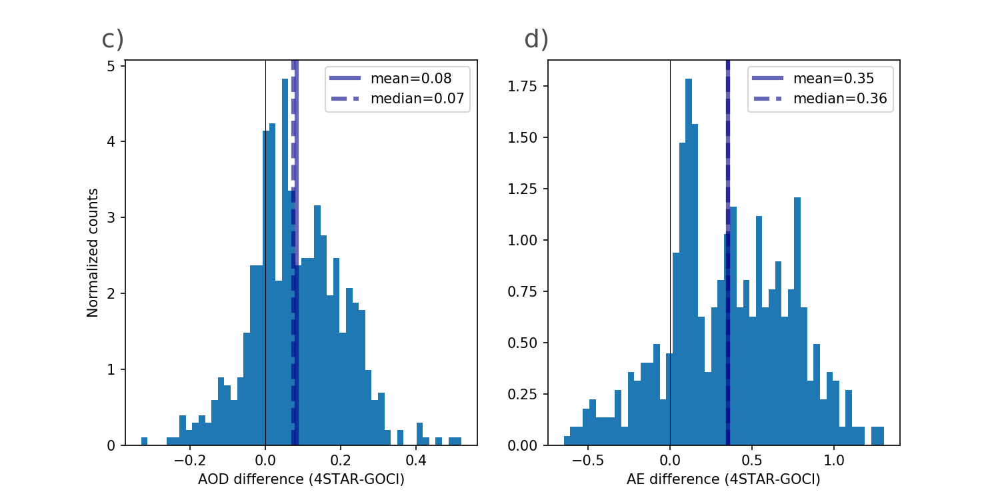

/home/sam/.local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


In [50]:
fig,ax = plt.subplots(1,2,figsize=(10,5))
ax[0].hist(aod_star-aod_goci,bins=50,normed=True)
ax[0].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[0].axvline(np.nanmean(aod_star-aod_goci),ls='-',color='darkblue',alpha=0.6,lw=3,
            label='mean={:2.2f}'.format(np.nanmean(aod_star-aod_goci)))
ax[0].axvline(np.nanmedian(aod_star-aod_goci),ls='--',color='darkblue',alpha=0.6,lw=3,
            label='median={:2.2f}'.format(np.nanmedian(aod_star-aod_goci)))
ax[0].legend()
pu.sub_note('c)',ax=ax[0],out=True,dx=-0.1)

flae = np.isfinite(ae_star) & np.isfinite(ae_goci)
ax[1].hist(ae_star[flae]-ae_goci[flae],bins=50,normed=True)
ax[1].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[1].axvline(np.nanmean(ae_star[flae]-ae_goci[flae]),ls='-',color='darkblue',alpha=0.6,lw=3,
            label='mean={:2.2f}'.format(np.nanmean(ae_star[flae]-ae_goci[flae])))
ax[1].axvline(np.nanmedian(ae_star[flae]-ae_goci[flae]),ls='--',color='darkblue',alpha=0.6,lw=3,
            label='median={:2.2f}'.format(np.nanmedian(ae_star[flae]-ae_goci[flae])))
ax[1].legend()
ax[0].set_xlabel('AOD difference (4STAR-GOCI)')
ax[0].set_ylabel('Normalized counts')
ax[1].set_xlabel('AE difference (4STAR-GOCI)')
pu.sub_note('d)',ax=ax[1],out=True,dx=-0.1)
plt.savefig(fp+'plot/KORUS_hist_diff_GOCI_vs_4STAR_AOD_AE_{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_hist_diff_GOCI_vs_4STAR_AOD_AE_{}.eps'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_hist_diff_GOCI_vs_4STAR_AOD_AE_{}.pdf'.format('v2'),dpi=600,transparent=True)

### Compare GOCI vs 4STAR AOD and AE (Appendix B.1, Fig. B1)

<IPython.core.display.Javascript object>


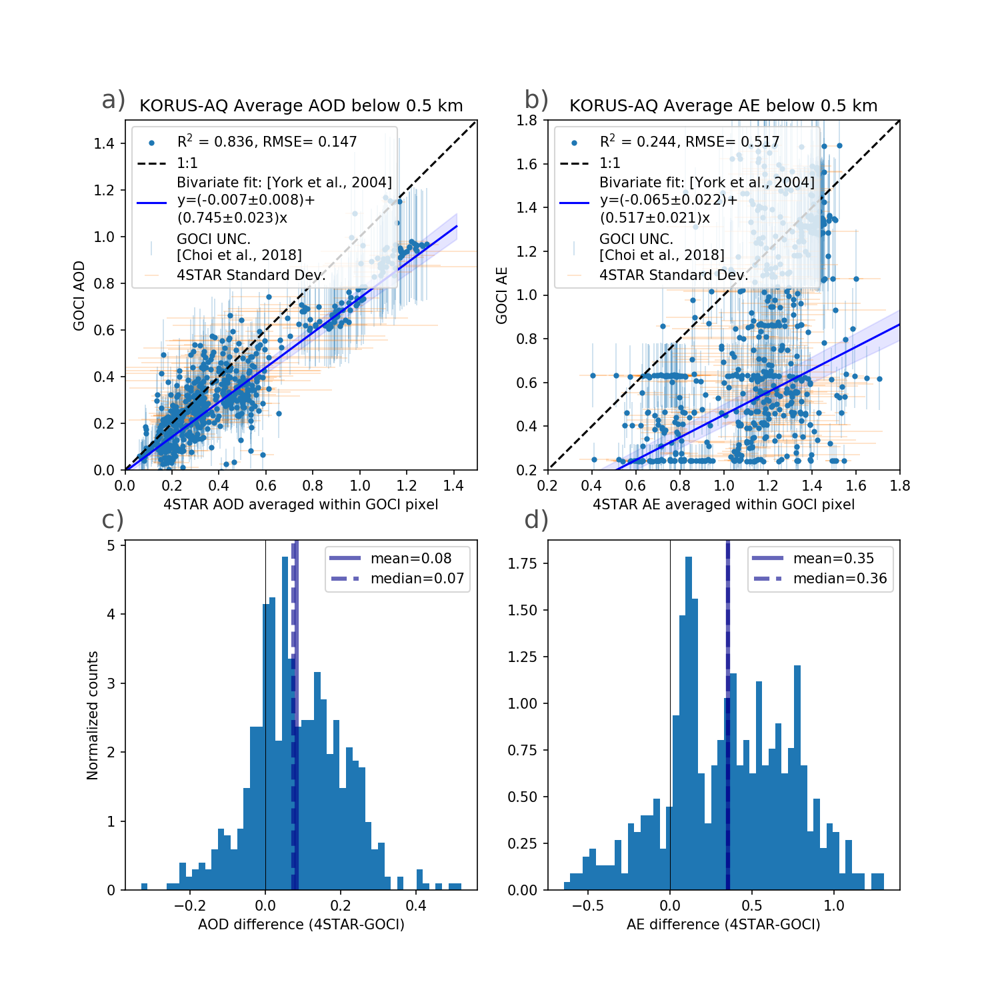

In [55]:
# combined
fig,ax = plt.subplots(2,2,figsize=(10,10))
ax = ax.flatten()
rbin = np.corrcoef(aod_star,aod_goci)[0,1]**2.0
rmse = np.sqrt(np.nanmean((aod_star-aod_goci)**2.0))
ax[0].plot(aod_star,aod_goci,'.',label='R$^2$ = {:1.3f}, RMSE= {:1.3f}'.format(rbin,rmse))
ax[0].errorbar(aod_star,aod_goci,yerr=aod_goci_unc,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:blue',
               label='GOCI UNC.\n[Choi et al., 2018]')
ax[0].errorbar(aod_star,aod_goci,xerr=aod_star_std,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:orange',
               label='4STAR Standard Dev.')

ax[0].plot([0,1.5],[0,1.5],'--k',label='1:1')
pu.plot_lin(np.ma.masked_invalid(aod_star),np.ma.masked_invalid(aod_goci),
            x_err=np.ma.masked_invalid(aod_star_std),y_err=np.ma.masked_invalid(aod_goci_unc),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')
ax[0].legend()
ax[0].set_xlim(0,1.5)
ax[0].set_ylim(0,1.5)
ax[0].set_xlabel('4STAR AOD averaged within GOCI pixel')
ax[0].set_ylabel('GOCI AOD')
ax[0].set_title('KORUS-AQ Average AOD below 0.5 km')
pu.sub_note('a)',ax=ax[0],out=True,dx=-0.1)

flae = np.isfinite(ae_star) & np.isfinite(ae_goci)
rbinae = np.corrcoef(ae_star[flae],ae_goci[flae])[0,1]**2.0
rmseae = np.sqrt(np.nanmean((ae_star[flae]-ae_goci[flae])**2.0))
ax[1].plot(ae_star,ae_goci,'.',label='R$^2$ = {:1.3f}, RMSE= {:1.3f}'.format(rbinae,rmseae))
ax[1].plot([0,2.0],[0,2.0],'--k',label='1:1')
ax[1].errorbar(ae_star,ae_goci,yerr=ae_goci*0.184+0.061/2,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:blue',
               label='GOCI UNC.\n[Choi et al., 2018]')
ax[1].errorbar(ae_star,ae_goci,xerr=ae_star_std,linestyle='None',marker='None',elinewidth=0.2,ecolor='tab:orange',
               label='4STAR Standard Dev.')
pu.plot_lin(np.ma.masked_invalid(ae_star),np.ma.masked_invalid(ae_goci),
            x_err=np.ma.masked_invalid(ae_star_std),y_err=np.ma.masked_invalid(ae_goci*0.184+0.061/2),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],use_method='york',lblfmt='2.3f',label_prefix='Bivariate fit: [York et al., 2004]\n')

#pu.plot_lin(ae_star,ae_goci,x_err=ae_star_std,y_err=ae_goci*0.184+0.061/2,labels=True,shaded_ci=False,ci=95,ax=ax[1],use_method='york')
ax[1].legend()
ax[1].set_ylim(0.2,1.8)
ax[1].set_xlim(0.2,1.8)
ax[1].set_xlabel('4STAR AE averaged within GOCI pixel')
ax[1].set_ylabel('GOCI AE')
ax[1].set_title('KORUS-AQ Average AE below 0.5 km')
pu.sub_note('b)',ax=ax[1],out=True,dx=-0.1)

ax[2].hist(aod_star-aod_goci,bins=50,normed=True)
ax[2].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[2].axvline(np.nanmean(aod_star-aod_goci),ls='-',color='darkblue',alpha=0.6,lw=3,
            label='mean={:2.2f}'.format(np.nanmean(aod_star-aod_goci)))
ax[2].axvline(np.nanmedian(aod_star-aod_goci),ls='--',color='darkblue',alpha=0.6,lw=3,
            label='median={:2.2f}'.format(np.nanmedian(aod_star-aod_goci)))
ax[2].legend()
pu.sub_note('c)',ax=ax[2],out=True,dx=-0.1)

flae = np.isfinite(ae_star) & np.isfinite(ae_goci)
ax[3].hist(ae_star[flae]-ae_goci[flae],bins=50,normed=True)
ax[3].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[3].axvline(np.nanmean(ae_star[flae]-ae_goci[flae]),ls='-',color='darkblue',alpha=0.6,lw=3,
            label='mean={:2.2f}'.format(np.nanmean(ae_star[flae]-ae_goci[flae])))
ax[3].axvline(np.nanmedian(ae_star[flae]-ae_goci[flae]),ls='--',color='darkblue',alpha=0.6,lw=3,
            label='median={:2.2f}'.format(np.nanmedian(ae_star[flae]-ae_goci[flae])))
ax[3].legend()
ax[2].set_xlabel('AOD difference (4STAR-GOCI)')
ax[2].set_ylabel('Normalized counts')
ax[3].set_xlabel('AE difference (4STAR-GOCI)')
pu.sub_note('d)',ax=ax[3],out=True,dx=-0.1)

plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_combined_york{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_combined_york{}.eps'.format('v2'))
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_AE_combined_york{}.pdf'.format('v2'))

### Setup the comparison between land and ocean (Appendix B.1, Fig. B2)

In [37]:

fl_ocean_a = is_in_ocean & (ar['GPS_Alt']<500.0)
fl_land_a = ~is_in_ocean & ar['fl_QA'] & (ar['GPS_Alt']<500.0)

fl_ocean_an = is_in_ocean & (ar['GPS_Alt']<500.0) & np.isfinite(ar['AOD0501']) & np.isfinite(goci2ar['aod'])
fl_land_an = ~is_in_ocean & ar['fl_QA'] & (ar['GPS_Alt']<500.0) & np.isfinite(ar['AOD0501']) & np.isfinite(goci2ar['aod'])

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in less
  after removing the cwd from sys.path.
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in less
  """
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in less
  


<IPython.core.display.Javascript object>


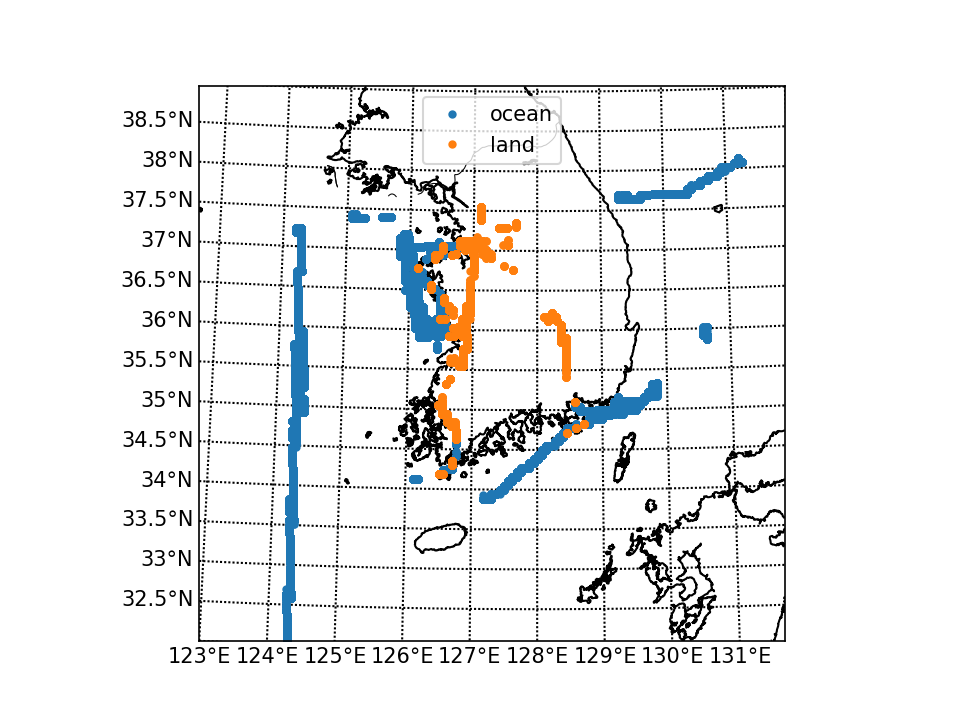

In [40]:
#sanity check of the land-ocean mask
fig,ax = plt.subplots(1,1)
m = make_map(ax)
#m.plot(ar['Longitude'],ar['Latitude'],'.',markersize=0.2,color='tab:blue',latlon=True,label='All data')
#m.plot(ar['Longitude'][fl][f_level],ar['Latitude'][fl][f_level],'.',markersize=0.5,color='tab:red',latlon=True,label='level legs')
#m.plot(s['Lon'][it],s['Lat'][it],'r+',latlon=True)
m.plot(goci2ar['lon'][fl_ocean_an],goci2ar['lat'][fl_ocean_an],'.',label='ocean',latlon=True)
m.plot(goci2ar['lon'][fl_land_an],goci2ar['lat'][fl_land_an],'.',label='land',latlon=True)
plt.legend()

In [471]:
nsub = len(np.unique(goci2ar['lon'][fl_ocean_an]))
aod_star_o = np.zeros((nsub))
aod_goci_o = np.zeros((nsub))
ae_star_o = np.zeros((nsub))
ae_goci_o = np.zeros((nsub))
fmf_star_o = np.zeros((nsub))
fmf_goci_o = np.zeros((nsub))
aod_star_std_o = np.zeros((nsub))
ae_star_std_o = np.zeros((nsub))
fmf_star_std_o = np.zeros((nsub))
for j,la in enumerate(np.unique(goci2ar['lat'][fl_ocean_an])):
    ipixel = np.where(goci2ar['lat'][fl_ocean_an]==la)[0]
    aod_goci_o[j] = np.mean(goci2ar['aod'][fl_ocean_an][ipixel])
    ae_goci_o[j] = np.mean(goci2ar['AE'][fl_ocean_an][ipixel])
    fmf_goci_o[j] = np.mean(goci2ar['fmf'][fl_ocean_an][ipixel])
    aod_star_o[j] = np.mean(ar['AOD0501'][fl_ocean_an][ipixel])
    ae_star_o[j] = np.mean(angs[fl_ocean_an][ipixel])
    fmf_star_o[j] = np.mean(fmf['eta'][fl_ocean_an][ipixel])
    aod_star_std_o[j] = np.std(ar['AOD0501'][fl_ocean_an][ipixel])
    ae_star_std_o[j] = np.std(angs[fl_ocean_an][ipixel])
    fmf_star_std_o[j] = np.std(fmf['eta'][fl_ocean_an][ipixel])

In [474]:
nsub = len(np.unique(goci2ar['lon'][fl_land_an]))
aod_star_l = np.zeros((nsub))
aod_goci_l = np.zeros((nsub))
ae_star_l = np.zeros((nsub))
ae_goci_l = np.zeros((nsub))
fmf_star_l = np.zeros((nsub))
fmf_goci_l = np.zeros((nsub))
aod_star_std_l = np.zeros((nsub))
ae_star_std_l = np.zeros((nsub))
fmf_star_std_l = np.zeros((nsub))
for j,la in enumerate(np.unique(goci2ar['lat'][fl_land_an])):
    ipixel = np.where(goci2ar['lat'][fl_land_an]==la)[0]
    aod_goci_l[j] = np.mean(goci2ar['aod'][fl_land_an][ipixel])
    ae_goci_l[j] = np.mean(goci2ar['AE'][fl_land_an][ipixel])
    fmf_goci_l[j] = np.mean(goci2ar['fmf'][fl_land_an][ipixel])
    aod_star_l[j] = np.mean(ar['AOD0501'][fl_land_an][ipixel])
    ae_star_l[j] = np.mean(angs[fl_land_an][ipixel])
    fmf_star_l[j] = np.mean(fmf['eta'][fl_land_an][ipixel])
    aod_star_std_l[j] = np.std(ar['AOD0501'][fl_land_an][ipixel])
    ae_star_std_l[j] = np.std(angs[fl_land_an][ipixel])
    fmf_star_std_l[j] = np.std(fmf['eta'][fl_land_an][ipixel])

<IPython.core.display.Javascript object>


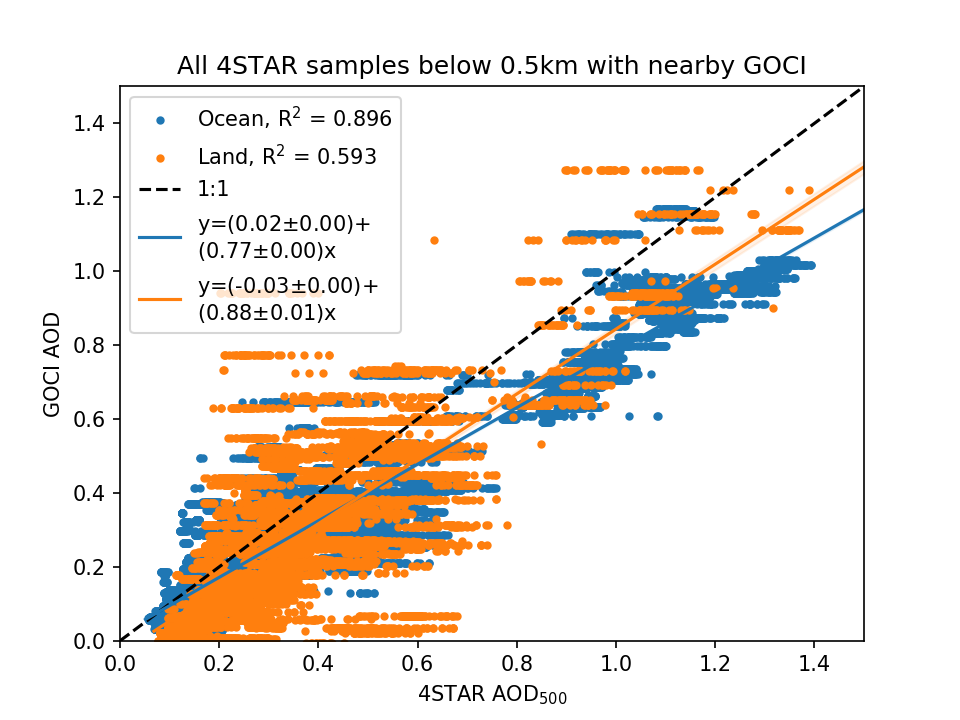

Text(0.5,1,'All 4STAR samples below 0.5km with nearby GOCI')

In [111]:
plt.figure()
r_oc = np.corrcoef(ar['AOD0501'][fl_ocean_an],goci2ar['aod'][fl_ocean_an])[0,1]**2.0
r_ld = np.corrcoef(ar['AOD0501'][fl_land_an],goci2ar['aod'][fl_land_an])[0,1]**2.0

plt.plot(ar['AOD0501'][fl_ocean_a],goci2ar['aod'][fl_ocean_a],'.',label='Ocean, R$^2$ = {:1.3f}'.format(r_oc))
plt.plot(ar['AOD0501'][fl_land_a],goci2ar['aod'][fl_land_a],'.',label='Land, R$^2$ = {:1.3f}'.format(r_ld))
plt.xlim(0,1.5)
plt.ylim(0,1.5)
plt.xlabel('4STAR AOD$_{{500}}$')
plt.ylabel('GOCI AOD')
plt.plot([0,1.5],[0,1.5],'--k',label='1:1')
pu.plot_lin(ar['AOD0501'][fl_ocean_a],goci2ar['aod'][fl_ocean_a],x_err=ar['UNCAOD0501'][fl_ocean_a],labels=True,shaded_ci=True,ci=95,color='tab:blue')
pu.plot_lin(ar['AOD0501'][fl_land_a],goci2ar['aod'][fl_land_a],x_err=ar['UNCAOD0501'][fl_land_a],labels=True,shaded_ci=True,ci=95,color='tab:orange')

plt.legend()
plt.title('All 4STAR samples below 0.5km with nearby GOCI')

In [475]:
aod_fine_star = aod_star * fmf_star
aod_fine_goci = aod_goci * fmf_goci
aod_coarse_star = aod_star * (1.0-fmf_star)
aod_coarse_goci = aod_goci * (1.0-fmf_goci)
aod_fine_star_o = aod_star_o * fmf_star_o
aod_fine_goci_o = aod_goci_o * fmf_goci_o
aod_coarse_star_o = aod_star_o * (1.0-fmf_star_o)
aod_coarse_goci_o = aod_goci_o * (1.0-fmf_goci_o)
aod_fine_star_l = aod_star_l * fmf_star_l
aod_fine_goci_l = aod_goci_l * fmf_goci_l
aod_coarse_star_l = aod_star_l * (1.0-fmf_star_l)
aod_coarse_goci_l = aod_goci_l * (1.0-fmf_goci_l)


In [476]:
aod_fine_star_std = aod_star_std * fmf_star
aod_coarse_star_std = aod_star_std * (1.0-fmf_star)
aod_fine_star_std_o = aod_star_std_o * fmf_star_o
aod_coarse_star_std_o = aod_star_std_o * (1.0-fmf_star_o)
aod_fine_star_std_l = aod_star_std_l * fmf_star_l
aod_coarse_star_std_l = aod_star_std_l * (1.0-fmf_star_l)

<IPython.core.display.Javascript object>


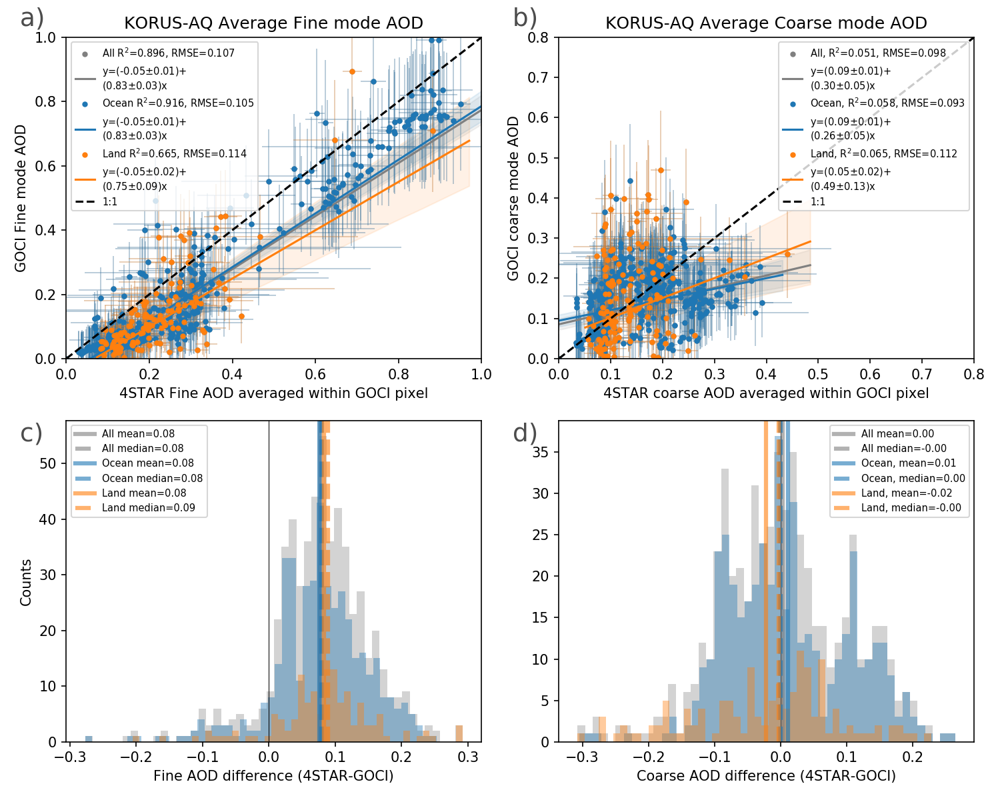

In [478]:
fig,ax = plt.subplots(2,2,figsize=(10,8))
ax = ax.flatten()
lfont=7
fl_f = np.isfinite(aod_fine_star) & np.isfinite(aod_fine_goci)
rbin = np.corrcoef(aod_fine_star[fl_f],aod_fine_goci[fl_f])[0,1]**2.0
rmse = np.sqrt(np.nanmean((aod_fine_star[fl_f]-aod_fine_goci[fl_f])**2.0))
ax[0].plot(aod_fine_star,aod_fine_goci,'.',label='All R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbin,rmse),color='grey')
ax[0].errorbar(aod_fine_star,aod_fine_goci,xerr=aod_fine_star_std,yerr=0.061+0.184*aod_fine_goci,
               marker='None',linestyle='None',elinewidth=0.2,color='grey')
pu.plot_lin(np.ma.masked_invalid(aod_fine_star),np.ma.masked_invalid(aod_fine_goci),
            x_err=np.ma.masked_invalid(aod_fine_star_std),y_err=np.ma.masked_invalid(0.061+0.184*aod_fine_goci),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],color='grey',use_method='york')

fl_f_o = np.isfinite(aod_fine_star_o) & np.isfinite(aod_fine_goci_o)
rbin_o = np.corrcoef(aod_fine_star_o[fl_f_o],aod_fine_goci_o[fl_f_o])[0,1]**2.0
rmse_o = np.sqrt(np.nanmean((aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o])**2.0))
ax[0].plot(aod_fine_star_o,aod_fine_goci_o,'.',label='Ocean R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbin_o,rmse_o),color='tab:blue')
ax[0].errorbar(aod_fine_star_o,aod_fine_goci_o,xerr=aod_fine_star_std_o,yerr=0.061+0.184*aod_fine_goci_o,
               marker='None',linestyle='None',elinewidth=0.2,color='tab:blue')
pu.plot_lin(np.ma.masked_invalid(aod_fine_star_o),np.ma.masked_invalid(aod_fine_goci_o),
            x_err=np.ma.masked_invalid(aod_fine_star_std_o),y_err=np.ma.masked_invalid(0.061+0.184*aod_fine_goci_o),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],color='tab:blue',use_method='york')

fl_f_l = np.isfinite(aod_fine_star_l) & np.isfinite(aod_fine_goci_l)
rbin_l = np.corrcoef(aod_fine_star_l[fl_f_l],aod_fine_goci_l[fl_f_l])[0,1]**2.0
rmse_l = np.sqrt(np.nanmean((aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l])**2.0))
ax[0].plot(aod_fine_star_l,aod_fine_goci_l,'.',label='Land R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbin_l,rmse_l),color='tab:orange')
ax[0].errorbar(aod_fine_star_l,aod_fine_goci_l,xerr=aod_fine_star_std_l,yerr=0.061+0.184*aod_fine_goci_l,
               marker='None',linestyle='None',elinewidth=0.2,color='tab:orange')
pu.plot_lin(np.ma.masked_invalid(aod_fine_star_l),np.ma.masked_invalid(aod_fine_goci_l),
            x_err=np.ma.masked_invalid(aod_fine_star_std_l),y_err=np.ma.masked_invalid(0.061+0.184*aod_fine_goci_l),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],color='tab:orange',use_method='york')


ax[0].plot([0,1.0],[0,1.0],'--k',label='1:1')
ax[0].legend(fontsize=lfont)
ax[0].set_xlim(0,1.0)
ax[0].set_ylim(0,1.0)
ax[0].set_xlabel('4STAR Fine AOD averaged within GOCI pixel')
ax[0].set_ylabel('GOCI Fine mode AOD')
ax[0].set_title('KORUS-AQ Average Fine mode AOD')
pu.sub_note('a)',ax=ax[0],out=True,dx=-0.14)

fl_c = np.isfinite(aod_coarse_star) & np.isfinite(aod_coarse_goci)
rbinc = np.corrcoef(aod_coarse_star[fl_c],aod_coarse_goci[fl_c])[0,1]**2.0
rmsec = np.sqrt(np.nanmean((aod_coarse_star[fl_c]-aod_coarse_goci[fl_c])**2.0))
ax[1].plot(aod_coarse_star,aod_coarse_goci,'.',label='All, R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbinc,rmsec),color='grey')
ax[1].errorbar(aod_coarse_star,aod_coarse_goci,xerr=aod_coarse_star_std,yerr=0.061+0.184*aod_coarse_goci,
               marker='None',linestyle='None',elinewidth=0.2,color='grey')
pu.plot_lin(np.ma.masked_invalid(aod_coarse_star),np.ma.masked_invalid(aod_coarse_goci),
            x_err=np.ma.masked_invalid(aod_coarse_star_std),y_err=np.ma.masked_invalid(0.061+0.184*aod_coarse_goci),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],color='grey',use_method='york')

fl_c_o = np.isfinite(aod_coarse_star_o) & np.isfinite(aod_coarse_goci_o)
rbinc_o = np.corrcoef(aod_coarse_star_o[fl_c_o],aod_coarse_goci_o[fl_c_o])[0,1]**2.0
rmsec_o = np.sqrt(np.nanmean((aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o])**2.0))
ax[1].plot(aod_coarse_star_o,aod_coarse_goci_o,'.',label='Ocean, R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbinc_o,rmsec_o),color='tab:blue')
ax[1].errorbar(aod_coarse_star_o,aod_coarse_goci_o,xerr=aod_coarse_star_std_o,yerr=0.061+0.184*aod_coarse_goci_o,
               marker='None',linestyle='None',elinewidth=0.2,color='tab:blue')
pu.plot_lin(np.ma.masked_invalid(aod_coarse_star_o),np.ma.masked_invalid(aod_coarse_goci_o),
            x_err=np.ma.masked_invalid(aod_coarse_star_std_o),y_err=np.ma.masked_invalid(0.061+0.184*aod_coarse_goci_o),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],color='tab:blue',use_method='york')

fl_c_l = np.isfinite(aod_coarse_star_l) & np.isfinite(aod_coarse_goci_l)
rbinc_l = np.corrcoef(aod_coarse_star_l[fl_c_l],aod_coarse_goci_l[fl_c_l])[0,1]**2.0
rmsec_l = np.sqrt(np.nanmean((aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l])**2.0))
ax[1].plot(aod_coarse_star_l,aod_coarse_goci_l,'.',label='Land, R$^2$={:1.3f}, RMSE={:1.3f}'.format(rbinc_l,rmsec_l),color='tab:orange')
ax[1].errorbar(aod_coarse_star_l,aod_coarse_goci_l,xerr=aod_coarse_star_std_l,yerr=0.061+0.184*aod_coarse_goci_l,
               marker='None',linestyle='None',elinewidth=0.2,color='tab:orange')
pu.plot_lin(np.ma.masked_invalid(aod_coarse_star_l),np.ma.masked_invalid(aod_coarse_goci_l),
            x_err=np.ma.masked_invalid(aod_coarse_star_std_l),y_err=np.ma.masked_invalid(0.061+0.184*aod_coarse_goci_l),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],color='tab:orange',use_method='york')

ax[1].plot([0,0.8],[0,0.8],'--k',label='1:1')
ax[1].legend(fontsize=lfont)
ax[1].set_xlim(0,0.8)
ax[1].set_ylim(0,0.8)
ax[1].set_xlabel('4STAR coarse AOD averaged within GOCI pixel')
ax[1].set_ylabel('GOCI coarse mode AOD')
ax[1].set_title('KORUS-AQ Average Coarse mode AOD')
pu.sub_note('b)',ax=ax[1],out=True,dx=-0.14)


ax[2].hist(aod_fine_star[fl_f]-aod_fine_goci[fl_f],bins=50,normed=False,color='lightgrey')
ax[2].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[2].axvline(np.nanmean(aod_fine_star[fl_f]-aod_fine_goci[fl_f]),ls='-',color='grey',alpha=0.6,lw=3,
            label='All mean={:2.2f}'.format(np.nanmean(aod_fine_star[fl_f]-aod_fine_goci[fl_f])))
ax[2].axvline(np.nanmedian(aod_fine_star[fl_f]-aod_fine_goci[fl_f]),ls='--',color='grey',alpha=0.6,lw=3,
            label='All median={:2.2f}'.format(np.nanmedian(aod_fine_star[fl_f]-aod_fine_goci[fl_f])))

ax[2].hist(aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o],bins=50,normed=False,color='tab:blue',alpha=0.4)
ax[2].axvline(np.nanmean(aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o]),ls='-',color='tab:blue',alpha=0.6,lw=3,
            label='Ocean mean={:2.2f}'.format(np.nanmean(aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o])))
ax[2].axvline(np.nanmedian(aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o]),ls='--',color='tab:blue',alpha=0.6,lw=3,
            label='Ocean median={:2.2f}'.format(np.nanmedian(aod_fine_star_o[fl_f_o]-aod_fine_goci_o[fl_f_o])))

ax[2].hist(aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l],bins=50,normed=False,color='tab:orange',alpha=0.4)
ax[2].axvline(np.nanmean(aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l]),ls='-',color='tab:orange',alpha=0.6,lw=3,
            label='Land mean={:2.2f}'.format(np.nanmean(aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l])))
ax[2].axvline(np.nanmedian(aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l]),ls='--',color='tab:orange',alpha=0.6,lw=3,
            label='Land median={:2.2f}'.format(np.nanmedian(aod_fine_star_l[fl_f_l]-aod_fine_goci_l[fl_f_l])))
ax[2].legend(fontsize=lfont)
pu.sub_note('c)',ax=ax[2],out=True,dx=-0.14,dy=-0.1)

ax[3].hist(aod_coarse_star[fl_c]-aod_coarse_goci[fl_c],bins=50,normed=False,color='lightgrey')
ax[3].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[3].axvline(np.nanmean(aod_coarse_star[fl_c]-aod_coarse_goci[fl_c]),ls='-',color='grey',alpha=0.6,lw=3,
            label='All mean={:2.2f}'.format(np.nanmean(aod_coarse_star[fl_c]-aod_coarse_goci[fl_c])))
ax[3].axvline(np.nanmedian(aod_coarse_star[fl_c]-aod_coarse_goci[fl_c]),ls='--',color='grey',alpha=0.6,lw=3,
            label='All median={:2.2f}'.format(np.nanmedian(aod_coarse_star[fl_c]-aod_coarse_goci[fl_c])))
ax[3].hist(aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o],bins=50,normed=False,color='tab:blue',alpha=0.4)
ax[3].axvline(np.nanmean(aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o]),ls='-',color='tab:blue',alpha=0.6,lw=3,
            label='Ocean, mean={:2.2f}'.format(np.nanmean(aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o])))
ax[3].axvline(np.nanmedian(aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o]),ls='--',color='tab:blue',alpha=0.6,lw=3,
            label='Ocean, median={:2.2f}'.format(np.nanmedian(aod_coarse_star_o[fl_c_o]-aod_coarse_goci_o[fl_c_o])))
ax[3].hist(aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l],bins=50,normed=False,color='tab:orange',alpha=0.4)
ax[3].axvline(np.nanmean(aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l]),ls='-',color='tab:orange',alpha=0.6,lw=3,
            label='Land, mean={:2.2f}'.format(np.nanmean(aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l])))
ax[3].axvline(np.nanmedian(aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l]),ls='--',color='tab:orange',alpha=0.6,lw=3,
            label='Land, median={:2.2f}'.format(np.nanmedian(aod_coarse_star_l[fl_c_l]-aod_coarse_goci_l[fl_c_l])))
ax[3].legend(fontsize=lfont)
ax[2].set_xlabel('Fine AOD difference (4STAR-GOCI)')
ax[2].set_ylabel('Counts')
ax[3].set_xlabel('Coarse AOD difference (4STAR-GOCI)')
pu.sub_note('d)',ax=ax[3],out=True,dx=-0.14,dy=-0.1)

plt.tight_layout()

plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_fine_coarse_york{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_fine_coarse_york{}.eps'.format('v2'))
plt.savefig(fp+'plot/KORUS_GOCI_vs_4STAR_AOD_fine_coarse_york{}.pdf'.format('v2'))

## Compare MERRA2 AOD to 4STAR (Appendix B.2, Fig. B3)

<IPython.core.display.Javascript object>


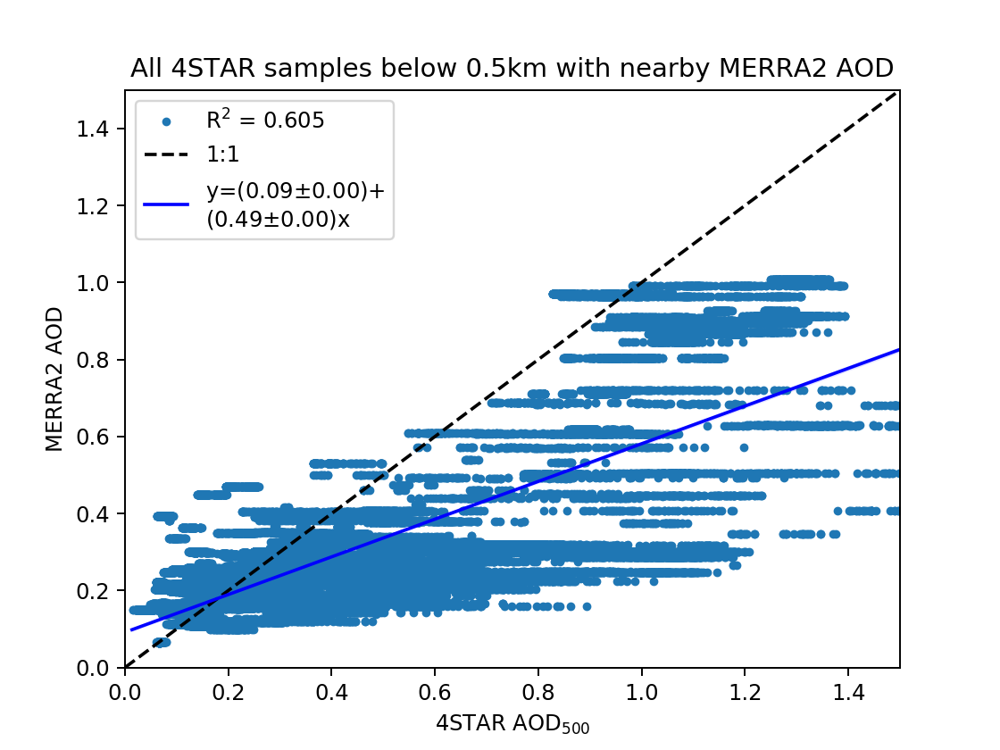

/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in less
  
/home/sam/.local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0.5,1,'All 4STAR samples below 0.5km with nearby MERRA2 AOD')

In [385]:
plt.figure()
fla = ar['fl_QA'] & (ar['GPS_Alt']<500.0)
flan = ar['fl_QA'] & (ar['GPS_Alt']<500.0) & np.isfinite(ar['AOD0501']) & np.isfinite(merra2ar['aod'])
r = np.corrcoef(ar['AOD0501'][flan],merra2ar['aod'][flan])[0,1]**2.0
plt.plot(ar['AOD0501'][fla],merra2ar['aod'][fla],'.',label='R$^2$ = {:1.3f}'.format(r))
plt.xlim(0,1.5)
plt.ylim(0,1.5)
plt.xlabel('4STAR AOD$_{{500}}$')
plt.ylabel('MERRA2 AOD')
plt.plot([0,1.5],[0,1.5],'--k',label='1:1')
pu.plot_lin(ar['AOD0501'][fla],merra2ar['aod'][fla],x_err=ar['UNCAOD0501'][fla],labels=True,shaded_ci=True,ci=95)

plt.legend()
plt.title('All 4STAR samples below 0.5km with nearby MERRA2 AOD')

In [386]:
nsub = len(np.unique(merra2ar['ind'][flan]))
aod_star_m = np.zeros((nsub))
aod_merra = np.zeros((nsub))
aod_star_m_std = np.zeros((nsub))
ae_star_m = np.zeros((nsub))
ae_merra = np.zeros((nsub))
ae_star_m_std = np.zeros((nsub))
for j,la in enumerate(np.unique(merra2ar['ind'][flan])):
    ipixel = np.where(merra2ar['ind'][flan]==la)[0]
    aod_merra[j] = np.mean(merra2ar['aod'][flan][ipixel])
    aod_star_m[j] = np.mean(ar['AOD0501'][flan][ipixel])
    aod_star_m_std[j] = np.std(ar['AOD0501'][flan][ipixel])
    ae_merra[j] = np.mean(merra2ar['ae'][flan][ipixel])
    ae_star_m[j] = np.mean(angs[flan][ipixel])
    ae_star_m_std[j] = np.std(angs[flan][ipixel])

<IPython.core.display.Javascript object>


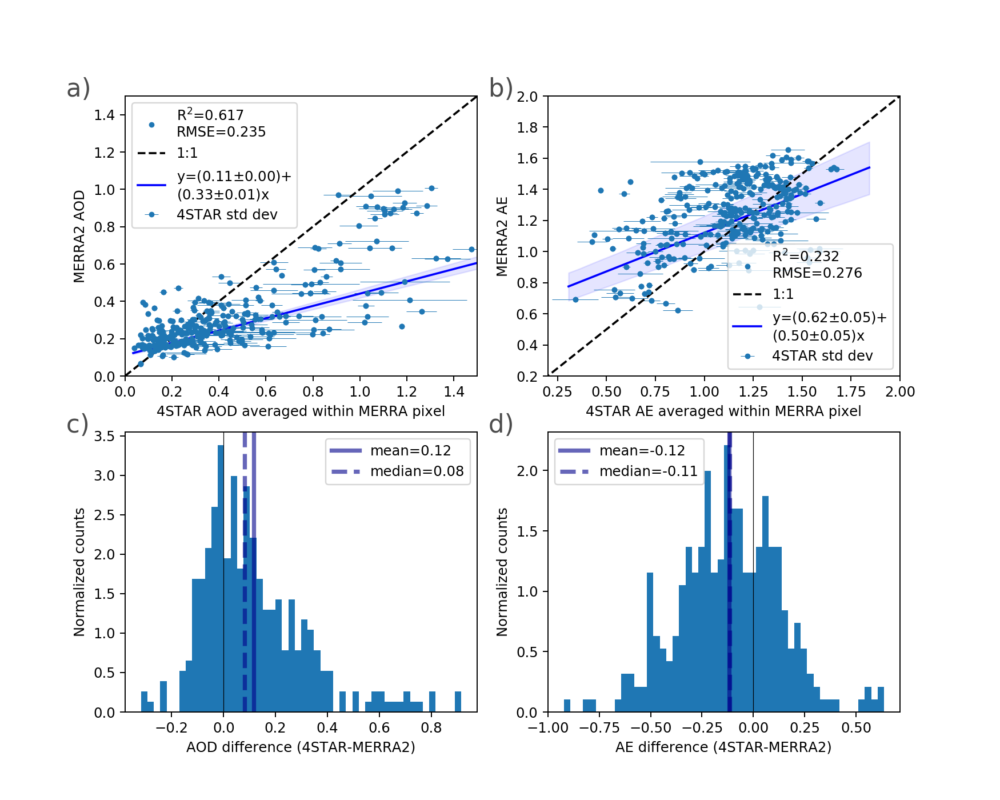

In [392]:
fig,ax = plt.subplots(2,2,figsize=(10,8))
ax = ax.flatten()

flae = np.isfinite(aod_star_m) & np.isfinite(aod_merra)
rbinae = np.corrcoef(aod_star_m[flae],aod_merra[flae])[0,1]**2.0
rmseae = np.sqrt(np.nanmean((aod_star_m[flae]-aod_merra[flae])**2.0))
ax[0].plot(aod_star_m,aod_merra,'.',label='R$^2$={:1.3f}\nRMSE={:1.3f}'.format(rbinae,rmseae),color='tab:blue')
ax[0].errorbar(aod_star_m,aod_merra,xerr=aod_star_m_std,color='tab:blue',marker='.',ls='None',elinewidth=0.4,label='4STAR std dev')
ax[0].plot([0,2.0],[0,2.0],'--k',label='1:1')
pu.plot_lin(np.ma.masked_invalid(aod_star_m),np.ma.masked_invalid(aod_merra),
            x_err=np.ma.masked_invalid(aod_star_m_std),y_err=np.ma.masked_invalid(aod_merra*0.2),
            labels=True,shaded_ci=True,ci=95,ax=ax[0],use_method='york')

ax[0].legend()
ax[0].set_ylim(0.0,1.5)
ax[0].set_xlim(0.0,1.5)
ax[0].set_xlabel('4STAR AOD averaged within MERRA pixel')
ax[0].set_ylabel('MERRA2 AOD')
#fig.suptitle('Average aerosol below 0.5 km during KORUS-AQ (May-June 2016)')

flae = np.isfinite(ae_star_m) & np.isfinite(ae_merra)
rbinae = np.corrcoef(ae_star_m[flae],ae_merra[flae])[0,1]**2.0
rmseae = np.sqrt(np.nanmean((ae_star_m[flae]-ae_merra[flae])**2.0))
ax[1].plot(ae_star_m,ae_merra,'.',label='R$^2$={:1.3f}\nRMSE={:1.3f}'.format(rbinae,rmseae),color='tab:blue')
ax[1].errorbar(ae_star_m,ae_merra,xerr=ae_star_m_std,color='tab:blue',marker='.',ls='None',elinewidth=0.4,label='4STAR std dev')
ax[1].plot([0,2.0],[0,2.0],'--k',label='1:1')
pu.plot_lin(np.ma.masked_invalid(ae_star_m),np.ma.masked_invalid(ae_merra),
            x_err=np.ma.masked_invalid(ae_star_m_std),y_err=np.ma.masked_invalid(ae_merra*0.2),
            labels=True,shaded_ci=True,ci=95,ax=ax[1],use_method='york')
ax[1].legend()
ax[1].set_ylim(0.2,2.0)
ax[1].set_xlim(0.2,2.0)
ax[1].set_xlabel('4STAR AE averaged within MERRA pixel')
ax[1].set_ylabel('MERRA2 AE')


flae = np.isfinite(aod_star_m) & np.isfinite(aod_merra)
ax[2].hist(aod_star_m[flae]-aod_merra[flae],bins=50,normed=True)
ax[2].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[2].axvline(np.nanmean(aod_star_m[flae]-aod_merra[flae]),ls='-',color='darkblue',alpha=0.6,
            label='mean={:2.2f}'.format(np.nanmean(aod_star_m[flae]-aod_merra[flae])),lw=3)
ax[2].axvline(np.nanmedian(aod_star_m[flae]-aod_merra[flae]),ls='--',color='darkblue',alpha=0.6,
            label='median={:2.2f}'.format(np.nanmedian(aod_star_m[flae]-aod_merra[flae])),lw=3)
ax[2].legend()
ax[2].set_xlabel('AOD difference (4STAR-MERRA2)')
ax[2].set_ylabel('Normalized counts')

flae = np.isfinite(ae_star_m) & np.isfinite(ae_merra)
ax[3].hist(ae_star_m[flae]-ae_merra[flae],bins=50,normed=True)
ax[3].axvline(0,ls='-',color='k',alpha=1,lw=0.5)
ax[3].axvline(np.nanmean(ae_star_m[flae]-ae_merra[flae]),ls='-',color='darkblue',alpha=0.6,lw=3,
            label='mean={:2.2f}'.format(np.nanmean(ae_star_m[flae]-ae_merra[flae])))
ax[3].axvline(np.nanmedian(ae_star_m[flae]-ae_merra[flae]),ls='--',color='darkblue',alpha=0.6,lw=3,
            label='median={:2.2f}'.format(np.nanmedian(ae_star_m[flae]-ae_merra[flae])))
ax[3].legend()
ax[3].set_xlabel('AE difference (4STAR-MERRA2)')
ax[3].set_ylabel('Normalized counts')

pu.sub_note('a)',ax=ax[0],out=True,dx=-0.2,dy=-0.04)
pu.sub_note('b)',ax=ax[1],out=True,dx=-0.2,dy=-0.04)
pu.sub_note('c)',ax=ax[2],out=True,dx=-0.2,dy=-0.04)
pu.sub_note('d)',ax=ax[3],out=True,dx=-0.2,dy=-0.04)



plt.savefig(fp+'plot/KORUS_MERRA2_vs_4STAR_AOD_AE_splitplot_york{}.png'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_MERRA2_vs_4STAR_AOD_AE_splitplot_york{}.pdf'.format('v2'),dpi=600,transparent=True)
plt.savefig(fp+'plot/KORUS_MERRA2_vs_4STAR_AOD_AE_splitplot_york{}.eps'.format('v2'),dpi=600,transparent=True)
